In [1]:
# prerequisites
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.autograd import Variable
from torchvision.utils import save_image
from two_dim_data import two_dim_ds, data_distrib
import numpy as np
import matplotlib.animation as animation
from IPython.display import HTML

# Device configuration
import matplotlib.pyplot as plt
device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")


### Visulize the data

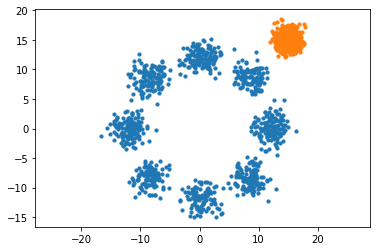

In [2]:
data = data_distrib(1000, '8gaussians', noise=0.0).numpy()
xq = torch.randn([1000, 2]) + 15
plt.scatter(data[:, 0], data[:, 1], s=10)
plt.scatter(x=xq[:, 0], y=xq[:, 1], s=10, label='q_t, the approximator')
plt.axis('equal')
plt.show()

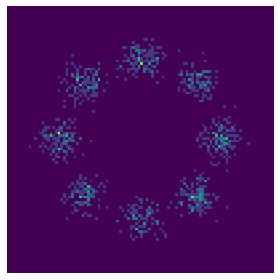

In [3]:
fig = plt.figure(figsize=(4, 4))
_ = plt.hist2d(data[:, 0], data[:, 1], 100, range=((-20, 20), (-20, 20)))
plt.axis('off')
plt.tight_layout()

In [4]:
bs = 100

# Data Loader (Input Pipeline)
train_loader = torch.utils.data.DataLoader(dataset=data, batch_size=bs, shuffle=True)
#test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=bs, shuffle=False)

In [5]:
class Discriminator(nn.Module):
    def __init__(self, d_input_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(d_input_dim, 512)
        self.fc2 = nn.Linear(self.fc1.out_features, self.fc1.out_features//2)
        #self.fc3 = nn.Linear(self.fc2.out_features, self.fc2.out_features//2)
        self.fc4 = nn.Linear(self.fc2.out_features, 1)
    
    # forward method
    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        #x = F.dropout(x, 0.3)
        x = F.leaky_relu(self.fc2(x), 0.2)
        #x = F.dropout(x, 0.3)
        #x = F.leaky_relu(self.fc3(x), 0.2)
        #x = F.dropout(x, 0.3)
        return self.fc4(x)
    

In [6]:
# build network
data_dim = 2

#G = Generator(g_input_dim = z_dim, g_output_dim = data_dim).to(device)
D = Discriminator(data_dim).to(device)

In [7]:
D

Discriminator(
  (fc1): Linear(in_features=2, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=256, bias=True)
  (fc4): Linear(in_features=256, out_features=1, bias=True)
)

In [8]:
# loss
criterion = nn.BCEWithLogitsLoss()

# optimizer
lr = 0.0002 

#x_wgf = data_distrib(5000, 'swiss', noise=0.02).to(device)
x_wgf = torch.randn([1000, 2]).to(device)+15
#x_wgf_gan = torch.randn([1000, 2]).to(device)
#x_wgf_gan_trick = torch.randn([1000, 2]).to(device)

x_wgf.requires_grad=True
#x_wgf_gan.requires_grad =True
#x_wgf_gan_trick.requires_grad=True


X_optimizer_wgf = optim.Adam([x_wgf], lr = 0.0001)
#X_optimizer_gan = optim.Adam([x_wgf_gan], lr = 0.01)
#X_optimizer_gan_trick = optim.Adam([x_wgf_gan_trick], lr = 0.01)

D_optimizer = optim.Adam(D.parameters(), lr = lr)

In [9]:
def D_train(x_real, x_fake, niter=10):
    
    #=======================Train the discriminator=======================#
    for i in range(niter):
        x_real, y_real = x_real.view(-1, data_dim), torch.ones(bs, 1)
        x_real, y_real = Variable(x_real.to(device)), Variable(y_real.to(device))
        x_fake, y_fake = x_fake, Variable(torch.zeros(bs, 1).to(device))
        #D.zero_grad()
        D_optimizer.zero_grad()
        # train discriminator on real
        

        D_output = D(x_real)
        D_real_loss = criterion(D_output, y_real)
        D_real_score = D_output

        # train discriminator on facke
        #z = Variable(torch.randn(bs, z_dim).to(device))
        

        D_output = D(x_fake)
        D_fake_loss = criterion(D_output, y_fake)
        D_fake_score = D_output

        # gradient backprop & optimize ONLY D's parameters
        D_loss = D_real_loss + D_fake_loss
        D_loss.backward()
        D_optimizer.step()
        
    return  D_loss.data.item()

In [10]:
#X_optimizer_wgf = optim.Adam([x_wgf], lr = 0.0001)
from torch.optim.lr_scheduler import StepLR
scheduler = StepLR(X_optimizer_wgf, step_size=1, gamma=1.0)
def G_train(a):
    #=======================Train the generator=======================#
    X_optimizer_wgf.zero_grad()
    
    
    y = Variable(torch.ones(x_wgf.shape[0], 1).to(device))

    D_output = D(x_wgf) #log ratio
    #G_loss = criterion(D_output, y)
    G_loss_wgf = -torch.mean(torch.log(torch.sigmoid(D_output))) #trick original gan
    #G_loss_wgf = torch.mean(torch.log(1.0 - torch.sigmoid(D_output + np.log(a/(1-a))))) #original gan
    #G_loss_wgf = -torch.mean(D_output) # gradient flow
    #G_loss_wgf = -torch.mean(-(torch.exp(D_output+2) -1)**2)
    #G_loss_wgf = torch.mean(torch.exp(D_output)*D_output)
    #G_loss_wgf = torch.mean(-torch.exp(0.1*D_output))
    # gradient backprop & optimize ONLY G's parameters
    G_loss_wgf.backward()
    
    X_optimizer_wgf.step()

    
    #return G_loss_wgf.data.item(), torch.mean(D_output)
    return torch.mean(D_output).data.item()

In [11]:
n_epoch = 30001
flow_t = []
for epoch in range(0, n_epoch):
    scheduler.step()
    a = 1 - (epoch+1)/(n_epoch+1)
    if epoch % 30 == 0:
        flow_t.append(x_wgf.detach().cpu().clone())
    D_losses, G_losses = [], []
    for batch_idx, x in enumerate(train_loader):
        idx = np.random.choice(len(x_wgf), bs, replace=False)
        x_fake = x_wgf[idx].clone()
        D_losses.append(D_train(x, x_fake, niter=1))
        G_losses.append(G_train(a))
    
    print('[%d/%d]: loss_d: %.3f, loss_g_wgf: %.3f' % (
            (epoch), n_epoch, torch.mean(torch.FloatTensor(D_losses)), torch.mean(torch.FloatTensor(G_losses))))
    print(X_optimizer_wgf.param_groups[0]['lr'])

/home/il19182/miniconda3/envs/pytorch/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:131: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


[0/30001]: loss_d: 1.035, loss_g_wgf: -4.159
0.0001
[1/30001]: loss_d: 0.342, loss_g_wgf: -2.733
0.0001
[2/30001]: loss_d: 0.270, loss_g_wgf: -2.882
0.0001
[3/30001]: loss_d: 0.245, loss_g_wgf: -3.093
0.0001
[4/30001]: loss_d: 0.231, loss_g_wgf: -2.819
0.0001
[5/30001]: loss_d: 0.226, loss_g_wgf: -3.105
0.0001
[6/30001]: loss_d: 0.221, loss_g_wgf: -2.939
0.0001
[7/30001]: loss_d: 0.217, loss_g_wgf: -2.998
0.0001
[8/30001]: loss_d: 0.215, loss_g_wgf: -2.972
0.0001
[9/30001]: loss_d: 0.210, loss_g_wgf: -3.007
0.0001
[10/30001]: loss_d: 0.206, loss_g_wgf: -3.094
0.0001
[11/30001]: loss_d: 0.202, loss_g_wgf: -2.978
0.0001
[12/30001]: loss_d: 0.199, loss_g_wgf: -3.131
0.0001
[13/30001]: loss_d: 0.195, loss_g_wgf: -3.037
0.0001
[14/30001]: loss_d: 0.193, loss_g_wgf: -3.269
0.0001
[15/30001]: loss_d: 0.194, loss_g_wgf: -3.196
0.0001
[16/30001]: loss_d: 0.190, loss_g_wgf: -3.078
0.0001
[17/30001]: loss_d: 0.182, loss_g_wgf: -3.283
0.0001
[18/30001]: loss_d: 0.181, loss_g_wgf: -3.200
0.0001
[19

[160/30001]: loss_d: 0.004, loss_g_wgf: -8.064
0.0001
[161/30001]: loss_d: 0.003, loss_g_wgf: -8.090
0.0001
[162/30001]: loss_d: 0.004, loss_g_wgf: -8.134
0.0001
[163/30001]: loss_d: 0.004, loss_g_wgf: -8.122
0.0001
[164/30001]: loss_d: 0.004, loss_g_wgf: -8.059
0.0001
[165/30001]: loss_d: 0.004, loss_g_wgf: -7.960
0.0001
[166/30001]: loss_d: 0.004, loss_g_wgf: -8.130
0.0001
[167/30001]: loss_d: 0.003, loss_g_wgf: -8.271
0.0001
[168/30001]: loss_d: 0.003, loss_g_wgf: -7.963
0.0001
[169/30001]: loss_d: 0.003, loss_g_wgf: -8.394
0.0001
[170/30001]: loss_d: 0.004, loss_g_wgf: -8.125
0.0001
[171/30001]: loss_d: 0.003, loss_g_wgf: -8.201
0.0001
[172/30001]: loss_d: 0.003, loss_g_wgf: -8.039
0.0001
[173/30001]: loss_d: 0.003, loss_g_wgf: -8.369
0.0001
[174/30001]: loss_d: 0.003, loss_g_wgf: -7.891
0.0001
[175/30001]: loss_d: 0.003, loss_g_wgf: -8.383
0.0001
[176/30001]: loss_d: 0.003, loss_g_wgf: -8.503
0.0001
[177/30001]: loss_d: 0.003, loss_g_wgf: -7.841
0.0001
[178/30001]: loss_d: 0.004, 

[314/30001]: loss_d: 0.001, loss_g_wgf: -10.917
0.0001
[315/30001]: loss_d: 0.001, loss_g_wgf: -10.366
0.0001
[316/30001]: loss_d: 0.001, loss_g_wgf: -11.048
0.0001
[317/30001]: loss_d: 0.001, loss_g_wgf: -10.341
0.0001
[318/30001]: loss_d: 0.001, loss_g_wgf: -10.854
0.0001
[319/30001]: loss_d: 0.001, loss_g_wgf: -10.986
0.0001
[320/30001]: loss_d: 0.001, loss_g_wgf: -10.295
0.0001
[321/30001]: loss_d: 0.001, loss_g_wgf: -11.309
0.0001
[322/30001]: loss_d: 0.001, loss_g_wgf: -10.307
0.0001
[323/30001]: loss_d: 0.001, loss_g_wgf: -10.588
0.0001
[324/30001]: loss_d: 0.001, loss_g_wgf: -10.974
0.0001
[325/30001]: loss_d: 0.001, loss_g_wgf: -10.928
0.0001
[326/30001]: loss_d: 0.001, loss_g_wgf: -10.889
0.0001
[327/30001]: loss_d: 0.001, loss_g_wgf: -11.128
0.0001
[328/30001]: loss_d: 0.001, loss_g_wgf: -10.562
0.0001
[329/30001]: loss_d: 0.001, loss_g_wgf: -11.119
0.0001
[330/30001]: loss_d: 0.001, loss_g_wgf: -10.685
0.0001
[331/30001]: loss_d: 0.001, loss_g_wgf: -10.972
0.0001
[332/30001

[468/30001]: loss_d: 0.000, loss_g_wgf: -13.265
0.0001
[469/30001]: loss_d: 0.000, loss_g_wgf: -12.832
0.0001
[470/30001]: loss_d: 0.000, loss_g_wgf: -13.064
0.0001
[471/30001]: loss_d: 0.000, loss_g_wgf: -12.894
0.0001
[472/30001]: loss_d: 0.000, loss_g_wgf: -13.127
0.0001
[473/30001]: loss_d: 0.000, loss_g_wgf: -13.119
0.0001
[474/30001]: loss_d: 0.000, loss_g_wgf: -12.486
0.0001
[475/30001]: loss_d: 0.000, loss_g_wgf: -12.780
0.0001
[476/30001]: loss_d: 0.000, loss_g_wgf: -13.091
0.0001
[477/30001]: loss_d: 0.000, loss_g_wgf: -13.012
0.0001
[478/30001]: loss_d: 0.001, loss_g_wgf: -13.312
0.0001
[479/30001]: loss_d: 0.001, loss_g_wgf: -13.650
0.0001
[480/30001]: loss_d: 0.000, loss_g_wgf: -12.878
0.0001
[481/30001]: loss_d: 0.001, loss_g_wgf: -13.053
0.0001
[482/30001]: loss_d: 0.001, loss_g_wgf: -13.015
0.0001
[483/30001]: loss_d: 0.003, loss_g_wgf: -13.262
0.0001
[484/30001]: loss_d: 0.007, loss_g_wgf: -14.778
0.0001
[485/30001]: loss_d: 0.006, loss_g_wgf: -16.138
0.0001
[486/30001

[621/30001]: loss_d: 0.000, loss_g_wgf: -15.045
0.0001
[622/30001]: loss_d: 0.000, loss_g_wgf: -14.828
0.0001
[623/30001]: loss_d: 0.000, loss_g_wgf: -14.985
0.0001
[624/30001]: loss_d: 0.000, loss_g_wgf: -14.825
0.0001
[625/30001]: loss_d: 0.001, loss_g_wgf: -14.550
0.0001
[626/30001]: loss_d: 0.001, loss_g_wgf: -15.883
0.0001
[627/30001]: loss_d: 0.032, loss_g_wgf: -17.969
0.0001
[628/30001]: loss_d: 0.018, loss_g_wgf: -17.310
0.0001
[629/30001]: loss_d: 0.005, loss_g_wgf: -15.960
0.0001
[630/30001]: loss_d: 0.004, loss_g_wgf: -14.489
0.0001
[631/30001]: loss_d: 0.002, loss_g_wgf: -16.156
0.0001
[632/30001]: loss_d: 0.002, loss_g_wgf: -14.847
0.0001
[633/30001]: loss_d: 0.000, loss_g_wgf: -14.623
0.0001
[634/30001]: loss_d: 0.001, loss_g_wgf: -14.606
0.0001
[635/30001]: loss_d: 0.001, loss_g_wgf: -16.057
0.0001
[636/30001]: loss_d: 0.001, loss_g_wgf: -14.201
0.0001
[637/30001]: loss_d: 0.001, loss_g_wgf: -15.378
0.0001
[638/30001]: loss_d: 0.000, loss_g_wgf: -14.744
0.0001
[639/30001

[775/30001]: loss_d: 0.000, loss_g_wgf: -15.210
0.0001
[776/30001]: loss_d: 0.000, loss_g_wgf: -16.195
0.0001
[777/30001]: loss_d: 0.000, loss_g_wgf: -15.191
0.0001
[778/30001]: loss_d: 0.000, loss_g_wgf: -16.371
0.0001
[779/30001]: loss_d: 0.000, loss_g_wgf: -15.830
0.0001
[780/30001]: loss_d: 0.000, loss_g_wgf: -15.640
0.0001
[781/30001]: loss_d: 0.000, loss_g_wgf: -16.487
0.0001
[782/30001]: loss_d: 0.000, loss_g_wgf: -15.789
0.0001
[783/30001]: loss_d: 0.000, loss_g_wgf: -15.483
0.0001
[784/30001]: loss_d: 0.001, loss_g_wgf: -15.931
0.0001
[785/30001]: loss_d: 0.000, loss_g_wgf: -15.539
0.0001
[786/30001]: loss_d: 0.000, loss_g_wgf: -17.352
0.0001
[787/30001]: loss_d: 0.000, loss_g_wgf: -16.020
0.0001
[788/30001]: loss_d: 0.000, loss_g_wgf: -16.700
0.0001
[789/30001]: loss_d: 0.000, loss_g_wgf: -16.131
0.0001
[790/30001]: loss_d: 0.000, loss_g_wgf: -16.354
0.0001
[791/30001]: loss_d: 0.000, loss_g_wgf: -15.966
0.0001
[792/30001]: loss_d: 0.000, loss_g_wgf: -15.974
0.0001
[793/30001

[929/30001]: loss_d: 0.000, loss_g_wgf: -14.512
0.0001
[930/30001]: loss_d: 0.000, loss_g_wgf: -14.727
0.0001
[931/30001]: loss_d: 0.000, loss_g_wgf: -14.666
0.0001
[932/30001]: loss_d: 0.000, loss_g_wgf: -14.695
0.0001
[933/30001]: loss_d: 0.000, loss_g_wgf: -14.805
0.0001
[934/30001]: loss_d: 0.000, loss_g_wgf: -14.754
0.0001
[935/30001]: loss_d: 0.000, loss_g_wgf: -14.853
0.0001
[936/30001]: loss_d: 0.000, loss_g_wgf: -14.773
0.0001
[937/30001]: loss_d: 0.000, loss_g_wgf: -14.845
0.0001
[938/30001]: loss_d: 0.000, loss_g_wgf: -15.277
0.0001
[939/30001]: loss_d: 0.000, loss_g_wgf: -14.761
0.0001
[940/30001]: loss_d: 0.000, loss_g_wgf: -14.651
0.0001
[941/30001]: loss_d: 0.000, loss_g_wgf: -14.804
0.0001
[942/30001]: loss_d: 0.001, loss_g_wgf: -15.393
0.0001
[943/30001]: loss_d: 0.001, loss_g_wgf: -14.447
0.0001
[944/30001]: loss_d: 0.000, loss_g_wgf: -14.853
0.0001
[945/30001]: loss_d: 0.000, loss_g_wgf: -15.343
0.0001
[946/30001]: loss_d: 0.000, loss_g_wgf: -14.509
0.0001
[947/30001

[1083/30001]: loss_d: 0.000, loss_g_wgf: -15.211
0.0001
[1084/30001]: loss_d: 0.000, loss_g_wgf: -15.610
0.0001
[1085/30001]: loss_d: 0.000, loss_g_wgf: -15.643
0.0001
[1086/30001]: loss_d: 0.001, loss_g_wgf: -15.749
0.0001
[1087/30001]: loss_d: 0.000, loss_g_wgf: -15.837
0.0001
[1088/30001]: loss_d: 0.000, loss_g_wgf: -14.967
0.0001
[1089/30001]: loss_d: 0.001, loss_g_wgf: -16.175
0.0001
[1090/30001]: loss_d: 0.000, loss_g_wgf: -16.044
0.0001
[1091/30001]: loss_d: 0.000, loss_g_wgf: -15.169
0.0001
[1092/30001]: loss_d: 0.000, loss_g_wgf: -15.645
0.0001
[1093/30001]: loss_d: 0.001, loss_g_wgf: -16.895
0.0001
[1094/30001]: loss_d: 0.001, loss_g_wgf: -14.251
0.0001
[1095/30001]: loss_d: 0.001, loss_g_wgf: -16.479
0.0001
[1096/30001]: loss_d: 0.001, loss_g_wgf: -15.539
0.0001
[1097/30001]: loss_d: 0.000, loss_g_wgf: -15.210
0.0001
[1098/30001]: loss_d: 0.000, loss_g_wgf: -15.875
0.0001
[1099/30001]: loss_d: 0.000, loss_g_wgf: -15.473
0.0001
[1100/30001]: loss_d: 0.000, loss_g_wgf: -15.784

[1230/30001]: loss_d: 0.001, loss_g_wgf: -15.176
0.0001
[1231/30001]: loss_d: 0.001, loss_g_wgf: -15.242
0.0001
[1232/30001]: loss_d: 0.001, loss_g_wgf: -14.955
0.0001
[1233/30001]: loss_d: 0.001, loss_g_wgf: -14.867
0.0001
[1234/30001]: loss_d: 0.000, loss_g_wgf: -14.751
0.0001
[1235/30001]: loss_d: 0.001, loss_g_wgf: -14.966
0.0001
[1236/30001]: loss_d: 0.001, loss_g_wgf: -14.959
0.0001
[1237/30001]: loss_d: 0.001, loss_g_wgf: -14.751
0.0001
[1238/30001]: loss_d: 0.001, loss_g_wgf: -14.827
0.0001
[1239/30001]: loss_d: 0.000, loss_g_wgf: -14.994
0.0001
[1240/30001]: loss_d: 0.001, loss_g_wgf: -14.597
0.0001
[1241/30001]: loss_d: 0.001, loss_g_wgf: -14.781
0.0001
[1242/30001]: loss_d: 0.001, loss_g_wgf: -14.833
0.0001
[1243/30001]: loss_d: 0.001, loss_g_wgf: -14.940
0.0001
[1244/30001]: loss_d: 0.001, loss_g_wgf: -15.371
0.0001
[1245/30001]: loss_d: 0.001, loss_g_wgf: -14.795
0.0001
[1246/30001]: loss_d: 0.001, loss_g_wgf: -14.675
0.0001
[1247/30001]: loss_d: 0.000, loss_g_wgf: -14.921

[1377/30001]: loss_d: 0.001, loss_g_wgf: -15.679
0.0001
[1378/30001]: loss_d: 0.001, loss_g_wgf: -15.784
0.0001
[1379/30001]: loss_d: 0.001, loss_g_wgf: -16.225
0.0001
[1380/30001]: loss_d: 0.001, loss_g_wgf: -15.391
0.0001
[1381/30001]: loss_d: 0.001, loss_g_wgf: -16.414
0.0001
[1382/30001]: loss_d: 0.001, loss_g_wgf: -16.075
0.0001
[1383/30001]: loss_d: 0.001, loss_g_wgf: -15.851
0.0001
[1384/30001]: loss_d: 0.001, loss_g_wgf: -16.306
0.0001
[1385/30001]: loss_d: 0.001, loss_g_wgf: -15.713
0.0001
[1386/30001]: loss_d: 0.001, loss_g_wgf: -16.124
0.0001
[1387/30001]: loss_d: 0.001, loss_g_wgf: -16.404
0.0001
[1388/30001]: loss_d: 0.001, loss_g_wgf: -15.546
0.0001
[1389/30001]: loss_d: 0.001, loss_g_wgf: -15.717
0.0001
[1390/30001]: loss_d: 0.001, loss_g_wgf: -16.213
0.0001
[1391/30001]: loss_d: 0.001, loss_g_wgf: -15.469
0.0001
[1392/30001]: loss_d: 0.001, loss_g_wgf: -16.851
0.0001
[1393/30001]: loss_d: 0.002, loss_g_wgf: -15.637
0.0001
[1394/30001]: loss_d: 0.001, loss_g_wgf: -15.998

[1524/30001]: loss_d: 0.002, loss_g_wgf: -17.624
0.0001
[1525/30001]: loss_d: 0.001, loss_g_wgf: -16.694
0.0001
[1526/30001]: loss_d: 0.001, loss_g_wgf: -16.564
0.0001
[1527/30001]: loss_d: 0.002, loss_g_wgf: -17.336
0.0001
[1528/30001]: loss_d: 0.002, loss_g_wgf: -17.168
0.0001
[1529/30001]: loss_d: 0.003, loss_g_wgf: -17.088
0.0001
[1530/30001]: loss_d: 0.002, loss_g_wgf: -16.841
0.0001
[1531/30001]: loss_d: 0.001, loss_g_wgf: -17.280
0.0001
[1532/30001]: loss_d: 0.001, loss_g_wgf: -17.342
0.0001
[1533/30001]: loss_d: 0.001, loss_g_wgf: -16.511
0.0001
[1534/30001]: loss_d: 0.002, loss_g_wgf: -16.954
0.0001
[1535/30001]: loss_d: 0.002, loss_g_wgf: -17.615
0.0001
[1536/30001]: loss_d: 0.002, loss_g_wgf: -16.836
0.0001
[1537/30001]: loss_d: 0.003, loss_g_wgf: -16.998
0.0001
[1538/30001]: loss_d: 0.005, loss_g_wgf: -17.621
0.0001
[1539/30001]: loss_d: 0.003, loss_g_wgf: -16.978
0.0001
[1540/30001]: loss_d: 0.002, loss_g_wgf: -16.732
0.0001
[1541/30001]: loss_d: 0.001, loss_g_wgf: -17.238

[1671/30001]: loss_d: 0.014, loss_g_wgf: -20.514
0.0001
[1672/30001]: loss_d: 0.004, loss_g_wgf: -15.639
0.0001
[1673/30001]: loss_d: 0.003, loss_g_wgf: -17.874
0.0001
[1674/30001]: loss_d: 0.002, loss_g_wgf: -16.401
0.0001
[1675/30001]: loss_d: 0.004, loss_g_wgf: -17.841
0.0001
[1676/30001]: loss_d: 0.001, loss_g_wgf: -16.848
0.0001
[1677/30001]: loss_d: 0.001, loss_g_wgf: -17.361
0.0001
[1678/30001]: loss_d: 0.002, loss_g_wgf: -17.146
0.0001
[1679/30001]: loss_d: 0.001, loss_g_wgf: -17.011
0.0001
[1680/30001]: loss_d: 0.001, loss_g_wgf: -17.328
0.0001
[1681/30001]: loss_d: 0.003, loss_g_wgf: -17.768
0.0001
[1682/30001]: loss_d: 0.002, loss_g_wgf: -16.512
0.0001
[1683/30001]: loss_d: 0.002, loss_g_wgf: -17.119
0.0001
[1684/30001]: loss_d: 0.002, loss_g_wgf: -17.147
0.0001
[1685/30001]: loss_d: 0.001, loss_g_wgf: -17.381
0.0001
[1686/30001]: loss_d: 0.002, loss_g_wgf: -16.949
0.0001
[1687/30001]: loss_d: 0.005, loss_g_wgf: -17.939
0.0001
[1688/30001]: loss_d: 0.009, loss_g_wgf: -17.459

[1818/30001]: loss_d: 0.001, loss_g_wgf: -16.987
0.0001
[1819/30001]: loss_d: 0.002, loss_g_wgf: -17.328
0.0001
[1820/30001]: loss_d: 0.001, loss_g_wgf: -17.104
0.0001
[1821/30001]: loss_d: 0.002, loss_g_wgf: -17.569
0.0001
[1822/30001]: loss_d: 0.002, loss_g_wgf: -16.800
0.0001
[1823/30001]: loss_d: 0.003, loss_g_wgf: -18.323
0.0001
[1824/30001]: loss_d: 0.004, loss_g_wgf: -16.665
0.0001
[1825/30001]: loss_d: 0.006, loss_g_wgf: -17.261
0.0001
[1826/30001]: loss_d: 0.003, loss_g_wgf: -17.803
0.0001
[1827/30001]: loss_d: 0.002, loss_g_wgf: -16.849
0.0001
[1828/30001]: loss_d: 0.008, loss_g_wgf: -17.354
0.0001
[1829/30001]: loss_d: 0.001, loss_g_wgf: -17.227
0.0001
[1830/30001]: loss_d: 0.002, loss_g_wgf: -17.091
0.0001
[1831/30001]: loss_d: 0.008, loss_g_wgf: -19.041
0.0001
[1832/30001]: loss_d: 0.004, loss_g_wgf: -17.451
0.0001
[1833/30001]: loss_d: 0.016, loss_g_wgf: -17.501
0.0001
[1834/30001]: loss_d: 0.010, loss_g_wgf: -19.442
0.0001
[1835/30001]: loss_d: 0.005, loss_g_wgf: -17.119

[1965/30001]: loss_d: 0.005, loss_g_wgf: -17.094
0.0001
[1966/30001]: loss_d: 0.005, loss_g_wgf: -16.919
0.0001
[1967/30001]: loss_d: 0.006, loss_g_wgf: -17.559
0.0001
[1968/30001]: loss_d: 0.008, loss_g_wgf: -16.643
0.0001
[1969/30001]: loss_d: 0.004, loss_g_wgf: -16.099
0.0001
[1970/30001]: loss_d: 0.007, loss_g_wgf: -17.649
0.0001
[1971/30001]: loss_d: 0.004, loss_g_wgf: -16.281
0.0001
[1972/30001]: loss_d: 0.004, loss_g_wgf: -17.534
0.0001
[1973/30001]: loss_d: 0.003, loss_g_wgf: -16.234
0.0001
[1974/30001]: loss_d: 0.003, loss_g_wgf: -16.723
0.0001
[1975/30001]: loss_d: 0.004, loss_g_wgf: -16.403
0.0001
[1976/30001]: loss_d: 0.003, loss_g_wgf: -16.462
0.0001
[1977/30001]: loss_d: 0.005, loss_g_wgf: -17.017
0.0001
[1978/30001]: loss_d: 0.003, loss_g_wgf: -16.762
0.0001
[1979/30001]: loss_d: 0.008, loss_g_wgf: -17.218
0.0001
[1980/30001]: loss_d: 0.004, loss_g_wgf: -17.038
0.0001
[1981/30001]: loss_d: 0.005, loss_g_wgf: -16.118
0.0001
[1982/30001]: loss_d: 0.003, loss_g_wgf: -16.725

[2112/30001]: loss_d: 0.006, loss_g_wgf: -15.330
0.0001
[2113/30001]: loss_d: 0.014, loss_g_wgf: -15.806
0.0001
[2114/30001]: loss_d: 0.007, loss_g_wgf: -15.777
0.0001
[2115/30001]: loss_d: 0.004, loss_g_wgf: -14.837
0.0001
[2116/30001]: loss_d: 0.007, loss_g_wgf: -15.699
0.0001
[2117/30001]: loss_d: 0.008, loss_g_wgf: -15.286
0.0001
[2118/30001]: loss_d: 0.012, loss_g_wgf: -15.264
0.0001
[2119/30001]: loss_d: 0.005, loss_g_wgf: -15.510
0.0001
[2120/30001]: loss_d: 0.007, loss_g_wgf: -14.902
0.0001
[2121/30001]: loss_d: 0.009, loss_g_wgf: -15.669
0.0001
[2122/30001]: loss_d: 0.010, loss_g_wgf: -15.397
0.0001
[2123/30001]: loss_d: 0.009, loss_g_wgf: -15.197
0.0001
[2124/30001]: loss_d: 0.005, loss_g_wgf: -15.330
0.0001
[2125/30001]: loss_d: 0.006, loss_g_wgf: -15.362
0.0001
[2126/30001]: loss_d: 0.006, loss_g_wgf: -15.369
0.0001
[2127/30001]: loss_d: 0.004, loss_g_wgf: -15.188
0.0001
[2128/30001]: loss_d: 0.005, loss_g_wgf: -15.082
0.0001
[2129/30001]: loss_d: 0.008, loss_g_wgf: -15.084

[2259/30001]: loss_d: 0.009, loss_g_wgf: -14.469
0.0001
[2260/30001]: loss_d: 0.010, loss_g_wgf: -15.229
0.0001
[2261/30001]: loss_d: 0.007, loss_g_wgf: -14.339
0.0001
[2262/30001]: loss_d: 0.009, loss_g_wgf: -14.726
0.0001
[2263/30001]: loss_d: 0.009, loss_g_wgf: -14.832
0.0001
[2264/30001]: loss_d: 0.010, loss_g_wgf: -14.759
0.0001
[2265/30001]: loss_d: 0.012, loss_g_wgf: -14.752
0.0001
[2266/30001]: loss_d: 0.006, loss_g_wgf: -14.559
0.0001
[2267/30001]: loss_d: 0.010, loss_g_wgf: -14.585
0.0001
[2268/30001]: loss_d: 0.010, loss_g_wgf: -14.366
0.0001
[2269/30001]: loss_d: 0.013, loss_g_wgf: -15.016
0.0001
[2270/30001]: loss_d: 0.014, loss_g_wgf: -14.943
0.0001
[2271/30001]: loss_d: 0.005, loss_g_wgf: -14.033
0.0001
[2272/30001]: loss_d: 0.009, loss_g_wgf: -14.674
0.0001
[2273/30001]: loss_d: 0.009, loss_g_wgf: -14.645
0.0001
[2274/30001]: loss_d: 0.009, loss_g_wgf: -14.375
0.0001
[2275/30001]: loss_d: 0.007, loss_g_wgf: -13.750
0.0001
[2276/30001]: loss_d: 0.009, loss_g_wgf: -14.897

[2406/30001]: loss_d: 0.035, loss_g_wgf: -13.901
0.0001
[2407/30001]: loss_d: 0.012, loss_g_wgf: -13.123
0.0001
[2408/30001]: loss_d: 0.015, loss_g_wgf: -13.544
0.0001
[2409/30001]: loss_d: 0.010, loss_g_wgf: -12.992
0.0001
[2410/30001]: loss_d: 0.011, loss_g_wgf: -12.676
0.0001
[2411/30001]: loss_d: 0.013, loss_g_wgf: -12.623
0.0001
[2412/30001]: loss_d: 0.010, loss_g_wgf: -12.997
0.0001
[2413/30001]: loss_d: 0.010, loss_g_wgf: -13.072
0.0001
[2414/30001]: loss_d: 0.019, loss_g_wgf: -13.305
0.0001
[2415/30001]: loss_d: 0.022, loss_g_wgf: -12.877
0.0001
[2416/30001]: loss_d: 0.026, loss_g_wgf: -14.554
0.0001
[2417/30001]: loss_d: 0.015, loss_g_wgf: -13.011
0.0001
[2418/30001]: loss_d: 0.025, loss_g_wgf: -13.534
0.0001
[2419/30001]: loss_d: 0.011, loss_g_wgf: -12.669
0.0001
[2420/30001]: loss_d: 0.015, loss_g_wgf: -13.342
0.0001
[2421/30001]: loss_d: 0.012, loss_g_wgf: -12.539
0.0001
[2422/30001]: loss_d: 0.010, loss_g_wgf: -12.731
0.0001
[2423/30001]: loss_d: 0.009, loss_g_wgf: -12.606

[2553/30001]: loss_d: 0.016, loss_g_wgf: -12.518
0.0001
[2554/30001]: loss_d: 0.015, loss_g_wgf: -11.943
0.0001
[2555/30001]: loss_d: 0.015, loss_g_wgf: -12.127
0.0001
[2556/30001]: loss_d: 0.018, loss_g_wgf: -12.578
0.0001
[2557/30001]: loss_d: 0.015, loss_g_wgf: -11.894
0.0001
[2558/30001]: loss_d: 0.020, loss_g_wgf: -12.389
0.0001
[2559/30001]: loss_d: 0.019, loss_g_wgf: -12.189
0.0001
[2560/30001]: loss_d: 0.017, loss_g_wgf: -12.476
0.0001
[2561/30001]: loss_d: 0.018, loss_g_wgf: -12.039
0.0001
[2562/30001]: loss_d: 0.017, loss_g_wgf: -12.423
0.0001
[2563/30001]: loss_d: 0.016, loss_g_wgf: -12.133
0.0001
[2564/30001]: loss_d: 0.017, loss_g_wgf: -11.944
0.0001
[2565/30001]: loss_d: 0.019, loss_g_wgf: -12.580
0.0001
[2566/30001]: loss_d: 0.019, loss_g_wgf: -12.130
0.0001
[2567/30001]: loss_d: 0.016, loss_g_wgf: -12.363
0.0001
[2568/30001]: loss_d: 0.019, loss_g_wgf: -11.591
0.0001
[2569/30001]: loss_d: 0.021, loss_g_wgf: -12.305
0.0001
[2570/30001]: loss_d: 0.015, loss_g_wgf: -12.162

[2700/30001]: loss_d: 0.023, loss_g_wgf: -11.319
0.0001
[2701/30001]: loss_d: 0.022, loss_g_wgf: -11.308
0.0001
[2702/30001]: loss_d: 0.021, loss_g_wgf: -11.396
0.0001
[2703/30001]: loss_d: 0.021, loss_g_wgf: -10.979
0.0001
[2704/30001]: loss_d: 0.023, loss_g_wgf: -11.771
0.0001
[2705/30001]: loss_d: 0.022, loss_g_wgf: -11.310
0.0001
[2706/30001]: loss_d: 0.024, loss_g_wgf: -11.313
0.0001
[2707/30001]: loss_d: 0.026, loss_g_wgf: -12.059
0.0001
[2708/30001]: loss_d: 0.023, loss_g_wgf: -10.950
0.0001
[2709/30001]: loss_d: 0.035, loss_g_wgf: -12.606
0.0001
[2710/30001]: loss_d: 0.025, loss_g_wgf: -11.380
0.0001
[2711/30001]: loss_d: 0.024, loss_g_wgf: -11.625
0.0001
[2712/30001]: loss_d: 0.019, loss_g_wgf: -11.164
0.0001
[2713/30001]: loss_d: 0.022, loss_g_wgf: -11.152
0.0001
[2714/30001]: loss_d: 0.017, loss_g_wgf: -11.245
0.0001
[2715/30001]: loss_d: 0.024, loss_g_wgf: -11.633
0.0001
[2716/30001]: loss_d: 0.022, loss_g_wgf: -11.169
0.0001
[2717/30001]: loss_d: 0.022, loss_g_wgf: -11.376

[2847/30001]: loss_d: 0.030, loss_g_wgf: -10.866
0.0001
[2848/30001]: loss_d: 0.027, loss_g_wgf: -10.546
0.0001
[2849/30001]: loss_d: 0.025, loss_g_wgf: -10.789
0.0001
[2850/30001]: loss_d: 0.032, loss_g_wgf: -10.735
0.0001
[2851/30001]: loss_d: 0.029, loss_g_wgf: -10.944
0.0001
[2852/30001]: loss_d: 0.027, loss_g_wgf: -10.520
0.0001
[2853/30001]: loss_d: 0.029, loss_g_wgf: -10.969
0.0001
[2854/30001]: loss_d: 0.025, loss_g_wgf: -10.322
0.0001
[2855/30001]: loss_d: 0.028, loss_g_wgf: -10.724
0.0001
[2856/30001]: loss_d: 0.034, loss_g_wgf: -10.266
0.0001
[2857/30001]: loss_d: 0.033, loss_g_wgf: -11.698
0.0001
[2858/30001]: loss_d: 0.030, loss_g_wgf: -10.236
0.0001
[2859/30001]: loss_d: 0.030, loss_g_wgf: -11.234
0.0001
[2860/30001]: loss_d: 0.025, loss_g_wgf: -10.220
0.0001
[2861/30001]: loss_d: 0.023, loss_g_wgf: -10.587
0.0001
[2862/30001]: loss_d: 0.027, loss_g_wgf: -10.517
0.0001
[2863/30001]: loss_d: 0.028, loss_g_wgf: -10.626
0.0001
[2864/30001]: loss_d: 0.026, loss_g_wgf: -10.341

[2994/30001]: loss_d: 0.032, loss_g_wgf: -9.960
0.0001
[2995/30001]: loss_d: 0.029, loss_g_wgf: -9.687
0.0001
[2996/30001]: loss_d: 0.032, loss_g_wgf: -9.880
0.0001
[2997/30001]: loss_d: 0.034, loss_g_wgf: -10.031
0.0001
[2998/30001]: loss_d: 0.027, loss_g_wgf: -9.705
0.0001
[2999/30001]: loss_d: 0.033, loss_g_wgf: -9.792
0.0001
[3000/30001]: loss_d: 0.038, loss_g_wgf: -10.738
0.0001
[3001/30001]: loss_d: 0.038, loss_g_wgf: -9.586
0.0001
[3002/30001]: loss_d: 0.037, loss_g_wgf: -9.643
0.0001
[3003/30001]: loss_d: 0.034, loss_g_wgf: -10.496
0.0001
[3004/30001]: loss_d: 0.030, loss_g_wgf: -9.361
0.0001
[3005/30001]: loss_d: 0.037, loss_g_wgf: -10.028
0.0001
[3006/30001]: loss_d: 0.035, loss_g_wgf: -10.257
0.0001
[3007/30001]: loss_d: 0.032, loss_g_wgf: -9.538
0.0001
[3008/30001]: loss_d: 0.038, loss_g_wgf: -10.010
0.0001
[3009/30001]: loss_d: 0.038, loss_g_wgf: -10.284
0.0001
[3010/30001]: loss_d: 0.036, loss_g_wgf: -9.623
0.0001
[3011/30001]: loss_d: 0.048, loss_g_wgf: -10.436
0.0001
[3

[3148/30001]: loss_d: 0.039, loss_g_wgf: -9.118
0.0001
[3149/30001]: loss_d: 0.039, loss_g_wgf: -8.839
0.0001
[3150/30001]: loss_d: 0.042, loss_g_wgf: -9.379
0.0001
[3151/30001]: loss_d: 0.043, loss_g_wgf: -9.189
0.0001
[3152/30001]: loss_d: 0.041, loss_g_wgf: -8.999
0.0001
[3153/30001]: loss_d: 0.043, loss_g_wgf: -9.486
0.0001
[3154/30001]: loss_d: 0.042, loss_g_wgf: -8.892
0.0001
[3155/30001]: loss_d: 0.047, loss_g_wgf: -9.984
0.0001
[3156/30001]: loss_d: 0.038, loss_g_wgf: -8.570
0.0001
[3157/30001]: loss_d: 0.041, loss_g_wgf: -9.105
0.0001
[3158/30001]: loss_d: 0.043, loss_g_wgf: -9.558
0.0001
[3159/30001]: loss_d: 0.038, loss_g_wgf: -8.841
0.0001
[3160/30001]: loss_d: 0.043, loss_g_wgf: -9.260
0.0001
[3161/30001]: loss_d: 0.041, loss_g_wgf: -9.110
0.0001
[3162/30001]: loss_d: 0.043, loss_g_wgf: -9.042
0.0001
[3163/30001]: loss_d: 0.053, loss_g_wgf: -9.761
0.0001
[3164/30001]: loss_d: 0.046, loss_g_wgf: -8.725
0.0001
[3165/30001]: loss_d: 0.050, loss_g_wgf: -9.669
0.0001
[3166/3000

[3302/30001]: loss_d: 0.059, loss_g_wgf: -8.897
0.0001
[3303/30001]: loss_d: 0.050, loss_g_wgf: -8.702
0.0001
[3304/30001]: loss_d: 0.051, loss_g_wgf: -8.547
0.0001
[3305/30001]: loss_d: 0.047, loss_g_wgf: -8.085
0.0001
[3306/30001]: loss_d: 0.045, loss_g_wgf: -8.692
0.0001
[3307/30001]: loss_d: 0.055, loss_g_wgf: -8.574
0.0001
[3308/30001]: loss_d: 0.051, loss_g_wgf: -8.540
0.0001
[3309/30001]: loss_d: 0.048, loss_g_wgf: -8.495
0.0001
[3310/30001]: loss_d: 0.048, loss_g_wgf: -8.201
0.0001
[3311/30001]: loss_d: 0.051, loss_g_wgf: -8.653
0.0001
[3312/30001]: loss_d: 0.047, loss_g_wgf: -8.387
0.0001
[3313/30001]: loss_d: 0.058, loss_g_wgf: -8.545
0.0001
[3314/30001]: loss_d: 0.053, loss_g_wgf: -9.165
0.0001
[3315/30001]: loss_d: 0.049, loss_g_wgf: -8.180
0.0001
[3316/30001]: loss_d: 0.047, loss_g_wgf: -8.674
0.0001
[3317/30001]: loss_d: 0.049, loss_g_wgf: -8.100
0.0001
[3318/30001]: loss_d: 0.052, loss_g_wgf: -8.873
0.0001
[3319/30001]: loss_d: 0.052, loss_g_wgf: -8.494
0.0001
[3320/3000

[3456/30001]: loss_d: 0.060, loss_g_wgf: -7.871
0.0001
[3457/30001]: loss_d: 0.060, loss_g_wgf: -8.073
0.0001
[3458/30001]: loss_d: 0.059, loss_g_wgf: -8.063
0.0001
[3459/30001]: loss_d: 0.058, loss_g_wgf: -7.911
0.0001
[3460/30001]: loss_d: 0.059, loss_g_wgf: -7.756
0.0001
[3461/30001]: loss_d: 0.057, loss_g_wgf: -7.808
0.0001
[3462/30001]: loss_d: 0.059, loss_g_wgf: -8.026
0.0001
[3463/30001]: loss_d: 0.068, loss_g_wgf: -7.963
0.0001
[3464/30001]: loss_d: 0.062, loss_g_wgf: -8.084
0.0001
[3465/30001]: loss_d: 0.064, loss_g_wgf: -7.906
0.0001
[3466/30001]: loss_d: 0.062, loss_g_wgf: -7.986
0.0001
[3467/30001]: loss_d: 0.055, loss_g_wgf: -7.748
0.0001
[3468/30001]: loss_d: 0.063, loss_g_wgf: -8.203
0.0001
[3469/30001]: loss_d: 0.059, loss_g_wgf: -7.633
0.0001
[3470/30001]: loss_d: 0.058, loss_g_wgf: -7.930
0.0001
[3471/30001]: loss_d: 0.062, loss_g_wgf: -8.069
0.0001
[3472/30001]: loss_d: 0.065, loss_g_wgf: -7.948
0.0001
[3473/30001]: loss_d: 0.069, loss_g_wgf: -8.105
0.0001
[3474/3000

[3610/30001]: loss_d: 0.072, loss_g_wgf: -7.616
0.0001
[3611/30001]: loss_d: 0.064, loss_g_wgf: -7.325
0.0001
[3612/30001]: loss_d: 0.069, loss_g_wgf: -7.345
0.0001
[3613/30001]: loss_d: 0.069, loss_g_wgf: -7.366
0.0001
[3614/30001]: loss_d: 0.077, loss_g_wgf: -7.799
0.0001
[3615/30001]: loss_d: 0.079, loss_g_wgf: -7.211
0.0001
[3616/30001]: loss_d: 0.076, loss_g_wgf: -7.441
0.0001
[3617/30001]: loss_d: 0.072, loss_g_wgf: -7.598
0.0001
[3618/30001]: loss_d: 0.067, loss_g_wgf: -7.365
0.0001
[3619/30001]: loss_d: 0.068, loss_g_wgf: -7.264
0.0001
[3620/30001]: loss_d: 0.070, loss_g_wgf: -7.316
0.0001
[3621/30001]: loss_d: 0.073, loss_g_wgf: -7.870
0.0001
[3622/30001]: loss_d: 0.066, loss_g_wgf: -6.914
0.0001
[3623/30001]: loss_d: 0.069, loss_g_wgf: -7.574
0.0001
[3624/30001]: loss_d: 0.069, loss_g_wgf: -7.354
0.0001
[3625/30001]: loss_d: 0.073, loss_g_wgf: -7.335
0.0001
[3626/30001]: loss_d: 0.071, loss_g_wgf: -7.600
0.0001
[3627/30001]: loss_d: 0.074, loss_g_wgf: -7.553
0.0001
[3628/3000

[3764/30001]: loss_d: 0.081, loss_g_wgf: -6.831
0.0001
[3765/30001]: loss_d: 0.077, loss_g_wgf: -6.743
0.0001
[3766/30001]: loss_d: 0.079, loss_g_wgf: -6.872
0.0001
[3767/30001]: loss_d: 0.078, loss_g_wgf: -6.916
0.0001
[3768/30001]: loss_d: 0.084, loss_g_wgf: -6.875
0.0001
[3769/30001]: loss_d: 0.077, loss_g_wgf: -6.599
0.0001
[3770/30001]: loss_d: 0.090, loss_g_wgf: -7.584
0.0001
[3771/30001]: loss_d: 0.091, loss_g_wgf: -6.663
0.0001
[3772/30001]: loss_d: 0.085, loss_g_wgf: -6.882
0.0001
[3773/30001]: loss_d: 0.087, loss_g_wgf: -7.087
0.0001
[3774/30001]: loss_d: 0.085, loss_g_wgf: -6.824
0.0001
[3775/30001]: loss_d: 0.083, loss_g_wgf: -6.703
0.0001
[3776/30001]: loss_d: 0.082, loss_g_wgf: -6.674
0.0001
[3777/30001]: loss_d: 0.084, loss_g_wgf: -7.210
0.0001
[3778/30001]: loss_d: 0.078, loss_g_wgf: -6.696
0.0001
[3779/30001]: loss_d: 0.087, loss_g_wgf: -7.121
0.0001
[3780/30001]: loss_d: 0.083, loss_g_wgf: -6.416
0.0001
[3781/30001]: loss_d: 0.083, loss_g_wgf: -6.828
0.0001
[3782/3000

[3918/30001]: loss_d: 0.097, loss_g_wgf: -6.211
0.0001
[3919/30001]: loss_d: 0.096, loss_g_wgf: -6.571
0.0001
[3920/30001]: loss_d: 0.101, loss_g_wgf: -6.512
0.0001
[3921/30001]: loss_d: 0.094, loss_g_wgf: -6.216
0.0001
[3922/30001]: loss_d: 0.099, loss_g_wgf: -6.730
0.0001
[3923/30001]: loss_d: 0.099, loss_g_wgf: -6.144
0.0001
[3924/30001]: loss_d: 0.097, loss_g_wgf: -6.483
0.0001
[3925/30001]: loss_d: 0.094, loss_g_wgf: -6.415
0.0001
[3926/30001]: loss_d: 0.097, loss_g_wgf: -6.301
0.0001
[3927/30001]: loss_d: 0.095, loss_g_wgf: -6.259
0.0001
[3928/30001]: loss_d: 0.101, loss_g_wgf: -6.622
0.0001
[3929/30001]: loss_d: 0.091, loss_g_wgf: -5.903
0.0001
[3930/30001]: loss_d: 0.097, loss_g_wgf: -6.698
0.0001
[3931/30001]: loss_d: 0.090, loss_g_wgf: -6.188
0.0001
[3932/30001]: loss_d: 0.097, loss_g_wgf: -6.283
0.0001
[3933/30001]: loss_d: 0.101, loss_g_wgf: -6.542
0.0001
[3934/30001]: loss_d: 0.090, loss_g_wgf: -6.013
0.0001
[3935/30001]: loss_d: 0.105, loss_g_wgf: -6.760
0.0001
[3936/3000

[4072/30001]: loss_d: 0.103, loss_g_wgf: -5.949
0.0001
[4073/30001]: loss_d: 0.108, loss_g_wgf: -5.881
0.0001
[4074/30001]: loss_d: 0.109, loss_g_wgf: -5.904
0.0001
[4075/30001]: loss_d: 0.106, loss_g_wgf: -5.743
0.0001
[4076/30001]: loss_d: 0.108, loss_g_wgf: -6.068
0.0001
[4077/30001]: loss_d: 0.111, loss_g_wgf: -5.805
0.0001
[4078/30001]: loss_d: 0.109, loss_g_wgf: -5.869
0.0001
[4079/30001]: loss_d: 0.106, loss_g_wgf: -5.807
0.0001
[4080/30001]: loss_d: 0.118, loss_g_wgf: -6.187
0.0001
[4081/30001]: loss_d: 0.115, loss_g_wgf: -5.907
0.0001
[4082/30001]: loss_d: 0.111, loss_g_wgf: -5.928
0.0001
[4083/30001]: loss_d: 0.114, loss_g_wgf: -6.051
0.0001
[4084/30001]: loss_d: 0.112, loss_g_wgf: -5.913
0.0001
[4085/30001]: loss_d: 0.114, loss_g_wgf: -5.973
0.0001
[4086/30001]: loss_d: 0.107, loss_g_wgf: -5.639
0.0001
[4087/30001]: loss_d: 0.117, loss_g_wgf: -6.163
0.0001
[4088/30001]: loss_d: 0.111, loss_g_wgf: -5.764
0.0001
[4089/30001]: loss_d: 0.115, loss_g_wgf: -5.864
0.0001
[4090/3000

[4226/30001]: loss_d: 0.126, loss_g_wgf: -5.531
0.0001
[4227/30001]: loss_d: 0.123, loss_g_wgf: -5.511
0.0001
[4228/30001]: loss_d: 0.124, loss_g_wgf: -5.282
0.0001
[4229/30001]: loss_d: 0.118, loss_g_wgf: -5.323
0.0001
[4230/30001]: loss_d: 0.122, loss_g_wgf: -5.460
0.0001
[4231/30001]: loss_d: 0.128, loss_g_wgf: -5.434
0.0001
[4232/30001]: loss_d: 0.123, loss_g_wgf: -5.418
0.0001
[4233/30001]: loss_d: 0.132, loss_g_wgf: -5.759
0.0001
[4234/30001]: loss_d: 0.122, loss_g_wgf: -5.279
0.0001
[4235/30001]: loss_d: 0.127, loss_g_wgf: -5.446
0.0001
[4236/30001]: loss_d: 0.133, loss_g_wgf: -5.521
0.0001
[4237/30001]: loss_d: 0.125, loss_g_wgf: -5.202
0.0001
[4238/30001]: loss_d: 0.120, loss_g_wgf: -5.497
0.0001
[4239/30001]: loss_d: 0.130, loss_g_wgf: -5.302
0.0001
[4240/30001]: loss_d: 0.129, loss_g_wgf: -5.711
0.0001
[4241/30001]: loss_d: 0.133, loss_g_wgf: -5.354
0.0001
[4242/30001]: loss_d: 0.128, loss_g_wgf: -5.118
0.0001
[4243/30001]: loss_d: 0.132, loss_g_wgf: -5.726
0.0001
[4244/3000

[4380/30001]: loss_d: 0.145, loss_g_wgf: -4.838
0.0001
[4381/30001]: loss_d: 0.140, loss_g_wgf: -4.963
0.0001
[4382/30001]: loss_d: 0.139, loss_g_wgf: -4.802
0.0001
[4383/30001]: loss_d: 0.149, loss_g_wgf: -4.991
0.0001
[4384/30001]: loss_d: 0.141, loss_g_wgf: -5.141
0.0001
[4385/30001]: loss_d: 0.138, loss_g_wgf: -4.871
0.0001
[4386/30001]: loss_d: 0.135, loss_g_wgf: -4.710
0.0001
[4387/30001]: loss_d: 0.141, loss_g_wgf: -5.166
0.0001
[4388/30001]: loss_d: 0.139, loss_g_wgf: -4.889
0.0001
[4389/30001]: loss_d: 0.143, loss_g_wgf: -4.866
0.0001
[4390/30001]: loss_d: 0.147, loss_g_wgf: -5.310
0.0001
[4391/30001]: loss_d: 0.139, loss_g_wgf: -4.677
0.0001
[4392/30001]: loss_d: 0.148, loss_g_wgf: -4.931
0.0001
[4393/30001]: loss_d: 0.142, loss_g_wgf: -4.940
0.0001
[4394/30001]: loss_d: 0.137, loss_g_wgf: -4.901
0.0001
[4395/30001]: loss_d: 0.145, loss_g_wgf: -5.034
0.0001
[4396/30001]: loss_d: 0.143, loss_g_wgf: -4.957
0.0001
[4397/30001]: loss_d: 0.140, loss_g_wgf: -4.846
0.0001
[4398/3000

[4534/30001]: loss_d: 0.162, loss_g_wgf: -4.411
0.0001
[4535/30001]: loss_d: 0.164, loss_g_wgf: -4.820
0.0001
[4536/30001]: loss_d: 0.162, loss_g_wgf: -4.374
0.0001
[4537/30001]: loss_d: 0.154, loss_g_wgf: -4.472
0.0001
[4538/30001]: loss_d: 0.162, loss_g_wgf: -4.594
0.0001
[4539/30001]: loss_d: 0.165, loss_g_wgf: -4.581
0.0001
[4540/30001]: loss_d: 0.157, loss_g_wgf: -4.550
0.0001
[4541/30001]: loss_d: 0.159, loss_g_wgf: -4.475
0.0001
[4542/30001]: loss_d: 0.162, loss_g_wgf: -4.792
0.0001
[4543/30001]: loss_d: 0.166, loss_g_wgf: -4.549
0.0001
[4544/30001]: loss_d: 0.167, loss_g_wgf: -4.583
0.0001
[4545/30001]: loss_d: 0.158, loss_g_wgf: -4.341
0.0001
[4546/30001]: loss_d: 0.154, loss_g_wgf: -4.598
0.0001
[4547/30001]: loss_d: 0.155, loss_g_wgf: -4.502
0.0001
[4548/30001]: loss_d: 0.160, loss_g_wgf: -4.525
0.0001
[4549/30001]: loss_d: 0.162, loss_g_wgf: -4.655
0.0001
[4550/30001]: loss_d: 0.161, loss_g_wgf: -4.505
0.0001
[4551/30001]: loss_d: 0.166, loss_g_wgf: -4.428
0.0001
[4552/3000

[4688/30001]: loss_d: 0.182, loss_g_wgf: -4.060
0.0001
[4689/30001]: loss_d: 0.180, loss_g_wgf: -4.368
0.0001
[4690/30001]: loss_d: 0.173, loss_g_wgf: -4.120
0.0001
[4691/30001]: loss_d: 0.172, loss_g_wgf: -4.106
0.0001
[4692/30001]: loss_d: 0.185, loss_g_wgf: -4.442
0.0001
[4693/30001]: loss_d: 0.179, loss_g_wgf: -4.103
0.0001
[4694/30001]: loss_d: 0.176, loss_g_wgf: -4.196
0.0001
[4695/30001]: loss_d: 0.175, loss_g_wgf: -4.159
0.0001
[4696/30001]: loss_d: 0.180, loss_g_wgf: -4.266
0.0001
[4697/30001]: loss_d: 0.181, loss_g_wgf: -4.143
0.0001
[4698/30001]: loss_d: 0.181, loss_g_wgf: -4.045
0.0001
[4699/30001]: loss_d: 0.176, loss_g_wgf: -4.034
0.0001
[4700/30001]: loss_d: 0.184, loss_g_wgf: -4.315
0.0001
[4701/30001]: loss_d: 0.178, loss_g_wgf: -4.105
0.0001
[4702/30001]: loss_d: 0.188, loss_g_wgf: -4.292
0.0001
[4703/30001]: loss_d: 0.182, loss_g_wgf: -3.996
0.0001
[4704/30001]: loss_d: 0.179, loss_g_wgf: -4.385
0.0001
[4705/30001]: loss_d: 0.173, loss_g_wgf: -3.933
0.0001
[4706/3000

[4842/30001]: loss_d: 0.201, loss_g_wgf: -3.930
0.0001
[4843/30001]: loss_d: 0.197, loss_g_wgf: -3.990
0.0001
[4844/30001]: loss_d: 0.197, loss_g_wgf: -3.708
0.0001
[4845/30001]: loss_d: 0.194, loss_g_wgf: -3.887
0.0001
[4846/30001]: loss_d: 0.200, loss_g_wgf: -3.832
0.0001
[4847/30001]: loss_d: 0.198, loss_g_wgf: -3.922
0.0001
[4848/30001]: loss_d: 0.200, loss_g_wgf: -3.835
0.0001
[4849/30001]: loss_d: 0.193, loss_g_wgf: -4.014
0.0001
[4850/30001]: loss_d: 0.200, loss_g_wgf: -3.660
0.0001
[4851/30001]: loss_d: 0.203, loss_g_wgf: -3.820
0.0001
[4852/30001]: loss_d: 0.197, loss_g_wgf: -3.876
0.0001
[4853/30001]: loss_d: 0.201, loss_g_wgf: -3.893
0.0001
[4854/30001]: loss_d: 0.197, loss_g_wgf: -3.737
0.0001
[4855/30001]: loss_d: 0.195, loss_g_wgf: -3.877
0.0001
[4856/30001]: loss_d: 0.193, loss_g_wgf: -3.780
0.0001
[4857/30001]: loss_d: 0.196, loss_g_wgf: -3.704
0.0001
[4858/30001]: loss_d: 0.204, loss_g_wgf: -3.921
0.0001
[4859/30001]: loss_d: 0.199, loss_g_wgf: -3.766
0.0001
[4860/3000

[4996/30001]: loss_d: 0.211, loss_g_wgf: -3.387
0.0001
[4997/30001]: loss_d: 0.214, loss_g_wgf: -3.654
0.0001
[4998/30001]: loss_d: 0.215, loss_g_wgf: -3.548
0.0001
[4999/30001]: loss_d: 0.218, loss_g_wgf: -3.697
0.0001
[5000/30001]: loss_d: 0.214, loss_g_wgf: -3.512
0.0001
[5001/30001]: loss_d: 0.221, loss_g_wgf: -3.695
0.0001
[5002/30001]: loss_d: 0.211, loss_g_wgf: -3.498
0.0001
[5003/30001]: loss_d: 0.211, loss_g_wgf: -3.421
0.0001
[5004/30001]: loss_d: 0.215, loss_g_wgf: -3.565
0.0001
[5005/30001]: loss_d: 0.214, loss_g_wgf: -3.664
0.0001
[5006/30001]: loss_d: 0.211, loss_g_wgf: -3.381
0.0001
[5007/30001]: loss_d: 0.217, loss_g_wgf: -3.717
0.0001
[5008/30001]: loss_d: 0.214, loss_g_wgf: -3.490
0.0001
[5009/30001]: loss_d: 0.213, loss_g_wgf: -3.662
0.0001
[5010/30001]: loss_d: 0.207, loss_g_wgf: -3.322
0.0001
[5011/30001]: loss_d: 0.213, loss_g_wgf: -3.567
0.0001
[5012/30001]: loss_d: 0.217, loss_g_wgf: -3.445
0.0001
[5013/30001]: loss_d: 0.211, loss_g_wgf: -3.645
0.0001
[5014/3000

[5150/30001]: loss_d: 0.230, loss_g_wgf: -3.404
0.0001
[5151/30001]: loss_d: 0.229, loss_g_wgf: -3.178
0.0001
[5152/30001]: loss_d: 0.229, loss_g_wgf: -3.314
0.0001
[5153/30001]: loss_d: 0.227, loss_g_wgf: -3.213
0.0001
[5154/30001]: loss_d: 0.236, loss_g_wgf: -3.620
0.0001
[5155/30001]: loss_d: 0.228, loss_g_wgf: -3.044
0.0001
[5156/30001]: loss_d: 0.230, loss_g_wgf: -3.439
0.0001
[5157/30001]: loss_d: 0.240, loss_g_wgf: -3.430
0.0001
[5158/30001]: loss_d: 0.242, loss_g_wgf: -3.169
0.0001
[5159/30001]: loss_d: 0.235, loss_g_wgf: -3.453
0.0001
[5160/30001]: loss_d: 0.235, loss_g_wgf: -3.231
0.0001
[5161/30001]: loss_d: 0.227, loss_g_wgf: -3.180
0.0001
[5162/30001]: loss_d: 0.232, loss_g_wgf: -3.413
0.0001
[5163/30001]: loss_d: 0.236, loss_g_wgf: -3.248
0.0001
[5164/30001]: loss_d: 0.232, loss_g_wgf: -3.199
0.0001
[5165/30001]: loss_d: 0.232, loss_g_wgf: -3.354
0.0001
[5166/30001]: loss_d: 0.230, loss_g_wgf: -3.178
0.0001
[5167/30001]: loss_d: 0.234, loss_g_wgf: -3.338
0.0001
[5168/3000

[5304/30001]: loss_d: 0.244, loss_g_wgf: -3.112
0.0001
[5305/30001]: loss_d: 0.245, loss_g_wgf: -3.139
0.0001
[5306/30001]: loss_d: 0.247, loss_g_wgf: -3.112
0.0001
[5307/30001]: loss_d: 0.252, loss_g_wgf: -3.033
0.0001
[5308/30001]: loss_d: 0.250, loss_g_wgf: -3.188
0.0001
[5309/30001]: loss_d: 0.249, loss_g_wgf: -3.204
0.0001
[5310/30001]: loss_d: 0.253, loss_g_wgf: -2.910
0.0001
[5311/30001]: loss_d: 0.260, loss_g_wgf: -3.311
0.0001
[5312/30001]: loss_d: 0.255, loss_g_wgf: -3.091
0.0001
[5313/30001]: loss_d: 0.248, loss_g_wgf: -3.074
0.0001
[5314/30001]: loss_d: 0.249, loss_g_wgf: -3.026
0.0001
[5315/30001]: loss_d: 0.255, loss_g_wgf: -3.036
0.0001
[5316/30001]: loss_d: 0.255, loss_g_wgf: -3.367
0.0001
[5317/30001]: loss_d: 0.252, loss_g_wgf: -2.836
0.0001
[5318/30001]: loss_d: 0.249, loss_g_wgf: -3.152
0.0001
[5319/30001]: loss_d: 0.245, loss_g_wgf: -2.955
0.0001
[5320/30001]: loss_d: 0.244, loss_g_wgf: -3.212
0.0001
[5321/30001]: loss_d: 0.258, loss_g_wgf: -2.935
0.0001
[5322/3000

[5455/30001]: loss_d: 0.265, loss_g_wgf: -2.948
0.0001
[5456/30001]: loss_d: 0.266, loss_g_wgf: -2.933
0.0001
[5457/30001]: loss_d: 0.271, loss_g_wgf: -2.818
0.0001
[5458/30001]: loss_d: 0.266, loss_g_wgf: -2.991
0.0001
[5459/30001]: loss_d: 0.267, loss_g_wgf: -2.875
0.0001
[5460/30001]: loss_d: 0.261, loss_g_wgf: -3.035
0.0001
[5461/30001]: loss_d: 0.263, loss_g_wgf: -2.795
0.0001
[5462/30001]: loss_d: 0.268, loss_g_wgf: -2.943
0.0001
[5463/30001]: loss_d: 0.263, loss_g_wgf: -2.856
0.0001
[5464/30001]: loss_d: 0.259, loss_g_wgf: -2.883
0.0001
[5465/30001]: loss_d: 0.266, loss_g_wgf: -2.865
0.0001
[5466/30001]: loss_d: 0.262, loss_g_wgf: -2.997
0.0001
[5467/30001]: loss_d: 0.266, loss_g_wgf: -2.830
0.0001
[5468/30001]: loss_d: 0.266, loss_g_wgf: -2.828
0.0001
[5469/30001]: loss_d: 0.264, loss_g_wgf: -3.038
0.0001
[5470/30001]: loss_d: 0.270, loss_g_wgf: -2.861
0.0001
[5471/30001]: loss_d: 0.269, loss_g_wgf: -2.968
0.0001
[5472/30001]: loss_d: 0.270, loss_g_wgf: -2.766
0.0001
[5473/3000

[5606/30001]: loss_d: 0.273, loss_g_wgf: -2.787
0.0001
[5607/30001]: loss_d: 0.280, loss_g_wgf: -2.787
0.0001
[5608/30001]: loss_d: 0.274, loss_g_wgf: -2.823
0.0001
[5609/30001]: loss_d: 0.276, loss_g_wgf: -2.677
0.0001
[5610/30001]: loss_d: 0.287, loss_g_wgf: -2.847
0.0001
[5611/30001]: loss_d: 0.276, loss_g_wgf: -2.677
0.0001
[5612/30001]: loss_d: 0.277, loss_g_wgf: -2.937
0.0001
[5613/30001]: loss_d: 0.283, loss_g_wgf: -2.631
0.0001
[5614/30001]: loss_d: 0.288, loss_g_wgf: -2.992
0.0001
[5615/30001]: loss_d: 0.288, loss_g_wgf: -2.762
0.0001
[5616/30001]: loss_d: 0.286, loss_g_wgf: -2.713
0.0001
[5617/30001]: loss_d: 0.283, loss_g_wgf: -2.787
0.0001
[5618/30001]: loss_d: 0.282, loss_g_wgf: -2.761
0.0001
[5619/30001]: loss_d: 0.283, loss_g_wgf: -2.738
0.0001
[5620/30001]: loss_d: 0.278, loss_g_wgf: -2.631
0.0001
[5621/30001]: loss_d: 0.283, loss_g_wgf: -2.946
0.0001
[5622/30001]: loss_d: 0.284, loss_g_wgf: -2.777
0.0001
[5623/30001]: loss_d: 0.278, loss_g_wgf: -2.756
0.0001
[5624/3000

[5756/30001]: loss_d: 0.293, loss_g_wgf: -2.625
0.0001
[5757/30001]: loss_d: 0.294, loss_g_wgf: -2.738
0.0001
[5758/30001]: loss_d: 0.297, loss_g_wgf: -2.632
0.0001
[5759/30001]: loss_d: 0.300, loss_g_wgf: -2.780
0.0001
[5760/30001]: loss_d: 0.295, loss_g_wgf: -2.476
0.0001
[5761/30001]: loss_d: 0.288, loss_g_wgf: -2.851
0.0001
[5762/30001]: loss_d: 0.294, loss_g_wgf: -2.573
0.0001
[5763/30001]: loss_d: 0.298, loss_g_wgf: -2.708
0.0001
[5764/30001]: loss_d: 0.298, loss_g_wgf: -2.713
0.0001
[5765/30001]: loss_d: 0.295, loss_g_wgf: -2.720
0.0001
[5766/30001]: loss_d: 0.295, loss_g_wgf: -2.577
0.0001
[5767/30001]: loss_d: 0.292, loss_g_wgf: -2.597
0.0001
[5768/30001]: loss_d: 0.295, loss_g_wgf: -2.626
0.0001
[5769/30001]: loss_d: 0.299, loss_g_wgf: -2.787
0.0001
[5770/30001]: loss_d: 0.290, loss_g_wgf: -2.508
0.0001
[5771/30001]: loss_d: 0.298, loss_g_wgf: -2.759
0.0001
[5772/30001]: loss_d: 0.305, loss_g_wgf: -2.660
0.0001
[5773/30001]: loss_d: 0.300, loss_g_wgf: -2.716
0.0001
[5774/3000

[5907/30001]: loss_d: 0.306, loss_g_wgf: -2.501
0.0001
[5908/30001]: loss_d: 0.305, loss_g_wgf: -2.579
0.0001
[5909/30001]: loss_d: 0.305, loss_g_wgf: -2.439
0.0001
[5910/30001]: loss_d: 0.312, loss_g_wgf: -2.867
0.0001
[5911/30001]: loss_d: 0.309, loss_g_wgf: -2.319
0.0001
[5912/30001]: loss_d: 0.315, loss_g_wgf: -2.901
0.0001
[5913/30001]: loss_d: 0.314, loss_g_wgf: -2.537
0.0001
[5914/30001]: loss_d: 0.309, loss_g_wgf: -2.548
0.0001
[5915/30001]: loss_d: 0.312, loss_g_wgf: -2.537
0.0001
[5916/30001]: loss_d: 0.307, loss_g_wgf: -2.469
0.0001
[5917/30001]: loss_d: 0.312, loss_g_wgf: -2.626
0.0001
[5918/30001]: loss_d: 0.315, loss_g_wgf: -2.679
0.0001
[5919/30001]: loss_d: 0.305, loss_g_wgf: -2.447
0.0001
[5920/30001]: loss_d: 0.311, loss_g_wgf: -2.680
0.0001
[5921/30001]: loss_d: 0.312, loss_g_wgf: -2.452
0.0001
[5922/30001]: loss_d: 0.308, loss_g_wgf: -2.551
0.0001
[5923/30001]: loss_d: 0.308, loss_g_wgf: -2.586
0.0001
[5924/30001]: loss_d: 0.311, loss_g_wgf: -2.544
0.0001
[5925/3000

[6061/30001]: loss_d: 0.321, loss_g_wgf: -2.624
0.0001
[6062/30001]: loss_d: 0.327, loss_g_wgf: -2.314
0.0001
[6063/30001]: loss_d: 0.327, loss_g_wgf: -2.597
0.0001
[6064/30001]: loss_d: 0.320, loss_g_wgf: -2.562
0.0001
[6065/30001]: loss_d: 0.322, loss_g_wgf: -2.443
0.0001
[6066/30001]: loss_d: 0.320, loss_g_wgf: -2.562
0.0001
[6067/30001]: loss_d: 0.318, loss_g_wgf: -2.442
0.0001
[6068/30001]: loss_d: 0.317, loss_g_wgf: -2.497
0.0001
[6069/30001]: loss_d: 0.322, loss_g_wgf: -2.421
0.0001
[6070/30001]: loss_d: 0.317, loss_g_wgf: -2.482
0.0001
[6071/30001]: loss_d: 0.322, loss_g_wgf: -2.591
0.0001
[6072/30001]: loss_d: 0.322, loss_g_wgf: -2.493
0.0001
[6073/30001]: loss_d: 0.321, loss_g_wgf: -2.440
0.0001
[6074/30001]: loss_d: 0.314, loss_g_wgf: -2.496
0.0001
[6075/30001]: loss_d: 0.318, loss_g_wgf: -2.477
0.0001
[6076/30001]: loss_d: 0.316, loss_g_wgf: -2.448
0.0001
[6077/30001]: loss_d: 0.320, loss_g_wgf: -2.484
0.0001
[6078/30001]: loss_d: 0.322, loss_g_wgf: -2.414
0.0001
[6079/3000

[6215/30001]: loss_d: 0.331, loss_g_wgf: -2.552
0.0001
[6216/30001]: loss_d: 0.336, loss_g_wgf: -2.340
0.0001
[6217/30001]: loss_d: 0.330, loss_g_wgf: -2.449
0.0001
[6218/30001]: loss_d: 0.331, loss_g_wgf: -2.366
0.0001
[6219/30001]: loss_d: 0.326, loss_g_wgf: -2.466
0.0001
[6220/30001]: loss_d: 0.330, loss_g_wgf: -2.375
0.0001
[6221/30001]: loss_d: 0.333, loss_g_wgf: -2.477
0.0001
[6222/30001]: loss_d: 0.326, loss_g_wgf: -2.426
0.0001
[6223/30001]: loss_d: 0.330, loss_g_wgf: -2.397
0.0001
[6224/30001]: loss_d: 0.328, loss_g_wgf: -2.406
0.0001
[6225/30001]: loss_d: 0.332, loss_g_wgf: -2.512
0.0001
[6226/30001]: loss_d: 0.329, loss_g_wgf: -2.350
0.0001
[6227/30001]: loss_d: 0.326, loss_g_wgf: -2.363
0.0001
[6228/30001]: loss_d: 0.333, loss_g_wgf: -2.563
0.0001
[6229/30001]: loss_d: 0.332, loss_g_wgf: -2.340
0.0001
[6230/30001]: loss_d: 0.330, loss_g_wgf: -2.540
0.0001
[6231/30001]: loss_d: 0.330, loss_g_wgf: -2.288
0.0001
[6232/30001]: loss_d: 0.329, loss_g_wgf: -2.510
0.0001
[6233/3000

[6369/30001]: loss_d: 0.340, loss_g_wgf: -2.297
0.0001
[6370/30001]: loss_d: 0.335, loss_g_wgf: -2.367
0.0001
[6371/30001]: loss_d: 0.341, loss_g_wgf: -2.476
0.0001
[6372/30001]: loss_d: 0.339, loss_g_wgf: -2.317
0.0001
[6373/30001]: loss_d: 0.339, loss_g_wgf: -2.312
0.0001
[6374/30001]: loss_d: 0.341, loss_g_wgf: -2.429
0.0001
[6375/30001]: loss_d: 0.338, loss_g_wgf: -2.455
0.0001
[6376/30001]: loss_d: 0.338, loss_g_wgf: -2.154
0.0001
[6377/30001]: loss_d: 0.340, loss_g_wgf: -2.534
0.0001
[6378/30001]: loss_d: 0.341, loss_g_wgf: -2.447
0.0001
[6379/30001]: loss_d: 0.342, loss_g_wgf: -2.250
0.0001
[6380/30001]: loss_d: 0.340, loss_g_wgf: -2.446
0.0001
[6381/30001]: loss_d: 0.341, loss_g_wgf: -2.335
0.0001
[6382/30001]: loss_d: 0.340, loss_g_wgf: -2.431
0.0001
[6383/30001]: loss_d: 0.339, loss_g_wgf: -2.337
0.0001
[6384/30001]: loss_d: 0.344, loss_g_wgf: -2.383
0.0001
[6385/30001]: loss_d: 0.339, loss_g_wgf: -2.307
0.0001
[6386/30001]: loss_d: 0.337, loss_g_wgf: -2.496
0.0001
[6387/3000

[6520/30001]: loss_d: 0.343, loss_g_wgf: -2.239
0.0001
[6521/30001]: loss_d: 0.350, loss_g_wgf: -2.345
0.0001
[6522/30001]: loss_d: 0.343, loss_g_wgf: -2.330
0.0001
[6523/30001]: loss_d: 0.343, loss_g_wgf: -2.340
0.0001
[6524/30001]: loss_d: 0.341, loss_g_wgf: -2.283
0.0001
[6525/30001]: loss_d: 0.345, loss_g_wgf: -2.259
0.0001
[6526/30001]: loss_d: 0.346, loss_g_wgf: -2.481
0.0001
[6527/30001]: loss_d: 0.344, loss_g_wgf: -2.247
0.0001
[6528/30001]: loss_d: 0.343, loss_g_wgf: -2.321
0.0001
[6529/30001]: loss_d: 0.349, loss_g_wgf: -2.312
0.0001
[6530/30001]: loss_d: 0.346, loss_g_wgf: -2.439
0.0001
[6531/30001]: loss_d: 0.345, loss_g_wgf: -2.265
0.0001
[6532/30001]: loss_d: 0.344, loss_g_wgf: -2.390
0.0001
[6533/30001]: loss_d: 0.346, loss_g_wgf: -2.268
0.0001
[6534/30001]: loss_d: 0.349, loss_g_wgf: -2.322
0.0001
[6535/30001]: loss_d: 0.344, loss_g_wgf: -2.376
0.0001
[6536/30001]: loss_d: 0.350, loss_g_wgf: -2.233
0.0001
[6537/30001]: loss_d: 0.348, loss_g_wgf: -2.408
0.0001
[6538/3000

[6674/30001]: loss_d: 0.352, loss_g_wgf: -2.290
0.0001
[6675/30001]: loss_d: 0.351, loss_g_wgf: -2.273
0.0001
[6676/30001]: loss_d: 0.348, loss_g_wgf: -2.408
0.0001
[6677/30001]: loss_d: 0.351, loss_g_wgf: -2.147
0.0001
[6678/30001]: loss_d: 0.348, loss_g_wgf: -2.369
0.0001
[6679/30001]: loss_d: 0.350, loss_g_wgf: -2.291
0.0001
[6680/30001]: loss_d: 0.349, loss_g_wgf: -2.247
0.0001
[6681/30001]: loss_d: 0.353, loss_g_wgf: -2.376
0.0001
[6682/30001]: loss_d: 0.349, loss_g_wgf: -2.208
0.0001
[6683/30001]: loss_d: 0.346, loss_g_wgf: -2.335
0.0001
[6684/30001]: loss_d: 0.346, loss_g_wgf: -2.267
0.0001
[6685/30001]: loss_d: 0.351, loss_g_wgf: -2.319
0.0001
[6686/30001]: loss_d: 0.353, loss_g_wgf: -2.355
0.0001
[6687/30001]: loss_d: 0.350, loss_g_wgf: -2.254
0.0001
[6688/30001]: loss_d: 0.352, loss_g_wgf: -2.322
0.0001
[6689/30001]: loss_d: 0.351, loss_g_wgf: -2.320
0.0001
[6690/30001]: loss_d: 0.355, loss_g_wgf: -2.194
0.0001
[6691/30001]: loss_d: 0.352, loss_g_wgf: -2.421
0.0001
[6692/3000

[6828/30001]: loss_d: 0.352, loss_g_wgf: -2.274
0.0001
[6829/30001]: loss_d: 0.354, loss_g_wgf: -2.273
0.0001
[6830/30001]: loss_d: 0.351, loss_g_wgf: -2.204
0.0001
[6831/30001]: loss_d: 0.355, loss_g_wgf: -2.349
0.0001
[6832/30001]: loss_d: 0.355, loss_g_wgf: -2.241
0.0001
[6833/30001]: loss_d: 0.353, loss_g_wgf: -2.238
0.0001
[6834/30001]: loss_d: 0.353, loss_g_wgf: -2.377
0.0001
[6835/30001]: loss_d: 0.355, loss_g_wgf: -2.135
0.0001
[6836/30001]: loss_d: 0.354, loss_g_wgf: -2.452
0.0001
[6837/30001]: loss_d: 0.356, loss_g_wgf: -2.224
0.0001
[6838/30001]: loss_d: 0.351, loss_g_wgf: -2.191
0.0001
[6839/30001]: loss_d: 0.353, loss_g_wgf: -2.341
0.0001
[6840/30001]: loss_d: 0.354, loss_g_wgf: -2.231
0.0001
[6841/30001]: loss_d: 0.352, loss_g_wgf: -2.346
0.0001
[6842/30001]: loss_d: 0.358, loss_g_wgf: -2.229
0.0001
[6843/30001]: loss_d: 0.352, loss_g_wgf: -2.400
0.0001
[6844/30001]: loss_d: 0.356, loss_g_wgf: -2.114
0.0001
[6845/30001]: loss_d: 0.354, loss_g_wgf: -2.382
0.0001
[6846/3000

[6982/30001]: loss_d: 0.352, loss_g_wgf: -2.184
0.0001
[6983/30001]: loss_d: 0.356, loss_g_wgf: -2.275
0.0001
[6984/30001]: loss_d: 0.355, loss_g_wgf: -2.361
0.0001
[6985/30001]: loss_d: 0.358, loss_g_wgf: -2.106
0.0001
[6986/30001]: loss_d: 0.357, loss_g_wgf: -2.420
0.0001
[6987/30001]: loss_d: 0.354, loss_g_wgf: -2.147
0.0001
[6988/30001]: loss_d: 0.358, loss_g_wgf: -2.395
0.0001
[6989/30001]: loss_d: 0.353, loss_g_wgf: -2.104
0.0001
[6990/30001]: loss_d: 0.352, loss_g_wgf: -2.336
0.0001
[6991/30001]: loss_d: 0.352, loss_g_wgf: -2.159
0.0001
[6992/30001]: loss_d: 0.353, loss_g_wgf: -2.256
0.0001
[6993/30001]: loss_d: 0.358, loss_g_wgf: -2.422
0.0001
[6994/30001]: loss_d: 0.357, loss_g_wgf: -2.157
0.0001
[6995/30001]: loss_d: 0.354, loss_g_wgf: -2.345
0.0001
[6996/30001]: loss_d: 0.356, loss_g_wgf: -2.073
0.0001
[6997/30001]: loss_d: 0.357, loss_g_wgf: -2.474
0.0001
[6998/30001]: loss_d: 0.356, loss_g_wgf: -2.120
0.0001
[6999/30001]: loss_d: 0.356, loss_g_wgf: -2.333
0.0001
[7000/3000

[7136/30001]: loss_d: 0.358, loss_g_wgf: -2.268
0.0001
[7137/30001]: loss_d: 0.359, loss_g_wgf: -2.164
0.0001
[7138/30001]: loss_d: 0.358, loss_g_wgf: -2.326
0.0001
[7139/30001]: loss_d: 0.356, loss_g_wgf: -2.175
0.0001
[7140/30001]: loss_d: 0.357, loss_g_wgf: -2.247
0.0001
[7141/30001]: loss_d: 0.357, loss_g_wgf: -2.205
0.0001
[7142/30001]: loss_d: 0.356, loss_g_wgf: -2.334
0.0001
[7143/30001]: loss_d: 0.360, loss_g_wgf: -2.068
0.0001
[7144/30001]: loss_d: 0.357, loss_g_wgf: -2.451
0.0001
[7145/30001]: loss_d: 0.354, loss_g_wgf: -2.215
0.0001
[7146/30001]: loss_d: 0.358, loss_g_wgf: -2.211
0.0001
[7147/30001]: loss_d: 0.357, loss_g_wgf: -2.271
0.0001
[7148/30001]: loss_d: 0.357, loss_g_wgf: -2.140
0.0001
[7149/30001]: loss_d: 0.356, loss_g_wgf: -2.344
0.0001
[7150/30001]: loss_d: 0.358, loss_g_wgf: -2.203
0.0001
[7151/30001]: loss_d: 0.356, loss_g_wgf: -2.254
0.0001
[7152/30001]: loss_d: 0.359, loss_g_wgf: -2.216
0.0001
[7153/30001]: loss_d: 0.360, loss_g_wgf: -2.219
0.0001
[7154/3000

[7290/30001]: loss_d: 0.365, loss_g_wgf: -2.072
0.0001
[7291/30001]: loss_d: 0.362, loss_g_wgf: -2.302
0.0001
[7292/30001]: loss_d: 0.362, loss_g_wgf: -2.414
0.0001
[7293/30001]: loss_d: 0.364, loss_g_wgf: -2.012
0.0001
[7294/30001]: loss_d: 0.361, loss_g_wgf: -2.442
0.0001
[7295/30001]: loss_d: 0.359, loss_g_wgf: -2.044
0.0001
[7296/30001]: loss_d: 0.359, loss_g_wgf: -2.411
0.0001
[7297/30001]: loss_d: 0.359, loss_g_wgf: -2.043
0.0001
[7298/30001]: loss_d: 0.361, loss_g_wgf: -2.432
0.0001
[7299/30001]: loss_d: 0.359, loss_g_wgf: -2.068
0.0001
[7300/30001]: loss_d: 0.360, loss_g_wgf: -2.344
0.0001
[7301/30001]: loss_d: 0.359, loss_g_wgf: -2.212
0.0001
[7302/30001]: loss_d: 0.359, loss_g_wgf: -2.176
0.0001
[7303/30001]: loss_d: 0.358, loss_g_wgf: -2.294
0.0001
[7304/30001]: loss_d: 0.358, loss_g_wgf: -2.222
0.0001
[7305/30001]: loss_d: 0.360, loss_g_wgf: -2.158
0.0001
[7306/30001]: loss_d: 0.360, loss_g_wgf: -2.300
0.0001
[7307/30001]: loss_d: 0.359, loss_g_wgf: -2.272
0.0001
[7308/3000

[7444/30001]: loss_d: 0.361, loss_g_wgf: -2.290
0.0001
[7445/30001]: loss_d: 0.361, loss_g_wgf: -2.080
0.0001
[7446/30001]: loss_d: 0.364, loss_g_wgf: -2.519
0.0001
[7447/30001]: loss_d: 0.360, loss_g_wgf: -2.027
0.0001
[7448/30001]: loss_d: 0.358, loss_g_wgf: -2.264
0.0001
[7449/30001]: loss_d: 0.358, loss_g_wgf: -2.264
0.0001
[7450/30001]: loss_d: 0.355, loss_g_wgf: -2.170
0.0001
[7451/30001]: loss_d: 0.360, loss_g_wgf: -2.266
0.0001
[7452/30001]: loss_d: 0.360, loss_g_wgf: -2.150
0.0001
[7453/30001]: loss_d: 0.356, loss_g_wgf: -2.260
0.0001
[7454/30001]: loss_d: 0.358, loss_g_wgf: -2.174
0.0001
[7455/30001]: loss_d: 0.359, loss_g_wgf: -2.359
0.0001
[7456/30001]: loss_d: 0.365, loss_g_wgf: -2.019
0.0001
[7457/30001]: loss_d: 0.358, loss_g_wgf: -2.360
0.0001
[7458/30001]: loss_d: 0.362, loss_g_wgf: -2.269
0.0001
[7459/30001]: loss_d: 0.363, loss_g_wgf: -2.066
0.0001
[7460/30001]: loss_d: 0.365, loss_g_wgf: -2.451
0.0001
[7461/30001]: loss_d: 0.357, loss_g_wgf: -2.095
0.0001
[7462/3000

[7598/30001]: loss_d: 0.361, loss_g_wgf: -2.298
0.0001
[7599/30001]: loss_d: 0.360, loss_g_wgf: -2.304
0.0001
[7600/30001]: loss_d: 0.361, loss_g_wgf: -2.101
0.0001
[7601/30001]: loss_d: 0.359, loss_g_wgf: -2.287
0.0001
[7602/30001]: loss_d: 0.362, loss_g_wgf: -2.115
0.0001
[7603/30001]: loss_d: 0.360, loss_g_wgf: -2.311
0.0001
[7604/30001]: loss_d: 0.360, loss_g_wgf: -2.141
0.0001
[7605/30001]: loss_d: 0.364, loss_g_wgf: -2.329
0.0001
[7606/30001]: loss_d: 0.362, loss_g_wgf: -2.109
0.0001
[7607/30001]: loss_d: 0.363, loss_g_wgf: -2.246
0.0001
[7608/30001]: loss_d: 0.359, loss_g_wgf: -2.156
0.0001
[7609/30001]: loss_d: 0.359, loss_g_wgf: -2.293
0.0001
[7610/30001]: loss_d: 0.360, loss_g_wgf: -2.195
0.0001
[7611/30001]: loss_d: 0.358, loss_g_wgf: -2.218
0.0001
[7612/30001]: loss_d: 0.359, loss_g_wgf: -2.234
0.0001
[7613/30001]: loss_d: 0.358, loss_g_wgf: -2.129
0.0001
[7614/30001]: loss_d: 0.363, loss_g_wgf: -2.155
0.0001
[7615/30001]: loss_d: 0.363, loss_g_wgf: -2.404
0.0001
[7616/3000

[7752/30001]: loss_d: 0.359, loss_g_wgf: -2.100
0.0001
[7753/30001]: loss_d: 0.361, loss_g_wgf: -2.403
0.0001
[7754/30001]: loss_d: 0.361, loss_g_wgf: -2.118
0.0001
[7755/30001]: loss_d: 0.363, loss_g_wgf: -2.233
0.0001
[7756/30001]: loss_d: 0.364, loss_g_wgf: -2.199
0.0001
[7757/30001]: loss_d: 0.365, loss_g_wgf: -2.324
0.0001
[7758/30001]: loss_d: 0.362, loss_g_wgf: -2.131
0.0001
[7759/30001]: loss_d: 0.362, loss_g_wgf: -2.239
0.0001
[7760/30001]: loss_d: 0.366, loss_g_wgf: -2.146
0.0001
[7761/30001]: loss_d: 0.363, loss_g_wgf: -2.339
0.0001
[7762/30001]: loss_d: 0.360, loss_g_wgf: -2.073
0.0001
[7763/30001]: loss_d: 0.364, loss_g_wgf: -2.438
0.0001
[7764/30001]: loss_d: 0.360, loss_g_wgf: -1.935
0.0001
[7765/30001]: loss_d: 0.365, loss_g_wgf: -2.445
0.0001
[7766/30001]: loss_d: 0.358, loss_g_wgf: -2.199
0.0001
[7767/30001]: loss_d: 0.361, loss_g_wgf: -2.173
0.0001
[7768/30001]: loss_d: 0.362, loss_g_wgf: -2.205
0.0001
[7769/30001]: loss_d: 0.364, loss_g_wgf: -2.295
0.0001
[7770/3000

[7906/30001]: loss_d: 0.360, loss_g_wgf: -2.140
0.0001
[7907/30001]: loss_d: 0.368, loss_g_wgf: -2.480
0.0001
[7908/30001]: loss_d: 0.365, loss_g_wgf: -1.964
0.0001
[7909/30001]: loss_d: 0.364, loss_g_wgf: -2.337
0.0001
[7910/30001]: loss_d: 0.362, loss_g_wgf: -2.172
0.0001
[7911/30001]: loss_d: 0.361, loss_g_wgf: -2.300
0.0001
[7912/30001]: loss_d: 0.363, loss_g_wgf: -2.138
0.0001
[7913/30001]: loss_d: 0.363, loss_g_wgf: -2.275
0.0001
[7914/30001]: loss_d: 0.360, loss_g_wgf: -2.223
0.0001
[7915/30001]: loss_d: 0.362, loss_g_wgf: -2.055
0.0001
[7916/30001]: loss_d: 0.365, loss_g_wgf: -2.352
0.0001
[7917/30001]: loss_d: 0.360, loss_g_wgf: -2.227
0.0001
[7918/30001]: loss_d: 0.357, loss_g_wgf: -2.132
0.0001
[7919/30001]: loss_d: 0.369, loss_g_wgf: -2.260
0.0001
[7920/30001]: loss_d: 0.362, loss_g_wgf: -2.202
0.0001
[7921/30001]: loss_d: 0.359, loss_g_wgf: -2.203
0.0001
[7922/30001]: loss_d: 0.363, loss_g_wgf: -2.187
0.0001
[7923/30001]: loss_d: 0.365, loss_g_wgf: -2.290
0.0001
[7924/3000

[8059/30001]: loss_d: 0.365, loss_g_wgf: -2.192
0.0001
[8060/30001]: loss_d: 0.361, loss_g_wgf: -2.200
0.0001
[8061/30001]: loss_d: 0.365, loss_g_wgf: -2.271
0.0001
[8062/30001]: loss_d: 0.365, loss_g_wgf: -2.144
0.0001
[8063/30001]: loss_d: 0.363, loss_g_wgf: -2.304
0.0001
[8064/30001]: loss_d: 0.365, loss_g_wgf: -2.155
0.0001
[8065/30001]: loss_d: 0.362, loss_g_wgf: -2.268
0.0001
[8066/30001]: loss_d: 0.363, loss_g_wgf: -2.149
0.0001
[8067/30001]: loss_d: 0.365, loss_g_wgf: -2.161
0.0001
[8068/30001]: loss_d: 0.360, loss_g_wgf: -2.313
0.0001
[8069/30001]: loss_d: 0.371, loss_g_wgf: -2.131
0.0001
[8070/30001]: loss_d: 0.365, loss_g_wgf: -2.314
0.0001
[8071/30001]: loss_d: 0.365, loss_g_wgf: -2.152
0.0001
[8072/30001]: loss_d: 0.363, loss_g_wgf: -2.161
0.0001
[8073/30001]: loss_d: 0.368, loss_g_wgf: -2.282
0.0001
[8074/30001]: loss_d: 0.362, loss_g_wgf: -2.192
0.0001
[8075/30001]: loss_d: 0.363, loss_g_wgf: -2.197
0.0001
[8076/30001]: loss_d: 0.362, loss_g_wgf: -2.178
0.0001
[8077/3000

[8212/30001]: loss_d: 0.371, loss_g_wgf: -2.340
0.0001
[8213/30001]: loss_d: 0.368, loss_g_wgf: -2.001
0.0001
[8214/30001]: loss_d: 0.371, loss_g_wgf: -2.440
0.0001
[8215/30001]: loss_d: 0.366, loss_g_wgf: -2.113
0.0001
[8216/30001]: loss_d: 0.361, loss_g_wgf: -2.273
0.0001
[8217/30001]: loss_d: 0.368, loss_g_wgf: -2.119
0.0001
[8218/30001]: loss_d: 0.365, loss_g_wgf: -2.204
0.0001
[8219/30001]: loss_d: 0.363, loss_g_wgf: -2.199
0.0001
[8220/30001]: loss_d: 0.364, loss_g_wgf: -2.207
0.0001
[8221/30001]: loss_d: 0.364, loss_g_wgf: -2.247
0.0001
[8222/30001]: loss_d: 0.363, loss_g_wgf: -2.158
0.0001
[8223/30001]: loss_d: 0.362, loss_g_wgf: -2.239
0.0001
[8224/30001]: loss_d: 0.364, loss_g_wgf: -2.133
0.0001
[8225/30001]: loss_d: 0.364, loss_g_wgf: -2.327
0.0001
[8226/30001]: loss_d: 0.364, loss_g_wgf: -2.140
0.0001
[8227/30001]: loss_d: 0.367, loss_g_wgf: -2.225
0.0001
[8228/30001]: loss_d: 0.364, loss_g_wgf: -2.221
0.0001
[8229/30001]: loss_d: 0.364, loss_g_wgf: -2.203
0.0001
[8230/3000

[8366/30001]: loss_d: 0.365, loss_g_wgf: -2.187
0.0001
[8367/30001]: loss_d: 0.363, loss_g_wgf: -2.216
0.0001
[8368/30001]: loss_d: 0.371, loss_g_wgf: -2.290
0.0001
[8369/30001]: loss_d: 0.365, loss_g_wgf: -2.117
0.0001
[8370/30001]: loss_d: 0.367, loss_g_wgf: -2.115
0.0001
[8371/30001]: loss_d: 0.361, loss_g_wgf: -2.321
0.0001
[8372/30001]: loss_d: 0.367, loss_g_wgf: -2.084
0.0001
[8373/30001]: loss_d: 0.366, loss_g_wgf: -2.282
0.0001
[8374/30001]: loss_d: 0.369, loss_g_wgf: -2.271
0.0001
[8375/30001]: loss_d: 0.363, loss_g_wgf: -2.157
0.0001
[8376/30001]: loss_d: 0.362, loss_g_wgf: -2.114
0.0001
[8377/30001]: loss_d: 0.367, loss_g_wgf: -2.422
0.0001
[8378/30001]: loss_d: 0.368, loss_g_wgf: -2.022
0.0001
[8379/30001]: loss_d: 0.369, loss_g_wgf: -2.385
0.0001
[8380/30001]: loss_d: 0.371, loss_g_wgf: -2.073
0.0001
[8381/30001]: loss_d: 0.368, loss_g_wgf: -2.277
0.0001
[8382/30001]: loss_d: 0.365, loss_g_wgf: -2.156
0.0001
[8383/30001]: loss_d: 0.365, loss_g_wgf: -2.270
0.0001
[8384/3000

[8520/30001]: loss_d: 0.369, loss_g_wgf: -2.297
0.0001
[8521/30001]: loss_d: 0.367, loss_g_wgf: -2.062
0.0001
[8522/30001]: loss_d: 0.362, loss_g_wgf: -2.263
0.0001
[8523/30001]: loss_d: 0.369, loss_g_wgf: -2.202
0.0001
[8524/30001]: loss_d: 0.362, loss_g_wgf: -2.116
0.0001
[8525/30001]: loss_d: 0.369, loss_g_wgf: -2.284
0.0001
[8526/30001]: loss_d: 0.371, loss_g_wgf: -2.219
0.0001
[8527/30001]: loss_d: 0.365, loss_g_wgf: -2.248
0.0001
[8528/30001]: loss_d: 0.369, loss_g_wgf: -2.110
0.0001
[8529/30001]: loss_d: 0.367, loss_g_wgf: -2.372
0.0001
[8530/30001]: loss_d: 0.366, loss_g_wgf: -1.994
0.0001
[8531/30001]: loss_d: 0.364, loss_g_wgf: -2.293
0.0001
[8532/30001]: loss_d: 0.368, loss_g_wgf: -2.195
0.0001
[8533/30001]: loss_d: 0.367, loss_g_wgf: -2.187
0.0001
[8534/30001]: loss_d: 0.364, loss_g_wgf: -2.232
0.0001
[8535/30001]: loss_d: 0.369, loss_g_wgf: -2.152
0.0001
[8536/30001]: loss_d: 0.362, loss_g_wgf: -2.221
0.0001
[8537/30001]: loss_d: 0.368, loss_g_wgf: -2.213
0.0001
[8538/3000

[8672/30001]: loss_d: 0.371, loss_g_wgf: -2.368
0.0001
[8673/30001]: loss_d: 0.369, loss_g_wgf: -2.246
0.0001
[8674/30001]: loss_d: 0.370, loss_g_wgf: -2.158
0.0001
[8675/30001]: loss_d: 0.372, loss_g_wgf: -2.234
0.0001
[8676/30001]: loss_d: 0.367, loss_g_wgf: -2.199
0.0001
[8677/30001]: loss_d: 0.377, loss_g_wgf: -2.215
0.0001
[8678/30001]: loss_d: 0.369, loss_g_wgf: -2.155
0.0001
[8679/30001]: loss_d: 0.365, loss_g_wgf: -2.256
0.0001
[8680/30001]: loss_d: 0.366, loss_g_wgf: -2.163
0.0001
[8681/30001]: loss_d: 0.368, loss_g_wgf: -2.144
0.0001
[8682/30001]: loss_d: 0.368, loss_g_wgf: -2.290
0.0001
[8683/30001]: loss_d: 0.372, loss_g_wgf: -2.144
0.0001
[8684/30001]: loss_d: 0.370, loss_g_wgf: -2.206
0.0001
[8685/30001]: loss_d: 0.371, loss_g_wgf: -2.239
0.0001
[8686/30001]: loss_d: 0.371, loss_g_wgf: -2.146
0.0001
[8687/30001]: loss_d: 0.369, loss_g_wgf: -2.317
0.0001
[8688/30001]: loss_d: 0.370, loss_g_wgf: -2.044
0.0001
[8689/30001]: loss_d: 0.380, loss_g_wgf: -2.433
0.0001
[8690/3000

[8826/30001]: loss_d: 0.372, loss_g_wgf: -2.334
0.0001
[8827/30001]: loss_d: 0.366, loss_g_wgf: -2.063
0.0001
[8828/30001]: loss_d: 0.370, loss_g_wgf: -2.343
0.0001
[8829/30001]: loss_d: 0.372, loss_g_wgf: -2.149
0.0001
[8830/30001]: loss_d: 0.368, loss_g_wgf: -2.164
0.0001
[8831/30001]: loss_d: 0.369, loss_g_wgf: -2.292
0.0001
[8832/30001]: loss_d: 0.369, loss_g_wgf: -2.119
0.0001
[8833/30001]: loss_d: 0.373, loss_g_wgf: -2.290
0.0001
[8834/30001]: loss_d: 0.366, loss_g_wgf: -2.044
0.0001
[8835/30001]: loss_d: 0.368, loss_g_wgf: -2.241
0.0001
[8836/30001]: loss_d: 0.371, loss_g_wgf: -2.401
0.0001
[8837/30001]: loss_d: 0.372, loss_g_wgf: -1.994
0.0001
[8838/30001]: loss_d: 0.372, loss_g_wgf: -2.337
0.0001
[8839/30001]: loss_d: 0.367, loss_g_wgf: -2.103
0.0001
[8840/30001]: loss_d: 0.368, loss_g_wgf: -2.241
0.0001
[8841/30001]: loss_d: 0.368, loss_g_wgf: -2.126
0.0001
[8842/30001]: loss_d: 0.366, loss_g_wgf: -2.326
0.0001
[8843/30001]: loss_d: 0.369, loss_g_wgf: -2.015
0.0001
[8844/3000

[8980/30001]: loss_d: 0.368, loss_g_wgf: -2.200
0.0001
[8981/30001]: loss_d: 0.371, loss_g_wgf: -2.154
0.0001
[8982/30001]: loss_d: 0.377, loss_g_wgf: -2.169
0.0001
[8983/30001]: loss_d: 0.373, loss_g_wgf: -2.309
0.0001
[8984/30001]: loss_d: 0.370, loss_g_wgf: -2.090
0.0001
[8985/30001]: loss_d: 0.371, loss_g_wgf: -2.179
0.0001
[8986/30001]: loss_d: 0.371, loss_g_wgf: -2.304
0.0001
[8987/30001]: loss_d: 0.374, loss_g_wgf: -2.121
0.0001
[8988/30001]: loss_d: 0.371, loss_g_wgf: -2.258
0.0001
[8989/30001]: loss_d: 0.367, loss_g_wgf: -2.112
0.0001
[8990/30001]: loss_d: 0.369, loss_g_wgf: -2.168
0.0001
[8991/30001]: loss_d: 0.372, loss_g_wgf: -2.213
0.0001
[8992/30001]: loss_d: 0.367, loss_g_wgf: -2.203
0.0001
[8993/30001]: loss_d: 0.375, loss_g_wgf: -2.230
0.0001
[8994/30001]: loss_d: 0.368, loss_g_wgf: -2.152
0.0001
[8995/30001]: loss_d: 0.374, loss_g_wgf: -2.161
0.0001
[8996/30001]: loss_d: 0.368, loss_g_wgf: -2.233
0.0001
[8997/30001]: loss_d: 0.371, loss_g_wgf: -2.220
0.0001
[8998/3000

[9134/30001]: loss_d: 0.377, loss_g_wgf: -2.114
0.0001
[9135/30001]: loss_d: 0.371, loss_g_wgf: -2.213
0.0001
[9136/30001]: loss_d: 0.368, loss_g_wgf: -2.140
0.0001
[9137/30001]: loss_d: 0.375, loss_g_wgf: -2.264
0.0001
[9138/30001]: loss_d: 0.367, loss_g_wgf: -2.144
0.0001
[9139/30001]: loss_d: 0.373, loss_g_wgf: -2.236
0.0001
[9140/30001]: loss_d: 0.375, loss_g_wgf: -2.155
0.0001
[9141/30001]: loss_d: 0.370, loss_g_wgf: -2.165
0.0001
[9142/30001]: loss_d: 0.372, loss_g_wgf: -2.231
0.0001
[9143/30001]: loss_d: 0.371, loss_g_wgf: -2.264
0.0001
[9144/30001]: loss_d: 0.378, loss_g_wgf: -2.129
0.0001
[9145/30001]: loss_d: 0.373, loss_g_wgf: -2.223
0.0001
[9146/30001]: loss_d: 0.372, loss_g_wgf: -2.107
0.0001
[9147/30001]: loss_d: 0.367, loss_g_wgf: -2.224
0.0001
[9148/30001]: loss_d: 0.368, loss_g_wgf: -2.153
0.0001
[9149/30001]: loss_d: 0.376, loss_g_wgf: -2.219
0.0001
[9150/30001]: loss_d: 0.366, loss_g_wgf: -2.126
0.0001
[9151/30001]: loss_d: 0.370, loss_g_wgf: -2.309
0.0001
[9152/3000

[9288/30001]: loss_d: 0.378, loss_g_wgf: -2.355
0.0001
[9289/30001]: loss_d: 0.373, loss_g_wgf: -1.991
0.0001
[9290/30001]: loss_d: 0.373, loss_g_wgf: -2.352
0.0001
[9291/30001]: loss_d: 0.371, loss_g_wgf: -2.127
0.0001
[9292/30001]: loss_d: 0.368, loss_g_wgf: -2.127
0.0001
[9293/30001]: loss_d: 0.367, loss_g_wgf: -2.263
0.0001
[9294/30001]: loss_d: 0.378, loss_g_wgf: -2.133
0.0001
[9295/30001]: loss_d: 0.379, loss_g_wgf: -2.273
0.0001
[9296/30001]: loss_d: 0.377, loss_g_wgf: -2.129
0.0001
[9297/30001]: loss_d: 0.373, loss_g_wgf: -2.267
0.0001
[9298/30001]: loss_d: 0.370, loss_g_wgf: -2.153
0.0001
[9299/30001]: loss_d: 0.380, loss_g_wgf: -2.201
0.0001
[9300/30001]: loss_d: 0.369, loss_g_wgf: -2.157
0.0001
[9301/30001]: loss_d: 0.372, loss_g_wgf: -2.046
0.0001
[9302/30001]: loss_d: 0.377, loss_g_wgf: -2.418
0.0001
[9303/30001]: loss_d: 0.371, loss_g_wgf: -2.089
0.0001
[9304/30001]: loss_d: 0.371, loss_g_wgf: -2.238
0.0001
[9305/30001]: loss_d: 0.378, loss_g_wgf: -2.205
0.0001
[9306/3000

[9442/30001]: loss_d: 0.379, loss_g_wgf: -2.279
0.0001
[9443/30001]: loss_d: 0.370, loss_g_wgf: -2.119
0.0001
[9444/30001]: loss_d: 0.381, loss_g_wgf: -2.237
0.0001
[9445/30001]: loss_d: 0.370, loss_g_wgf: -2.080
0.0001
[9446/30001]: loss_d: 0.374, loss_g_wgf: -2.219
0.0001
[9447/30001]: loss_d: 0.369, loss_g_wgf: -2.284
0.0001
[9448/30001]: loss_d: 0.370, loss_g_wgf: -2.060
0.0001
[9449/30001]: loss_d: 0.374, loss_g_wgf: -2.268
0.0001
[9450/30001]: loss_d: 0.381, loss_g_wgf: -2.272
0.0001
[9451/30001]: loss_d: 0.383, loss_g_wgf: -2.176
0.0001
[9452/30001]: loss_d: 0.370, loss_g_wgf: -2.129
0.0001
[9453/30001]: loss_d: 0.382, loss_g_wgf: -2.173
0.0001
[9454/30001]: loss_d: 0.380, loss_g_wgf: -2.238
0.0001
[9455/30001]: loss_d: 0.375, loss_g_wgf: -2.087
0.0001
[9456/30001]: loss_d: 0.372, loss_g_wgf: -2.309
0.0001
[9457/30001]: loss_d: 0.374, loss_g_wgf: -2.133
0.0001
[9458/30001]: loss_d: 0.368, loss_g_wgf: -2.176
0.0001
[9459/30001]: loss_d: 0.378, loss_g_wgf: -2.301
0.0001
[9460/3000

[9596/30001]: loss_d: 0.369, loss_g_wgf: -2.052
0.0001
[9597/30001]: loss_d: 0.372, loss_g_wgf: -2.229
0.0001
[9598/30001]: loss_d: 0.379, loss_g_wgf: -2.269
0.0001
[9599/30001]: loss_d: 0.379, loss_g_wgf: -2.073
0.0001
[9600/30001]: loss_d: 0.380, loss_g_wgf: -2.254
0.0001
[9601/30001]: loss_d: 0.379, loss_g_wgf: -2.191
0.0001
[9602/30001]: loss_d: 0.384, loss_g_wgf: -2.268
0.0001
[9603/30001]: loss_d: 0.380, loss_g_wgf: -2.053
0.0001
[9604/30001]: loss_d: 0.382, loss_g_wgf: -2.138
0.0001
[9605/30001]: loss_d: 0.379, loss_g_wgf: -2.197
0.0001
[9606/30001]: loss_d: 0.375, loss_g_wgf: -2.200
0.0001
[9607/30001]: loss_d: 0.367, loss_g_wgf: -2.157
0.0001
[9608/30001]: loss_d: 0.372, loss_g_wgf: -2.179
0.0001
[9609/30001]: loss_d: 0.373, loss_g_wgf: -2.274
0.0001
[9610/30001]: loss_d: 0.374, loss_g_wgf: -2.099
0.0001
[9611/30001]: loss_d: 0.377, loss_g_wgf: -2.201
0.0001
[9612/30001]: loss_d: 0.371, loss_g_wgf: -2.176
0.0001
[9613/30001]: loss_d: 0.375, loss_g_wgf: -2.177
0.0001
[9614/3000

[9750/30001]: loss_d: 0.385, loss_g_wgf: -2.218
0.0001
[9751/30001]: loss_d: 0.374, loss_g_wgf: -2.216
0.0001
[9752/30001]: loss_d: 0.379, loss_g_wgf: -2.207
0.0001
[9753/30001]: loss_d: 0.377, loss_g_wgf: -2.053
0.0001
[9754/30001]: loss_d: 0.378, loss_g_wgf: -2.290
0.0001
[9755/30001]: loss_d: 0.376, loss_g_wgf: -2.035
0.0001
[9756/30001]: loss_d: 0.386, loss_g_wgf: -2.304
0.0001
[9757/30001]: loss_d: 0.374, loss_g_wgf: -2.227
0.0001
[9758/30001]: loss_d: 0.386, loss_g_wgf: -2.083
0.0001
[9759/30001]: loss_d: 0.379, loss_g_wgf: -2.221
0.0001
[9760/30001]: loss_d: 0.387, loss_g_wgf: -2.090
0.0001
[9761/30001]: loss_d: 0.378, loss_g_wgf: -2.315
0.0001
[9762/30001]: loss_d: 0.374, loss_g_wgf: -2.107
0.0001
[9763/30001]: loss_d: 0.375, loss_g_wgf: -2.193
0.0001
[9764/30001]: loss_d: 0.374, loss_g_wgf: -2.172
0.0001
[9765/30001]: loss_d: 0.375, loss_g_wgf: -2.184
0.0001
[9766/30001]: loss_d: 0.373, loss_g_wgf: -2.128
0.0001
[9767/30001]: loss_d: 0.385, loss_g_wgf: -2.301
0.0001
[9768/3000

[9904/30001]: loss_d: 0.386, loss_g_wgf: -2.106
0.0001
[9905/30001]: loss_d: 0.378, loss_g_wgf: -2.188
0.0001
[9906/30001]: loss_d: 0.382, loss_g_wgf: -2.184
0.0001
[9907/30001]: loss_d: 0.383, loss_g_wgf: -2.068
0.0001
[9908/30001]: loss_d: 0.375, loss_g_wgf: -2.233
0.0001
[9909/30001]: loss_d: 0.383, loss_g_wgf: -2.197
0.0001
[9910/30001]: loss_d: 0.387, loss_g_wgf: -2.266
0.0001
[9911/30001]: loss_d: 0.389, loss_g_wgf: -2.036
0.0001
[9912/30001]: loss_d: 0.380, loss_g_wgf: -2.291
0.0001
[9913/30001]: loss_d: 0.381, loss_g_wgf: -2.113
0.0001
[9914/30001]: loss_d: 0.375, loss_g_wgf: -2.096
0.0001
[9915/30001]: loss_d: 0.379, loss_g_wgf: -2.348
0.0001
[9916/30001]: loss_d: 0.379, loss_g_wgf: -2.093
0.0001
[9917/30001]: loss_d: 0.373, loss_g_wgf: -2.198
0.0001
[9918/30001]: loss_d: 0.380, loss_g_wgf: -2.183
0.0001
[9919/30001]: loss_d: 0.389, loss_g_wgf: -2.237
0.0001
[9920/30001]: loss_d: 0.378, loss_g_wgf: -2.088
0.0001
[9921/30001]: loss_d: 0.381, loss_g_wgf: -2.135
0.0001
[9922/3000

[10058/30001]: loss_d: 0.376, loss_g_wgf: -2.115
0.0001
[10059/30001]: loss_d: 0.381, loss_g_wgf: -2.232
0.0001
[10060/30001]: loss_d: 0.385, loss_g_wgf: -2.263
0.0001
[10061/30001]: loss_d: 0.373, loss_g_wgf: -1.997
0.0001
[10062/30001]: loss_d: 0.382, loss_g_wgf: -2.237
0.0001
[10063/30001]: loss_d: 0.390, loss_g_wgf: -2.317
0.0001
[10064/30001]: loss_d: 0.375, loss_g_wgf: -2.046
0.0001
[10065/30001]: loss_d: 0.386, loss_g_wgf: -2.300
0.0001
[10066/30001]: loss_d: 0.375, loss_g_wgf: -2.029
0.0001
[10067/30001]: loss_d: 0.380, loss_g_wgf: -2.228
0.0001
[10068/30001]: loss_d: 0.380, loss_g_wgf: -2.162
0.0001
[10069/30001]: loss_d: 0.378, loss_g_wgf: -2.230
0.0001
[10070/30001]: loss_d: 0.388, loss_g_wgf: -2.154
0.0001
[10071/30001]: loss_d: 0.387, loss_g_wgf: -2.172
0.0001
[10072/30001]: loss_d: 0.379, loss_g_wgf: -2.183
0.0001
[10073/30001]: loss_d: 0.378, loss_g_wgf: -2.062
0.0001
[10074/30001]: loss_d: 0.384, loss_g_wgf: -2.352
0.0001
[10075/30001]: loss_d: 0.384, loss_g_wgf: -1.974

[10205/30001]: loss_d: 0.382, loss_g_wgf: -2.178
0.0001
[10206/30001]: loss_d: 0.380, loss_g_wgf: -2.184
0.0001
[10207/30001]: loss_d: 0.388, loss_g_wgf: -2.102
0.0001
[10208/30001]: loss_d: 0.387, loss_g_wgf: -2.244
0.0001
[10209/30001]: loss_d: 0.386, loss_g_wgf: -2.070
0.0001
[10210/30001]: loss_d: 0.379, loss_g_wgf: -2.251
0.0001
[10211/30001]: loss_d: 0.367, loss_g_wgf: -2.175
0.0001
[10212/30001]: loss_d: 0.382, loss_g_wgf: -2.125
0.0001
[10213/30001]: loss_d: 0.389, loss_g_wgf: -2.230
0.0001
[10214/30001]: loss_d: 0.380, loss_g_wgf: -2.149
0.0001
[10215/30001]: loss_d: 0.381, loss_g_wgf: -2.127
0.0001
[10216/30001]: loss_d: 0.379, loss_g_wgf: -2.264
0.0001
[10217/30001]: loss_d: 0.385, loss_g_wgf: -2.030
0.0001
[10218/30001]: loss_d: 0.387, loss_g_wgf: -2.319
0.0001
[10219/30001]: loss_d: 0.384, loss_g_wgf: -2.184
0.0001
[10220/30001]: loss_d: 0.381, loss_g_wgf: -2.105
0.0001
[10221/30001]: loss_d: 0.384, loss_g_wgf: -2.106
0.0001
[10222/30001]: loss_d: 0.399, loss_g_wgf: -2.376

[10352/30001]: loss_d: 0.380, loss_g_wgf: -2.093
0.0001
[10353/30001]: loss_d: 0.388, loss_g_wgf: -2.235
0.0001
[10354/30001]: loss_d: 0.375, loss_g_wgf: -2.113
0.0001
[10355/30001]: loss_d: 0.375, loss_g_wgf: -2.147
0.0001
[10356/30001]: loss_d: 0.374, loss_g_wgf: -2.184
0.0001
[10357/30001]: loss_d: 0.382, loss_g_wgf: -2.173
0.0001
[10358/30001]: loss_d: 0.387, loss_g_wgf: -2.268
0.0001
[10359/30001]: loss_d: 0.383, loss_g_wgf: -2.083
0.0001
[10360/30001]: loss_d: 0.393, loss_g_wgf: -2.176
0.0001
[10361/30001]: loss_d: 0.382, loss_g_wgf: -2.136
0.0001
[10362/30001]: loss_d: 0.386, loss_g_wgf: -2.203
0.0001
[10363/30001]: loss_d: 0.389, loss_g_wgf: -2.203
0.0001
[10364/30001]: loss_d: 0.386, loss_g_wgf: -2.090
0.0001
[10365/30001]: loss_d: 0.388, loss_g_wgf: -2.144
0.0001
[10366/30001]: loss_d: 0.372, loss_g_wgf: -2.197
0.0001
[10367/30001]: loss_d: 0.376, loss_g_wgf: -2.192
0.0001
[10368/30001]: loss_d: 0.384, loss_g_wgf: -2.046
0.0001
[10369/30001]: loss_d: 0.395, loss_g_wgf: -2.414

[10504/30001]: loss_d: 0.388, loss_g_wgf: -2.174
0.0001
[10505/30001]: loss_d: 0.381, loss_g_wgf: -2.149
0.0001
[10506/30001]: loss_d: 0.394, loss_g_wgf: -2.166
0.0001
[10507/30001]: loss_d: 0.389, loss_g_wgf: -2.197
0.0001
[10508/30001]: loss_d: 0.373, loss_g_wgf: -2.034
0.0001
[10509/30001]: loss_d: 0.383, loss_g_wgf: -2.198
0.0001
[10510/30001]: loss_d: 0.396, loss_g_wgf: -2.249
0.0001
[10511/30001]: loss_d: 0.389, loss_g_wgf: -2.214
0.0001
[10512/30001]: loss_d: 0.378, loss_g_wgf: -2.052
0.0001
[10513/30001]: loss_d: 0.381, loss_g_wgf: -2.153
0.0001
[10514/30001]: loss_d: 0.378, loss_g_wgf: -2.222
0.0001
[10515/30001]: loss_d: 0.385, loss_g_wgf: -2.104
0.0001
[10516/30001]: loss_d: 0.385, loss_g_wgf: -2.285
0.0001
[10517/30001]: loss_d: 0.381, loss_g_wgf: -2.021
0.0001
[10518/30001]: loss_d: 0.391, loss_g_wgf: -2.300
0.0001
[10519/30001]: loss_d: 0.377, loss_g_wgf: -2.136
0.0001
[10520/30001]: loss_d: 0.378, loss_g_wgf: -2.093
0.0001
[10521/30001]: loss_d: 0.384, loss_g_wgf: -2.220

[10651/30001]: loss_d: 0.389, loss_g_wgf: -2.161
0.0001
[10652/30001]: loss_d: 0.383, loss_g_wgf: -2.124
0.0001
[10653/30001]: loss_d: 0.386, loss_g_wgf: -2.215
0.0001
[10654/30001]: loss_d: 0.386, loss_g_wgf: -2.164
0.0001
[10655/30001]: loss_d: 0.394, loss_g_wgf: -2.165
0.0001
[10656/30001]: loss_d: 0.386, loss_g_wgf: -2.113
0.0001
[10657/30001]: loss_d: 0.390, loss_g_wgf: -2.141
0.0001
[10658/30001]: loss_d: 0.389, loss_g_wgf: -2.225
0.0001
[10659/30001]: loss_d: 0.390, loss_g_wgf: -2.022
0.0001
[10660/30001]: loss_d: 0.389, loss_g_wgf: -2.350
0.0001
[10661/30001]: loss_d: 0.381, loss_g_wgf: -2.025
0.0001
[10662/30001]: loss_d: 0.394, loss_g_wgf: -2.261
0.0001
[10663/30001]: loss_d: 0.384, loss_g_wgf: -2.176
0.0001
[10664/30001]: loss_d: 0.378, loss_g_wgf: -2.064
0.0001
[10665/30001]: loss_d: 0.383, loss_g_wgf: -2.220
0.0001
[10666/30001]: loss_d: 0.393, loss_g_wgf: -2.215
0.0001
[10667/30001]: loss_d: 0.395, loss_g_wgf: -2.100
0.0001
[10668/30001]: loss_d: 0.382, loss_g_wgf: -2.182

[10798/30001]: loss_d: 0.386, loss_g_wgf: -2.025
0.0001
[10799/30001]: loss_d: 0.390, loss_g_wgf: -2.239
0.0001
[10800/30001]: loss_d: 0.396, loss_g_wgf: -2.260
0.0001
[10801/30001]: loss_d: 0.386, loss_g_wgf: -2.047
0.0001
[10802/30001]: loss_d: 0.386, loss_g_wgf: -2.198
0.0001
[10803/30001]: loss_d: 0.392, loss_g_wgf: -2.162
0.0001
[10804/30001]: loss_d: 0.386, loss_g_wgf: -2.116
0.0001
[10805/30001]: loss_d: 0.401, loss_g_wgf: -2.165
0.0001
[10806/30001]: loss_d: 0.393, loss_g_wgf: -2.259
0.0001
[10807/30001]: loss_d: 0.395, loss_g_wgf: -2.037
0.0001
[10808/30001]: loss_d: 0.385, loss_g_wgf: -2.086
0.0001
[10809/30001]: loss_d: 0.394, loss_g_wgf: -2.199
0.0001
[10810/30001]: loss_d: 0.405, loss_g_wgf: -2.250
0.0001
[10811/30001]: loss_d: 0.393, loss_g_wgf: -2.251
0.0001
[10812/30001]: loss_d: 0.388, loss_g_wgf: -2.058
0.0001
[10813/30001]: loss_d: 0.395, loss_g_wgf: -2.166
0.0001
[10814/30001]: loss_d: 0.389, loss_g_wgf: -2.104
0.0001
[10815/30001]: loss_d: 0.394, loss_g_wgf: -2.205

[10945/30001]: loss_d: 0.386, loss_g_wgf: -2.157
0.0001
[10946/30001]: loss_d: 0.391, loss_g_wgf: -2.194
0.0001
[10947/30001]: loss_d: 0.403, loss_g_wgf: -2.133
0.0001
[10948/30001]: loss_d: 0.405, loss_g_wgf: -2.261
0.0001
[10949/30001]: loss_d: 0.394, loss_g_wgf: -1.998
0.0001
[10950/30001]: loss_d: 0.403, loss_g_wgf: -2.173
0.0001
[10951/30001]: loss_d: 0.393, loss_g_wgf: -2.264
0.0001
[10952/30001]: loss_d: 0.405, loss_g_wgf: -2.104
0.0001
[10953/30001]: loss_d: 0.391, loss_g_wgf: -2.222
0.0001
[10954/30001]: loss_d: 0.386, loss_g_wgf: -1.915
0.0001
[10955/30001]: loss_d: 0.383, loss_g_wgf: -2.304
0.0001
[10956/30001]: loss_d: 0.385, loss_g_wgf: -2.150
0.0001
[10957/30001]: loss_d: 0.393, loss_g_wgf: -2.236
0.0001
[10958/30001]: loss_d: 0.387, loss_g_wgf: -2.108
0.0001
[10959/30001]: loss_d: 0.386, loss_g_wgf: -2.078
0.0001
[10960/30001]: loss_d: 0.390, loss_g_wgf: -2.250
0.0001
[10961/30001]: loss_d: 0.396, loss_g_wgf: -2.092
0.0001
[10962/30001]: loss_d: 0.390, loss_g_wgf: -2.220

[11097/30001]: loss_d: 0.405, loss_g_wgf: -2.084
0.0001
[11098/30001]: loss_d: 0.387, loss_g_wgf: -2.242
0.0001
[11099/30001]: loss_d: 0.401, loss_g_wgf: -2.031
0.0001
[11100/30001]: loss_d: 0.400, loss_g_wgf: -2.295
0.0001
[11101/30001]: loss_d: 0.399, loss_g_wgf: -2.145
0.0001
[11102/30001]: loss_d: 0.390, loss_g_wgf: -2.145
0.0001
[11103/30001]: loss_d: 0.392, loss_g_wgf: -2.153
0.0001
[11104/30001]: loss_d: 0.384, loss_g_wgf: -2.076
0.0001
[11105/30001]: loss_d: 0.411, loss_g_wgf: -2.279
0.0001
[11106/30001]: loss_d: 0.403, loss_g_wgf: -2.085
0.0001
[11107/30001]: loss_d: 0.393, loss_g_wgf: -2.115
0.0001
[11108/30001]: loss_d: 0.392, loss_g_wgf: -2.222
0.0001
[11109/30001]: loss_d: 0.396, loss_g_wgf: -2.116
0.0001
[11110/30001]: loss_d: 0.388, loss_g_wgf: -2.176
0.0001
[11111/30001]: loss_d: 0.392, loss_g_wgf: -2.091
0.0001
[11112/30001]: loss_d: 0.387, loss_g_wgf: -2.177
0.0001
[11113/30001]: loss_d: 0.393, loss_g_wgf: -2.139
0.0001
[11114/30001]: loss_d: 0.387, loss_g_wgf: -2.179

[11244/30001]: loss_d: 0.398, loss_g_wgf: -2.293
0.0001
[11245/30001]: loss_d: 0.402, loss_g_wgf: -2.146
0.0001
[11246/30001]: loss_d: 0.391, loss_g_wgf: -2.157
0.0001
[11247/30001]: loss_d: 0.400, loss_g_wgf: -2.124
0.0001
[11248/30001]: loss_d: 0.398, loss_g_wgf: -2.132
0.0001
[11249/30001]: loss_d: 0.405, loss_g_wgf: -2.146
0.0001
[11250/30001]: loss_d: 0.392, loss_g_wgf: -2.133
0.0001
[11251/30001]: loss_d: 0.403, loss_g_wgf: -2.194
0.0001
[11252/30001]: loss_d: 0.402, loss_g_wgf: -2.141
0.0001
[11253/30001]: loss_d: 0.388, loss_g_wgf: -2.118
0.0001
[11254/30001]: loss_d: 0.406, loss_g_wgf: -2.115
0.0001
[11255/30001]: loss_d: 0.398, loss_g_wgf: -2.187
0.0001
[11256/30001]: loss_d: 0.385, loss_g_wgf: -2.148
0.0001
[11257/30001]: loss_d: 0.396, loss_g_wgf: -2.092
0.0001
[11258/30001]: loss_d: 0.398, loss_g_wgf: -2.161
0.0001
[11259/30001]: loss_d: 0.395, loss_g_wgf: -2.192
0.0001
[11260/30001]: loss_d: 0.385, loss_g_wgf: -2.161
0.0001
[11261/30001]: loss_d: 0.392, loss_g_wgf: -2.146

[11391/30001]: loss_d: 0.390, loss_g_wgf: -2.189
0.0001
[11392/30001]: loss_d: 0.391, loss_g_wgf: -2.086
0.0001
[11393/30001]: loss_d: 0.392, loss_g_wgf: -2.264
0.0001
[11394/30001]: loss_d: 0.392, loss_g_wgf: -2.008
0.0001
[11395/30001]: loss_d: 0.399, loss_g_wgf: -2.229
0.0001
[11396/30001]: loss_d: 0.397, loss_g_wgf: -2.198
0.0001
[11397/30001]: loss_d: 0.396, loss_g_wgf: -2.096
0.0001
[11398/30001]: loss_d: 0.410, loss_g_wgf: -2.254
0.0001
[11399/30001]: loss_d: 0.394, loss_g_wgf: -2.023
0.0001
[11400/30001]: loss_d: 0.397, loss_g_wgf: -2.130
0.0001
[11401/30001]: loss_d: 0.405, loss_g_wgf: -2.261
0.0001
[11402/30001]: loss_d: 0.391, loss_g_wgf: -2.158
0.0001
[11403/30001]: loss_d: 0.394, loss_g_wgf: -1.995
0.0001
[11404/30001]: loss_d: 0.390, loss_g_wgf: -2.258
0.0001
[11405/30001]: loss_d: 0.399, loss_g_wgf: -2.144
0.0001
[11406/30001]: loss_d: 0.403, loss_g_wgf: -2.221
0.0001
[11407/30001]: loss_d: 0.388, loss_g_wgf: -2.075
0.0001
[11408/30001]: loss_d: 0.404, loss_g_wgf: -2.156

[11538/30001]: loss_d: 0.395, loss_g_wgf: -2.156
0.0001
[11539/30001]: loss_d: 0.399, loss_g_wgf: -2.172
0.0001
[11540/30001]: loss_d: 0.396, loss_g_wgf: -2.196
0.0001
[11541/30001]: loss_d: 0.393, loss_g_wgf: -2.031
0.0001
[11542/30001]: loss_d: 0.396, loss_g_wgf: -2.132
0.0001
[11543/30001]: loss_d: 0.391, loss_g_wgf: -2.149
0.0001
[11544/30001]: loss_d: 0.402, loss_g_wgf: -2.141
0.0001
[11545/30001]: loss_d: 0.399, loss_g_wgf: -2.292
0.0001
[11546/30001]: loss_d: 0.399, loss_g_wgf: -2.048
0.0001
[11547/30001]: loss_d: 0.403, loss_g_wgf: -2.107
0.0001
[11548/30001]: loss_d: 0.402, loss_g_wgf: -2.256
0.0001
[11549/30001]: loss_d: 0.389, loss_g_wgf: -2.050
0.0001
[11550/30001]: loss_d: 0.397, loss_g_wgf: -2.081
0.0001
[11551/30001]: loss_d: 0.402, loss_g_wgf: -2.256
0.0001
[11552/30001]: loss_d: 0.408, loss_g_wgf: -2.141
0.0001
[11553/30001]: loss_d: 0.399, loss_g_wgf: -2.120
0.0001
[11554/30001]: loss_d: 0.393, loss_g_wgf: -2.076
0.0001
[11555/30001]: loss_d: 0.398, loss_g_wgf: -2.177

[11685/30001]: loss_d: 0.405, loss_g_wgf: -2.257
0.0001
[11686/30001]: loss_d: 0.397, loss_g_wgf: -2.015
0.0001
[11687/30001]: loss_d: 0.399, loss_g_wgf: -2.203
0.0001
[11688/30001]: loss_d: 0.401, loss_g_wgf: -2.165
0.0001
[11689/30001]: loss_d: 0.398, loss_g_wgf: -2.184
0.0001
[11690/30001]: loss_d: 0.396, loss_g_wgf: -2.109
0.0001
[11691/30001]: loss_d: 0.410, loss_g_wgf: -2.165
0.0001
[11692/30001]: loss_d: 0.408, loss_g_wgf: -2.062
0.0001
[11693/30001]: loss_d: 0.397, loss_g_wgf: -2.195
0.0001
[11694/30001]: loss_d: 0.400, loss_g_wgf: -2.009
0.0001
[11695/30001]: loss_d: 0.408, loss_g_wgf: -2.209
0.0001
[11696/30001]: loss_d: 0.406, loss_g_wgf: -2.248
0.0001
[11697/30001]: loss_d: 0.391, loss_g_wgf: -2.005
0.0001
[11698/30001]: loss_d: 0.406, loss_g_wgf: -2.269
0.0001
[11699/30001]: loss_d: 0.396, loss_g_wgf: -2.089
0.0001
[11700/30001]: loss_d: 0.399, loss_g_wgf: -2.173
0.0001
[11701/30001]: loss_d: 0.389, loss_g_wgf: -2.140
0.0001
[11702/30001]: loss_d: 0.393, loss_g_wgf: -1.984

[11832/30001]: loss_d: 0.412, loss_g_wgf: -2.288
0.0001
[11833/30001]: loss_d: 0.393, loss_g_wgf: -2.062
0.0001
[11834/30001]: loss_d: 0.399, loss_g_wgf: -2.115
0.0001
[11835/30001]: loss_d: 0.402, loss_g_wgf: -2.212
0.0001
[11836/30001]: loss_d: 0.413, loss_g_wgf: -2.079
0.0001
[11837/30001]: loss_d: 0.419, loss_g_wgf: -2.298
0.0001
[11838/30001]: loss_d: 0.401, loss_g_wgf: -1.875
0.0001
[11839/30001]: loss_d: 0.415, loss_g_wgf: -2.309
0.0001
[11840/30001]: loss_d: 0.405, loss_g_wgf: -2.095
0.0001
[11841/30001]: loss_d: 0.391, loss_g_wgf: -2.136
0.0001
[11842/30001]: loss_d: 0.403, loss_g_wgf: -2.186
0.0001
[11843/30001]: loss_d: 0.399, loss_g_wgf: -2.158
0.0001
[11844/30001]: loss_d: 0.409, loss_g_wgf: -2.156
0.0001
[11845/30001]: loss_d: 0.404, loss_g_wgf: -2.051
0.0001
[11846/30001]: loss_d: 0.406, loss_g_wgf: -2.223
0.0001
[11847/30001]: loss_d: 0.407, loss_g_wgf: -2.043
0.0001
[11848/30001]: loss_d: 0.420, loss_g_wgf: -2.291
0.0001
[11849/30001]: loss_d: 0.397, loss_g_wgf: -2.025

[11979/30001]: loss_d: 0.398, loss_g_wgf: -2.035
0.0001
[11980/30001]: loss_d: 0.420, loss_g_wgf: -2.150
0.0001
[11981/30001]: loss_d: 0.417, loss_g_wgf: -2.208
0.0001
[11982/30001]: loss_d: 0.407, loss_g_wgf: -2.066
0.0001
[11983/30001]: loss_d: 0.405, loss_g_wgf: -2.104
0.0001
[11984/30001]: loss_d: 0.399, loss_g_wgf: -2.232
0.0001
[11985/30001]: loss_d: 0.400, loss_g_wgf: -2.032
0.0001
[11986/30001]: loss_d: 0.380, loss_g_wgf: -2.103
0.0001
[11987/30001]: loss_d: 0.403, loss_g_wgf: -2.218
0.0001
[11988/30001]: loss_d: 0.394, loss_g_wgf: -2.168
0.0001
[11989/30001]: loss_d: 0.416, loss_g_wgf: -2.141
0.0001
[11990/30001]: loss_d: 0.412, loss_g_wgf: -2.148
0.0001
[11991/30001]: loss_d: 0.394, loss_g_wgf: -2.031
0.0001
[11992/30001]: loss_d: 0.415, loss_g_wgf: -2.118
0.0001
[11993/30001]: loss_d: 0.406, loss_g_wgf: -2.348
0.0001
[11994/30001]: loss_d: 0.392, loss_g_wgf: -1.965
0.0001
[11995/30001]: loss_d: 0.406, loss_g_wgf: -2.211
0.0001
[11996/30001]: loss_d: 0.410, loss_g_wgf: -2.132

[12126/30001]: loss_d: 0.412, loss_g_wgf: -2.182
0.0001
[12127/30001]: loss_d: 0.407, loss_g_wgf: -2.038
0.0001
[12128/30001]: loss_d: 0.401, loss_g_wgf: -2.108
0.0001
[12129/30001]: loss_d: 0.406, loss_g_wgf: -2.161
0.0001
[12130/30001]: loss_d: 0.390, loss_g_wgf: -2.055
0.0001
[12131/30001]: loss_d: 0.403, loss_g_wgf: -2.200
0.0001
[12132/30001]: loss_d: 0.416, loss_g_wgf: -2.209
0.0001
[12133/30001]: loss_d: 0.404, loss_g_wgf: -2.099
0.0001
[12134/30001]: loss_d: 0.402, loss_g_wgf: -2.046
0.0001
[12135/30001]: loss_d: 0.397, loss_g_wgf: -2.167
0.0001
[12136/30001]: loss_d: 0.406, loss_g_wgf: -2.075
0.0001
[12137/30001]: loss_d: 0.402, loss_g_wgf: -2.263
0.0001
[12138/30001]: loss_d: 0.396, loss_g_wgf: -1.985
0.0001
[12139/30001]: loss_d: 0.405, loss_g_wgf: -2.201
0.0001
[12140/30001]: loss_d: 0.405, loss_g_wgf: -2.243
0.0001
[12141/30001]: loss_d: 0.410, loss_g_wgf: -2.017
0.0001
[12142/30001]: loss_d: 0.404, loss_g_wgf: -2.227
0.0001
[12143/30001]: loss_d: 0.400, loss_g_wgf: -2.057

[12273/30001]: loss_d: 0.410, loss_g_wgf: -2.209
0.0001
[12274/30001]: loss_d: 0.414, loss_g_wgf: -2.037
0.0001
[12275/30001]: loss_d: 0.408, loss_g_wgf: -2.089
0.0001
[12276/30001]: loss_d: 0.405, loss_g_wgf: -2.176
0.0001
[12277/30001]: loss_d: 0.418, loss_g_wgf: -2.141
0.0001
[12278/30001]: loss_d: 0.410, loss_g_wgf: -2.085
0.0001
[12279/30001]: loss_d: 0.399, loss_g_wgf: -2.064
0.0001
[12280/30001]: loss_d: 0.409, loss_g_wgf: -2.267
0.0001
[12281/30001]: loss_d: 0.409, loss_g_wgf: -2.073
0.0001
[12282/30001]: loss_d: 0.392, loss_g_wgf: -2.115
0.0001
[12283/30001]: loss_d: 0.414, loss_g_wgf: -2.121
0.0001
[12284/30001]: loss_d: 0.408, loss_g_wgf: -2.251
0.0001
[12285/30001]: loss_d: 0.413, loss_g_wgf: -2.023
0.0001
[12286/30001]: loss_d: 0.411, loss_g_wgf: -2.136
0.0001
[12287/30001]: loss_d: 0.402, loss_g_wgf: -2.055
0.0001
[12288/30001]: loss_d: 0.413, loss_g_wgf: -2.238
0.0001
[12289/30001]: loss_d: 0.402, loss_g_wgf: -2.053
0.0001
[12290/30001]: loss_d: 0.412, loss_g_wgf: -2.223

[12420/30001]: loss_d: 0.400, loss_g_wgf: -2.207
0.0001
[12421/30001]: loss_d: 0.405, loss_g_wgf: -2.044
0.0001
[12422/30001]: loss_d: 0.418, loss_g_wgf: -2.053
0.0001
[12423/30001]: loss_d: 0.405, loss_g_wgf: -2.231
0.0001
[12424/30001]: loss_d: 0.402, loss_g_wgf: -2.068
0.0001
[12425/30001]: loss_d: 0.420, loss_g_wgf: -2.216
0.0001
[12426/30001]: loss_d: 0.407, loss_g_wgf: -2.090
0.0001
[12427/30001]: loss_d: 0.410, loss_g_wgf: -2.033
0.0001
[12428/30001]: loss_d: 0.417, loss_g_wgf: -2.326
0.0001
[12429/30001]: loss_d: 0.408, loss_g_wgf: -1.948
0.0001
[12430/30001]: loss_d: 0.403, loss_g_wgf: -2.264
0.0001
[12431/30001]: loss_d: 0.404, loss_g_wgf: -2.042
0.0001
[12432/30001]: loss_d: 0.410, loss_g_wgf: -2.185
0.0001
[12433/30001]: loss_d: 0.412, loss_g_wgf: -2.123
0.0001
[12434/30001]: loss_d: 0.415, loss_g_wgf: -2.138
0.0001
[12435/30001]: loss_d: 0.412, loss_g_wgf: -2.046
0.0001
[12436/30001]: loss_d: 0.411, loss_g_wgf: -2.261
0.0001
[12437/30001]: loss_d: 0.401, loss_g_wgf: -2.120

[12567/30001]: loss_d: 0.422, loss_g_wgf: -2.185
0.0001
[12568/30001]: loss_d: 0.417, loss_g_wgf: -2.098
0.0001
[12569/30001]: loss_d: 0.408, loss_g_wgf: -2.049
0.0001
[12570/30001]: loss_d: 0.414, loss_g_wgf: -2.100
0.0001
[12571/30001]: loss_d: 0.425, loss_g_wgf: -2.238
0.0001
[12572/30001]: loss_d: 0.403, loss_g_wgf: -2.017
0.0001
[12573/30001]: loss_d: 0.409, loss_g_wgf: -2.123
0.0001
[12574/30001]: loss_d: 0.405, loss_g_wgf: -2.173
0.0001
[12575/30001]: loss_d: 0.399, loss_g_wgf: -2.095
0.0001
[12576/30001]: loss_d: 0.406, loss_g_wgf: -2.057
0.0001
[12577/30001]: loss_d: 0.410, loss_g_wgf: -2.192
0.0001
[12578/30001]: loss_d: 0.395, loss_g_wgf: -2.096
0.0001
[12579/30001]: loss_d: 0.415, loss_g_wgf: -2.066
0.0001
[12580/30001]: loss_d: 0.416, loss_g_wgf: -2.236
0.0001
[12581/30001]: loss_d: 0.414, loss_g_wgf: -2.135
0.0001
[12582/30001]: loss_d: 0.404, loss_g_wgf: -1.982
0.0001
[12583/30001]: loss_d: 0.410, loss_g_wgf: -2.194
0.0001
[12584/30001]: loss_d: 0.406, loss_g_wgf: -2.186

[12714/30001]: loss_d: 0.413, loss_g_wgf: -2.090
0.0001
[12715/30001]: loss_d: 0.427, loss_g_wgf: -2.181
0.0001
[12716/30001]: loss_d: 0.408, loss_g_wgf: -2.148
0.0001
[12717/30001]: loss_d: 0.408, loss_g_wgf: -1.986
0.0001
[12718/30001]: loss_d: 0.430, loss_g_wgf: -2.144
0.0001
[12719/30001]: loss_d: 0.426, loss_g_wgf: -2.301
0.0001
[12720/30001]: loss_d: 0.413, loss_g_wgf: -2.012
0.0001
[12721/30001]: loss_d: 0.406, loss_g_wgf: -2.114
0.0001
[12722/30001]: loss_d: 0.414, loss_g_wgf: -2.095
0.0001
[12723/30001]: loss_d: 0.400, loss_g_wgf: -2.174
0.0001
[12724/30001]: loss_d: 0.401, loss_g_wgf: -2.048
0.0001
[12725/30001]: loss_d: 0.406, loss_g_wgf: -2.146
0.0001
[12726/30001]: loss_d: 0.419, loss_g_wgf: -2.074
0.0001
[12727/30001]: loss_d: 0.409, loss_g_wgf: -2.232
0.0001
[12728/30001]: loss_d: 0.406, loss_g_wgf: -2.062
0.0001
[12729/30001]: loss_d: 0.405, loss_g_wgf: -2.015
0.0001
[12730/30001]: loss_d: 0.405, loss_g_wgf: -2.255
0.0001
[12731/30001]: loss_d: 0.406, loss_g_wgf: -2.136

[12861/30001]: loss_d: 0.427, loss_g_wgf: -2.214
0.0001
[12862/30001]: loss_d: 0.429, loss_g_wgf: -2.059
0.0001
[12863/30001]: loss_d: 0.420, loss_g_wgf: -2.198
0.0001
[12864/30001]: loss_d: 0.425, loss_g_wgf: -1.998
0.0001
[12865/30001]: loss_d: 0.420, loss_g_wgf: -2.291
0.0001
[12866/30001]: loss_d: 0.408, loss_g_wgf: -1.948
0.0001
[12867/30001]: loss_d: 0.392, loss_g_wgf: -2.195
0.0001
[12868/30001]: loss_d: 0.421, loss_g_wgf: -2.122
0.0001
[12869/30001]: loss_d: 0.412, loss_g_wgf: -2.150
0.0001
[12870/30001]: loss_d: 0.427, loss_g_wgf: -2.106
0.0001
[12871/30001]: loss_d: 0.402, loss_g_wgf: -2.108
0.0001
[12872/30001]: loss_d: 0.411, loss_g_wgf: -2.125
0.0001
[12873/30001]: loss_d: 0.408, loss_g_wgf: -2.151
0.0001
[12874/30001]: loss_d: 0.400, loss_g_wgf: -2.055
0.0001
[12875/30001]: loss_d: 0.407, loss_g_wgf: -2.082
0.0001
[12876/30001]: loss_d: 0.422, loss_g_wgf: -2.236
0.0001
[12877/30001]: loss_d: 0.424, loss_g_wgf: -2.101
0.0001
[12878/30001]: loss_d: 0.422, loss_g_wgf: -2.094

[13008/30001]: loss_d: 0.426, loss_g_wgf: -2.117
0.0001
[13009/30001]: loss_d: 0.422, loss_g_wgf: -2.071
0.0001
[13010/30001]: loss_d: 0.419, loss_g_wgf: -2.084
0.0001
[13011/30001]: loss_d: 0.401, loss_g_wgf: -2.111
0.0001
[13012/30001]: loss_d: 0.424, loss_g_wgf: -2.141
0.0001
[13013/30001]: loss_d: 0.415, loss_g_wgf: -2.236
0.0001
[13014/30001]: loss_d: 0.410, loss_g_wgf: -2.012
0.0001
[13015/30001]: loss_d: 0.405, loss_g_wgf: -2.099
0.0001
[13016/30001]: loss_d: 0.417, loss_g_wgf: -2.172
0.0001
[13017/30001]: loss_d: 0.426, loss_g_wgf: -2.125
0.0001
[13018/30001]: loss_d: 0.425, loss_g_wgf: -2.201
0.0001
[13019/30001]: loss_d: 0.415, loss_g_wgf: -2.069
0.0001
[13020/30001]: loss_d: 0.409, loss_g_wgf: -1.960
0.0001
[13021/30001]: loss_d: 0.397, loss_g_wgf: -2.246
0.0001
[13022/30001]: loss_d: 0.415, loss_g_wgf: -2.109
0.0001
[13023/30001]: loss_d: 0.412, loss_g_wgf: -2.223
0.0001
[13024/30001]: loss_d: 0.433, loss_g_wgf: -2.079
0.0001
[13025/30001]: loss_d: 0.419, loss_g_wgf: -2.110

[13155/30001]: loss_d: 0.418, loss_g_wgf: -2.062
0.0001
[13156/30001]: loss_d: 0.423, loss_g_wgf: -2.175
0.0001
[13157/30001]: loss_d: 0.419, loss_g_wgf: -2.020
0.0001
[13158/30001]: loss_d: 0.423, loss_g_wgf: -2.192
0.0001
[13159/30001]: loss_d: 0.435, loss_g_wgf: -2.095
0.0001
[13160/30001]: loss_d: 0.416, loss_g_wgf: -2.122
0.0001
[13161/30001]: loss_d: 0.409, loss_g_wgf: -2.015
0.0001
[13162/30001]: loss_d: 0.422, loss_g_wgf: -2.256
0.0001
[13163/30001]: loss_d: 0.416, loss_g_wgf: -2.049
0.0001
[13164/30001]: loss_d: 0.426, loss_g_wgf: -2.160
0.0001
[13165/30001]: loss_d: 0.420, loss_g_wgf: -2.050
0.0001
[13166/30001]: loss_d: 0.413, loss_g_wgf: -2.172
0.0001
[13167/30001]: loss_d: 0.418, loss_g_wgf: -2.074
0.0001
[13168/30001]: loss_d: 0.405, loss_g_wgf: -2.091
0.0001
[13169/30001]: loss_d: 0.427, loss_g_wgf: -2.139
0.0001
[13170/30001]: loss_d: 0.412, loss_g_wgf: -2.114
0.0001
[13171/30001]: loss_d: 0.423, loss_g_wgf: -2.118
0.0001
[13172/30001]: loss_d: 0.416, loss_g_wgf: -2.110

[13306/30001]: loss_d: 0.428, loss_g_wgf: -2.035
0.0001
[13307/30001]: loss_d: 0.413, loss_g_wgf: -2.189
0.0001
[13308/30001]: loss_d: 0.447, loss_g_wgf: -2.068
0.0001
[13309/30001]: loss_d: 0.421, loss_g_wgf: -2.189
0.0001
[13310/30001]: loss_d: 0.424, loss_g_wgf: -2.017
0.0001
[13311/30001]: loss_d: 0.412, loss_g_wgf: -2.141
0.0001
[13312/30001]: loss_d: 0.431, loss_g_wgf: -2.067
0.0001
[13313/30001]: loss_d: 0.418, loss_g_wgf: -2.202
0.0001
[13314/30001]: loss_d: 0.422, loss_g_wgf: -1.990
0.0001
[13315/30001]: loss_d: 0.420, loss_g_wgf: -2.170
0.0001
[13316/30001]: loss_d: 0.432, loss_g_wgf: -2.187
0.0001
[13317/30001]: loss_d: 0.430, loss_g_wgf: -1.999
0.0001
[13318/30001]: loss_d: 0.408, loss_g_wgf: -2.125
0.0001
[13319/30001]: loss_d: 0.431, loss_g_wgf: -2.174
0.0001
[13320/30001]: loss_d: 0.419, loss_g_wgf: -2.157
0.0001
[13321/30001]: loss_d: 0.424, loss_g_wgf: -2.097
0.0001
[13322/30001]: loss_d: 0.418, loss_g_wgf: -1.965
0.0001
[13323/30001]: loss_d: 0.425, loss_g_wgf: -2.216

[13453/30001]: loss_d: 0.427, loss_g_wgf: -2.105
0.0001
[13454/30001]: loss_d: 0.444, loss_g_wgf: -2.065
0.0001
[13455/30001]: loss_d: 0.438, loss_g_wgf: -2.162
0.0001
[13456/30001]: loss_d: 0.432, loss_g_wgf: -1.983
0.0001
[13457/30001]: loss_d: 0.421, loss_g_wgf: -2.137
0.0001
[13458/30001]: loss_d: 0.445, loss_g_wgf: -2.117
0.0001
[13459/30001]: loss_d: 0.422, loss_g_wgf: -2.270
0.0001
[13460/30001]: loss_d: 0.439, loss_g_wgf: -1.888
0.0001
[13461/30001]: loss_d: 0.411, loss_g_wgf: -2.277
0.0001
[13462/30001]: loss_d: 0.430, loss_g_wgf: -2.080
0.0001
[13463/30001]: loss_d: 0.416, loss_g_wgf: -2.109
0.0001
[13464/30001]: loss_d: 0.434, loss_g_wgf: -2.141
0.0001
[13465/30001]: loss_d: 0.422, loss_g_wgf: -2.090
0.0001
[13466/30001]: loss_d: 0.433, loss_g_wgf: -2.046
0.0001
[13467/30001]: loss_d: 0.417, loss_g_wgf: -2.144
0.0001
[13468/30001]: loss_d: 0.416, loss_g_wgf: -2.120
0.0001
[13469/30001]: loss_d: 0.418, loss_g_wgf: -2.163
0.0001
[13470/30001]: loss_d: 0.424, loss_g_wgf: -2.085

[13600/30001]: loss_d: 0.427, loss_g_wgf: -2.094
0.0001
[13601/30001]: loss_d: 0.422, loss_g_wgf: -2.107
0.0001
[13602/30001]: loss_d: 0.431, loss_g_wgf: -2.048
0.0001
[13603/30001]: loss_d: 0.410, loss_g_wgf: -2.134
0.0001
[13604/30001]: loss_d: 0.424, loss_g_wgf: -2.114
0.0001
[13605/30001]: loss_d: 0.419, loss_g_wgf: -2.133
0.0001
[13606/30001]: loss_d: 0.428, loss_g_wgf: -2.070
0.0001
[13607/30001]: loss_d: 0.413, loss_g_wgf: -2.068
0.0001
[13608/30001]: loss_d: 0.435, loss_g_wgf: -2.163
0.0001
[13609/30001]: loss_d: 0.421, loss_g_wgf: -2.095
0.0001
[13610/30001]: loss_d: 0.429, loss_g_wgf: -2.062
0.0001
[13611/30001]: loss_d: 0.428, loss_g_wgf: -2.164
0.0001
[13612/30001]: loss_d: 0.424, loss_g_wgf: -2.031
0.0001
[13613/30001]: loss_d: 0.403, loss_g_wgf: -2.151
0.0001
[13614/30001]: loss_d: 0.425, loss_g_wgf: -2.003
0.0001
[13615/30001]: loss_d: 0.440, loss_g_wgf: -2.215
0.0001
[13616/30001]: loss_d: 0.419, loss_g_wgf: -2.069
0.0001
[13617/30001]: loss_d: 0.422, loss_g_wgf: -1.993

[13753/30001]: loss_d: 0.423, loss_g_wgf: -2.037
0.0001
[13754/30001]: loss_d: 0.412, loss_g_wgf: -2.149
0.0001
[13755/30001]: loss_d: 0.426, loss_g_wgf: -2.030
0.0001
[13756/30001]: loss_d: 0.428, loss_g_wgf: -2.168
0.0001
[13757/30001]: loss_d: 0.447, loss_g_wgf: -2.061
0.0001
[13758/30001]: loss_d: 0.439, loss_g_wgf: -2.077
0.0001
[13759/30001]: loss_d: 0.414, loss_g_wgf: -2.131
0.0001
[13760/30001]: loss_d: 0.424, loss_g_wgf: -2.088
0.0001
[13761/30001]: loss_d: 0.422, loss_g_wgf: -2.118
0.0001
[13762/30001]: loss_d: 0.414, loss_g_wgf: -2.078
0.0001
[13763/30001]: loss_d: 0.444, loss_g_wgf: -2.096
0.0001
[13764/30001]: loss_d: 0.427, loss_g_wgf: -2.132
0.0001
[13765/30001]: loss_d: 0.413, loss_g_wgf: -2.026
0.0001
[13766/30001]: loss_d: 0.424, loss_g_wgf: -2.134
0.0001
[13767/30001]: loss_d: 0.422, loss_g_wgf: -2.105
0.0001
[13768/30001]: loss_d: 0.435, loss_g_wgf: -2.189
0.0001
[13769/30001]: loss_d: 0.436, loss_g_wgf: -2.066
0.0001
[13770/30001]: loss_d: 0.435, loss_g_wgf: -2.112

[13906/30001]: loss_d: 0.441, loss_g_wgf: -2.144
0.0001
[13907/30001]: loss_d: 0.410, loss_g_wgf: -2.066
0.0001
[13908/30001]: loss_d: 0.436, loss_g_wgf: -2.089
0.0001
[13909/30001]: loss_d: 0.416, loss_g_wgf: -2.071
0.0001
[13910/30001]: loss_d: 0.425, loss_g_wgf: -2.101
0.0001
[13911/30001]: loss_d: 0.425, loss_g_wgf: -2.107
0.0001
[13912/30001]: loss_d: 0.427, loss_g_wgf: -2.066
0.0001
[13913/30001]: loss_d: 0.429, loss_g_wgf: -2.124
0.0001
[13914/30001]: loss_d: 0.407, loss_g_wgf: -2.038
0.0001
[13915/30001]: loss_d: 0.435, loss_g_wgf: -2.119
0.0001
[13916/30001]: loss_d: 0.451, loss_g_wgf: -2.226
0.0001
[13917/30001]: loss_d: 0.432, loss_g_wgf: -2.018
0.0001
[13918/30001]: loss_d: 0.429, loss_g_wgf: -2.056
0.0001
[13919/30001]: loss_d: 0.430, loss_g_wgf: -2.226
0.0001
[13920/30001]: loss_d: 0.421, loss_g_wgf: -2.021
0.0001
[13921/30001]: loss_d: 0.438, loss_g_wgf: -2.077
0.0001
[13922/30001]: loss_d: 0.431, loss_g_wgf: -2.109
0.0001
[13923/30001]: loss_d: 0.448, loss_g_wgf: -1.982

[14053/30001]: loss_d: 0.440, loss_g_wgf: -2.140
0.0001
[14054/30001]: loss_d: 0.410, loss_g_wgf: -2.156
0.0001
[14055/30001]: loss_d: 0.420, loss_g_wgf: -1.898
0.0001
[14056/30001]: loss_d: 0.435, loss_g_wgf: -2.273
0.0001
[14057/30001]: loss_d: 0.416, loss_g_wgf: -2.203
0.0001
[14058/30001]: loss_d: 0.430, loss_g_wgf: -1.931
0.0001
[14059/30001]: loss_d: 0.422, loss_g_wgf: -2.184
0.0001
[14060/30001]: loss_d: 0.436, loss_g_wgf: -2.075
0.0001
[14061/30001]: loss_d: 0.417, loss_g_wgf: -2.132
0.0001
[14062/30001]: loss_d: 0.419, loss_g_wgf: -1.889
0.0001
[14063/30001]: loss_d: 0.446, loss_g_wgf: -2.396
0.0001
[14064/30001]: loss_d: 0.422, loss_g_wgf: -2.029
0.0001
[14065/30001]: loss_d: 0.421, loss_g_wgf: -2.064
0.0001
[14066/30001]: loss_d: 0.425, loss_g_wgf: -2.114
0.0001
[14067/30001]: loss_d: 0.428, loss_g_wgf: -2.116
0.0001
[14068/30001]: loss_d: 0.453, loss_g_wgf: -2.114
0.0001
[14069/30001]: loss_d: 0.431, loss_g_wgf: -2.036
0.0001
[14070/30001]: loss_d: 0.424, loss_g_wgf: -2.034

[14200/30001]: loss_d: 0.443, loss_g_wgf: -2.229
0.0001
[14201/30001]: loss_d: 0.432, loss_g_wgf: -1.977
0.0001
[14202/30001]: loss_d: 0.436, loss_g_wgf: -2.111
0.0001
[14203/30001]: loss_d: 0.435, loss_g_wgf: -2.125
0.0001
[14204/30001]: loss_d: 0.425, loss_g_wgf: -2.132
0.0001
[14205/30001]: loss_d: 0.422, loss_g_wgf: -1.889
0.0001
[14206/30001]: loss_d: 0.427, loss_g_wgf: -2.242
0.0001
[14207/30001]: loss_d: 0.424, loss_g_wgf: -2.147
0.0001
[14208/30001]: loss_d: 0.419, loss_g_wgf: -2.064
0.0001
[14209/30001]: loss_d: 0.443, loss_g_wgf: -2.091
0.0001
[14210/30001]: loss_d: 0.417, loss_g_wgf: -2.159
0.0001
[14211/30001]: loss_d: 0.450, loss_g_wgf: -2.078
0.0001
[14212/30001]: loss_d: 0.417, loss_g_wgf: -2.039
0.0001
[14213/30001]: loss_d: 0.409, loss_g_wgf: -1.996
0.0001
[14214/30001]: loss_d: 0.410, loss_g_wgf: -2.196
0.0001
[14215/30001]: loss_d: 0.427, loss_g_wgf: -2.102
0.0001
[14216/30001]: loss_d: 0.414, loss_g_wgf: -2.051
0.0001
[14217/30001]: loss_d: 0.426, loss_g_wgf: -2.154

[14347/30001]: loss_d: 0.442, loss_g_wgf: -2.033
0.0001
[14348/30001]: loss_d: 0.425, loss_g_wgf: -2.184
0.0001
[14349/30001]: loss_d: 0.441, loss_g_wgf: -1.995
0.0001
[14350/30001]: loss_d: 0.441, loss_g_wgf: -2.150
0.0001
[14351/30001]: loss_d: 0.432, loss_g_wgf: -1.991
0.0001
[14352/30001]: loss_d: 0.419, loss_g_wgf: -2.133
0.0001
[14353/30001]: loss_d: 0.430, loss_g_wgf: -2.156
0.0001
[14354/30001]: loss_d: 0.424, loss_g_wgf: -2.081
0.0001
[14355/30001]: loss_d: 0.435, loss_g_wgf: -2.052
0.0001
[14356/30001]: loss_d: 0.423, loss_g_wgf: -2.088
0.0001
[14357/30001]: loss_d: 0.438, loss_g_wgf: -2.212
0.0001
[14358/30001]: loss_d: 0.431, loss_g_wgf: -2.015
0.0001
[14359/30001]: loss_d: 0.417, loss_g_wgf: -1.954
0.0001
[14360/30001]: loss_d: 0.428, loss_g_wgf: -2.219
0.0001
[14361/30001]: loss_d: 0.451, loss_g_wgf: -2.172
0.0001
[14362/30001]: loss_d: 0.416, loss_g_wgf: -1.944
0.0001
[14363/30001]: loss_d: 0.432, loss_g_wgf: -2.193
0.0001
[14364/30001]: loss_d: 0.445, loss_g_wgf: -2.079

[14494/30001]: loss_d: 0.443, loss_g_wgf: -2.112
0.0001
[14495/30001]: loss_d: 0.426, loss_g_wgf: -2.106
0.0001
[14496/30001]: loss_d: 0.446, loss_g_wgf: -2.092
0.0001
[14497/30001]: loss_d: 0.443, loss_g_wgf: -2.094
0.0001
[14498/30001]: loss_d: 0.426, loss_g_wgf: -2.037
0.0001
[14499/30001]: loss_d: 0.442, loss_g_wgf: -2.051
0.0001
[14500/30001]: loss_d: 0.423, loss_g_wgf: -2.215
0.0001
[14501/30001]: loss_d: 0.417, loss_g_wgf: -1.993
0.0001
[14502/30001]: loss_d: 0.430, loss_g_wgf: -2.080
0.0001
[14503/30001]: loss_d: 0.434, loss_g_wgf: -2.147
0.0001
[14504/30001]: loss_d: 0.434, loss_g_wgf: -2.074
0.0001
[14505/30001]: loss_d: 0.417, loss_g_wgf: -2.052
0.0001
[14506/30001]: loss_d: 0.431, loss_g_wgf: -2.116
0.0001
[14507/30001]: loss_d: 0.413, loss_g_wgf: -2.070
0.0001
[14508/30001]: loss_d: 0.435, loss_g_wgf: -2.107
0.0001
[14509/30001]: loss_d: 0.424, loss_g_wgf: -2.091
0.0001
[14510/30001]: loss_d: 0.431, loss_g_wgf: -2.036
0.0001
[14511/30001]: loss_d: 0.441, loss_g_wgf: -2.218

[14644/30001]: loss_d: 0.427, loss_g_wgf: -1.967
0.0001
[14645/30001]: loss_d: 0.438, loss_g_wgf: -2.147
0.0001
[14646/30001]: loss_d: 0.436, loss_g_wgf: -2.073
0.0001
[14647/30001]: loss_d: 0.435, loss_g_wgf: -2.112
0.0001
[14648/30001]: loss_d: 0.428, loss_g_wgf: -2.001
0.0001
[14649/30001]: loss_d: 0.445, loss_g_wgf: -2.168
0.0001
[14650/30001]: loss_d: 0.414, loss_g_wgf: -2.013
0.0001
[14651/30001]: loss_d: 0.427, loss_g_wgf: -2.117
0.0001
[14652/30001]: loss_d: 0.423, loss_g_wgf: -2.102
0.0001
[14653/30001]: loss_d: 0.442, loss_g_wgf: -2.116
0.0001
[14654/30001]: loss_d: 0.441, loss_g_wgf: -2.065
0.0001
[14655/30001]: loss_d: 0.441, loss_g_wgf: -2.093
0.0001
[14656/30001]: loss_d: 0.430, loss_g_wgf: -2.066
0.0001
[14657/30001]: loss_d: 0.413, loss_g_wgf: -2.011
0.0001
[14658/30001]: loss_d: 0.422, loss_g_wgf: -2.163
0.0001
[14659/30001]: loss_d: 0.417, loss_g_wgf: -2.040
0.0001
[14660/30001]: loss_d: 0.428, loss_g_wgf: -2.142
0.0001
[14661/30001]: loss_d: 0.454, loss_g_wgf: -2.106

[14797/30001]: loss_d: 0.435, loss_g_wgf: -2.017
0.0001
[14798/30001]: loss_d: 0.432, loss_g_wgf: -2.158
0.0001
[14799/30001]: loss_d: 0.428, loss_g_wgf: -2.108
0.0001
[14800/30001]: loss_d: 0.449, loss_g_wgf: -2.023
0.0001
[14801/30001]: loss_d: 0.421, loss_g_wgf: -2.020
0.0001
[14802/30001]: loss_d: 0.448, loss_g_wgf: -2.200
0.0001
[14803/30001]: loss_d: 0.412, loss_g_wgf: -2.057
0.0001
[14804/30001]: loss_d: 0.438, loss_g_wgf: -1.999
0.0001
[14805/30001]: loss_d: 0.441, loss_g_wgf: -2.286
0.0001
[14806/30001]: loss_d: 0.435, loss_g_wgf: -1.925
0.0001
[14807/30001]: loss_d: 0.431, loss_g_wgf: -2.170
0.0001
[14808/30001]: loss_d: 0.445, loss_g_wgf: -2.225
0.0001
[14809/30001]: loss_d: 0.436, loss_g_wgf: -1.963
0.0001
[14810/30001]: loss_d: 0.442, loss_g_wgf: -1.978
0.0001
[14811/30001]: loss_d: 0.453, loss_g_wgf: -2.207
0.0001
[14812/30001]: loss_d: 0.438, loss_g_wgf: -2.021
0.0001
[14813/30001]: loss_d: 0.439, loss_g_wgf: -2.132
0.0001
[14814/30001]: loss_d: 0.445, loss_g_wgf: -2.108

[14944/30001]: loss_d: 0.434, loss_g_wgf: -2.179
0.0001
[14945/30001]: loss_d: 0.427, loss_g_wgf: -2.003
0.0001
[14946/30001]: loss_d: 0.445, loss_g_wgf: -2.197
0.0001
[14947/30001]: loss_d: 0.422, loss_g_wgf: -2.089
0.0001
[14948/30001]: loss_d: 0.436, loss_g_wgf: -2.075
0.0001
[14949/30001]: loss_d: 0.442, loss_g_wgf: -2.173
0.0001
[14950/30001]: loss_d: 0.445, loss_g_wgf: -2.006
0.0001
[14951/30001]: loss_d: 0.432, loss_g_wgf: -2.163
0.0001
[14952/30001]: loss_d: 0.426, loss_g_wgf: -2.013
0.0001
[14953/30001]: loss_d: 0.448, loss_g_wgf: -2.194
0.0001
[14954/30001]: loss_d: 0.422, loss_g_wgf: -1.952
0.0001
[14955/30001]: loss_d: 0.443, loss_g_wgf: -2.103
0.0001
[14956/30001]: loss_d: 0.423, loss_g_wgf: -2.158
0.0001
[14957/30001]: loss_d: 0.407, loss_g_wgf: -1.953
0.0001
[14958/30001]: loss_d: 0.420, loss_g_wgf: -2.149
0.0001
[14959/30001]: loss_d: 0.430, loss_g_wgf: -2.132
0.0001
[14960/30001]: loss_d: 0.446, loss_g_wgf: -2.085
0.0001
[14961/30001]: loss_d: 0.429, loss_g_wgf: -1.960

[15091/30001]: loss_d: 0.435, loss_g_wgf: -2.166
0.0001
[15092/30001]: loss_d: 0.438, loss_g_wgf: -2.182
0.0001
[15093/30001]: loss_d: 0.435, loss_g_wgf: -2.020
0.0001
[15094/30001]: loss_d: 0.461, loss_g_wgf: -2.102
0.0001
[15095/30001]: loss_d: 0.445, loss_g_wgf: -2.028
0.0001
[15096/30001]: loss_d: 0.426, loss_g_wgf: -2.022
0.0001
[15097/30001]: loss_d: 0.431, loss_g_wgf: -2.230
0.0001
[15098/30001]: loss_d: 0.430, loss_g_wgf: -1.960
0.0001
[15099/30001]: loss_d: 0.435, loss_g_wgf: -2.131
0.0001
[15100/30001]: loss_d: 0.422, loss_g_wgf: -2.058
0.0001
[15101/30001]: loss_d: 0.430, loss_g_wgf: -2.057
0.0001
[15102/30001]: loss_d: 0.443, loss_g_wgf: -2.135
0.0001
[15103/30001]: loss_d: 0.442, loss_g_wgf: -2.069
0.0001
[15104/30001]: loss_d: 0.436, loss_g_wgf: -2.130
0.0001
[15105/30001]: loss_d: 0.425, loss_g_wgf: -2.023
0.0001
[15106/30001]: loss_d: 0.435, loss_g_wgf: -2.000
0.0001
[15107/30001]: loss_d: 0.409, loss_g_wgf: -2.111
0.0001
[15108/30001]: loss_d: 0.414, loss_g_wgf: -2.016

[15238/30001]: loss_d: 0.445, loss_g_wgf: -2.041
0.0001
[15239/30001]: loss_d: 0.423, loss_g_wgf: -2.011
0.0001
[15240/30001]: loss_d: 0.427, loss_g_wgf: -2.059
0.0001
[15241/30001]: loss_d: 0.443, loss_g_wgf: -2.220
0.0001
[15242/30001]: loss_d: 0.435, loss_g_wgf: -1.984
0.0001
[15243/30001]: loss_d: 0.435, loss_g_wgf: -2.141
0.0001
[15244/30001]: loss_d: 0.445, loss_g_wgf: -2.095
0.0001
[15245/30001]: loss_d: 0.430, loss_g_wgf: -2.091
0.0001
[15246/30001]: loss_d: 0.432, loss_g_wgf: -2.045
0.0001
[15247/30001]: loss_d: 0.456, loss_g_wgf: -2.157
0.0001
[15248/30001]: loss_d: 0.429, loss_g_wgf: -2.028
0.0001
[15249/30001]: loss_d: 0.416, loss_g_wgf: -2.005
0.0001
[15250/30001]: loss_d: 0.450, loss_g_wgf: -2.116
0.0001
[15251/30001]: loss_d: 0.435, loss_g_wgf: -2.114
0.0001
[15252/30001]: loss_d: 0.447, loss_g_wgf: -1.957
0.0001
[15253/30001]: loss_d: 0.438, loss_g_wgf: -2.108
0.0001
[15254/30001]: loss_d: 0.432, loss_g_wgf: -2.115
0.0001
[15255/30001]: loss_d: 0.451, loss_g_wgf: -1.996

[15385/30001]: loss_d: 0.452, loss_g_wgf: -2.008
0.0001
[15386/30001]: loss_d: 0.430, loss_g_wgf: -2.224
0.0001
[15387/30001]: loss_d: 0.445, loss_g_wgf: -1.989
0.0001
[15388/30001]: loss_d: 0.445, loss_g_wgf: -2.086
0.0001
[15389/30001]: loss_d: 0.431, loss_g_wgf: -2.110
0.0001
[15390/30001]: loss_d: 0.429, loss_g_wgf: -2.026
0.0001
[15391/30001]: loss_d: 0.446, loss_g_wgf: -2.114
0.0001
[15392/30001]: loss_d: 0.443, loss_g_wgf: -2.093
0.0001
[15393/30001]: loss_d: 0.413, loss_g_wgf: -2.071
0.0001
[15394/30001]: loss_d: 0.453, loss_g_wgf: -2.036
0.0001
[15395/30001]: loss_d: 0.433, loss_g_wgf: -2.096
0.0001
[15396/30001]: loss_d: 0.443, loss_g_wgf: -2.143
0.0001
[15397/30001]: loss_d: 0.444, loss_g_wgf: -2.047
0.0001
[15398/30001]: loss_d: 0.429, loss_g_wgf: -1.981
0.0001
[15399/30001]: loss_d: 0.454, loss_g_wgf: -2.140
0.0001
[15400/30001]: loss_d: 0.439, loss_g_wgf: -2.087
0.0001
[15401/30001]: loss_d: 0.430, loss_g_wgf: -2.016
0.0001
[15402/30001]: loss_d: 0.440, loss_g_wgf: -2.108

[15532/30001]: loss_d: 0.434, loss_g_wgf: -2.050
0.0001
[15533/30001]: loss_d: 0.454, loss_g_wgf: -2.113
0.0001
[15534/30001]: loss_d: 0.419, loss_g_wgf: -1.998
0.0001
[15535/30001]: loss_d: 0.443, loss_g_wgf: -2.105
0.0001
[15536/30001]: loss_d: 0.460, loss_g_wgf: -2.123
0.0001
[15537/30001]: loss_d: 0.431, loss_g_wgf: -1.942
0.0001
[15538/30001]: loss_d: 0.440, loss_g_wgf: -2.105
0.0001
[15539/30001]: loss_d: 0.419, loss_g_wgf: -2.062
0.0001
[15540/30001]: loss_d: 0.447, loss_g_wgf: -2.128
0.0001
[15541/30001]: loss_d: 0.451, loss_g_wgf: -2.205
0.0001
[15542/30001]: loss_d: 0.444, loss_g_wgf: -1.945
0.0001
[15543/30001]: loss_d: 0.454, loss_g_wgf: -2.083
0.0001
[15544/30001]: loss_d: 0.445, loss_g_wgf: -2.097
0.0001
[15545/30001]: loss_d: 0.460, loss_g_wgf: -2.062
0.0001
[15546/30001]: loss_d: 0.442, loss_g_wgf: -2.021
0.0001
[15547/30001]: loss_d: 0.450, loss_g_wgf: -2.116
0.0001
[15548/30001]: loss_d: 0.428, loss_g_wgf: -2.109
0.0001
[15549/30001]: loss_d: 0.428, loss_g_wgf: -1.907

[15679/30001]: loss_d: 0.438, loss_g_wgf: -1.976
0.0001
[15680/30001]: loss_d: 0.444, loss_g_wgf: -2.106
0.0001
[15681/30001]: loss_d: 0.462, loss_g_wgf: -2.112
0.0001
[15682/30001]: loss_d: 0.438, loss_g_wgf: -2.064
0.0001
[15683/30001]: loss_d: 0.433, loss_g_wgf: -1.954
0.0001
[15684/30001]: loss_d: 0.446, loss_g_wgf: -2.170
0.0001
[15685/30001]: loss_d: 0.429, loss_g_wgf: -2.023
0.0001
[15686/30001]: loss_d: 0.438, loss_g_wgf: -2.003
0.0001
[15687/30001]: loss_d: 0.439, loss_g_wgf: -2.225
0.0001
[15688/30001]: loss_d: 0.440, loss_g_wgf: -1.958
0.0001
[15689/30001]: loss_d: 0.449, loss_g_wgf: -2.114
0.0001
[15690/30001]: loss_d: 0.439, loss_g_wgf: -2.049
0.0001
[15691/30001]: loss_d: 0.439, loss_g_wgf: -2.153
0.0001
[15692/30001]: loss_d: 0.448, loss_g_wgf: -1.896
0.0001
[15693/30001]: loss_d: 0.436, loss_g_wgf: -2.127
0.0001
[15694/30001]: loss_d: 0.423, loss_g_wgf: -2.142
0.0001
[15695/30001]: loss_d: 0.444, loss_g_wgf: -1.975
0.0001
[15696/30001]: loss_d: 0.456, loss_g_wgf: -2.167

[15832/30001]: loss_d: 0.451, loss_g_wgf: -2.012
0.0001
[15833/30001]: loss_d: 0.427, loss_g_wgf: -2.126
0.0001
[15834/30001]: loss_d: 0.464, loss_g_wgf: -2.071
0.0001
[15835/30001]: loss_d: 0.461, loss_g_wgf: -2.043
0.0001
[15836/30001]: loss_d: 0.460, loss_g_wgf: -2.087
0.0001
[15837/30001]: loss_d: 0.449, loss_g_wgf: -2.047
0.0001
[15838/30001]: loss_d: 0.430, loss_g_wgf: -1.956
0.0001
[15839/30001]: loss_d: 0.454, loss_g_wgf: -2.235
0.0001
[15840/30001]: loss_d: 0.440, loss_g_wgf: -2.008
0.0001
[15841/30001]: loss_d: 0.427, loss_g_wgf: -1.938
0.0001
[15842/30001]: loss_d: 0.444, loss_g_wgf: -2.192
0.0001
[15843/30001]: loss_d: 0.443, loss_g_wgf: -2.016
0.0001
[15844/30001]: loss_d: 0.467, loss_g_wgf: -2.181
0.0001
[15845/30001]: loss_d: 0.451, loss_g_wgf: -2.038
0.0001
[15846/30001]: loss_d: 0.454, loss_g_wgf: -1.999
0.0001
[15847/30001]: loss_d: 0.440, loss_g_wgf: -2.071
0.0001
[15848/30001]: loss_d: 0.432, loss_g_wgf: -2.077
0.0001
[15849/30001]: loss_d: 0.444, loss_g_wgf: -2.091

[15979/30001]: loss_d: 0.442, loss_g_wgf: -1.968
0.0001
[15980/30001]: loss_d: 0.447, loss_g_wgf: -2.107
0.0001
[15981/30001]: loss_d: 0.439, loss_g_wgf: -2.113
0.0001
[15982/30001]: loss_d: 0.452, loss_g_wgf: -1.966
0.0001
[15983/30001]: loss_d: 0.444, loss_g_wgf: -2.082
0.0001
[15984/30001]: loss_d: 0.460, loss_g_wgf: -2.079
0.0001
[15985/30001]: loss_d: 0.464, loss_g_wgf: -2.121
0.0001
[15986/30001]: loss_d: 0.437, loss_g_wgf: -1.940
0.0001
[15987/30001]: loss_d: 0.449, loss_g_wgf: -2.161
0.0001
[15988/30001]: loss_d: 0.450, loss_g_wgf: -2.031
0.0001
[15989/30001]: loss_d: 0.440, loss_g_wgf: -2.052
0.0001
[15990/30001]: loss_d: 0.466, loss_g_wgf: -2.065
0.0001
[15991/30001]: loss_d: 0.447, loss_g_wgf: -2.087
0.0001
[15992/30001]: loss_d: 0.442, loss_g_wgf: -2.076
0.0001
[15993/30001]: loss_d: 0.431, loss_g_wgf: -2.033
0.0001
[15994/30001]: loss_d: 0.432, loss_g_wgf: -2.099
0.0001
[15995/30001]: loss_d: 0.431, loss_g_wgf: -1.982
0.0001
[15996/30001]: loss_d: 0.432, loss_g_wgf: -2.089

[16126/30001]: loss_d: 0.461, loss_g_wgf: -1.990
0.0001
[16127/30001]: loss_d: 0.449, loss_g_wgf: -2.003
0.0001
[16128/30001]: loss_d: 0.441, loss_g_wgf: -2.067
0.0001
[16129/30001]: loss_d: 0.490, loss_g_wgf: -2.177
0.0001
[16130/30001]: loss_d: 0.456, loss_g_wgf: -2.021
0.0001
[16131/30001]: loss_d: 0.427, loss_g_wgf: -1.935
0.0001
[16132/30001]: loss_d: 0.457, loss_g_wgf: -2.122
0.0001
[16133/30001]: loss_d: 0.476, loss_g_wgf: -2.262
0.0001
[16134/30001]: loss_d: 0.463, loss_g_wgf: -1.896
0.0001
[16135/30001]: loss_d: 0.444, loss_g_wgf: -2.070
0.0001
[16136/30001]: loss_d: 0.448, loss_g_wgf: -2.019
0.0001
[16137/30001]: loss_d: 0.447, loss_g_wgf: -2.165
0.0001
[16138/30001]: loss_d: 0.455, loss_g_wgf: -1.926
0.0001
[16139/30001]: loss_d: 0.441, loss_g_wgf: -2.127
0.0001
[16140/30001]: loss_d: 0.448, loss_g_wgf: -1.933
0.0001
[16141/30001]: loss_d: 0.444, loss_g_wgf: -2.202
0.0001
[16142/30001]: loss_d: 0.432, loss_g_wgf: -1.901
0.0001
[16143/30001]: loss_d: 0.454, loss_g_wgf: -2.148

[16279/30001]: loss_d: 0.432, loss_g_wgf: -2.049
0.0001
[16280/30001]: loss_d: 0.451, loss_g_wgf: -2.060
0.0001
[16281/30001]: loss_d: 0.451, loss_g_wgf: -2.053
0.0001
[16282/30001]: loss_d: 0.456, loss_g_wgf: -2.028
0.0001
[16283/30001]: loss_d: 0.431, loss_g_wgf: -2.065
0.0001
[16284/30001]: loss_d: 0.453, loss_g_wgf: -2.059
0.0001
[16285/30001]: loss_d: 0.459, loss_g_wgf: -2.082
0.0001
[16286/30001]: loss_d: 0.455, loss_g_wgf: -2.005
0.0001
[16287/30001]: loss_d: 0.440, loss_g_wgf: -1.978
0.0001
[16288/30001]: loss_d: 0.463, loss_g_wgf: -2.152
0.0001
[16289/30001]: loss_d: 0.462, loss_g_wgf: -2.138
0.0001
[16290/30001]: loss_d: 0.453, loss_g_wgf: -1.887
0.0001
[16291/30001]: loss_d: 0.467, loss_g_wgf: -2.116
0.0001
[16292/30001]: loss_d: 0.462, loss_g_wgf: -2.184
0.0001
[16293/30001]: loss_d: 0.450, loss_g_wgf: -1.870
0.0001
[16294/30001]: loss_d: 0.453, loss_g_wgf: -2.178
0.0001
[16295/30001]: loss_d: 0.448, loss_g_wgf: -1.934
0.0001
[16296/30001]: loss_d: 0.457, loss_g_wgf: -2.198

[16426/30001]: loss_d: 0.466, loss_g_wgf: -2.094
0.0001
[16427/30001]: loss_d: 0.479, loss_g_wgf: -2.026
0.0001
[16428/30001]: loss_d: 0.454, loss_g_wgf: -1.984
0.0001
[16429/30001]: loss_d: 0.460, loss_g_wgf: -2.101
0.0001
[16430/30001]: loss_d: 0.438, loss_g_wgf: -2.083
0.0001
[16431/30001]: loss_d: 0.482, loss_g_wgf: -2.002
0.0001
[16432/30001]: loss_d: 0.449, loss_g_wgf: -2.150
0.0001
[16433/30001]: loss_d: 0.449, loss_g_wgf: -1.980
0.0001
[16434/30001]: loss_d: 0.452, loss_g_wgf: -2.083
0.0001
[16435/30001]: loss_d: 0.444, loss_g_wgf: -2.069
0.0001
[16436/30001]: loss_d: 0.440, loss_g_wgf: -1.924
0.0001
[16437/30001]: loss_d: 0.446, loss_g_wgf: -2.091
0.0001
[16438/30001]: loss_d: 0.438, loss_g_wgf: -2.116
0.0001
[16439/30001]: loss_d: 0.434, loss_g_wgf: -1.988
0.0001
[16440/30001]: loss_d: 0.426, loss_g_wgf: -2.071
0.0001
[16441/30001]: loss_d: 0.455, loss_g_wgf: -2.008
0.0001
[16442/30001]: loss_d: 0.445, loss_g_wgf: -2.159
0.0001
[16443/30001]: loss_d: 0.443, loss_g_wgf: -1.900

[16573/30001]: loss_d: 0.447, loss_g_wgf: -2.106
0.0001
[16574/30001]: loss_d: 0.476, loss_g_wgf: -2.069
0.0001
[16575/30001]: loss_d: 0.452, loss_g_wgf: -2.004
0.0001
[16576/30001]: loss_d: 0.463, loss_g_wgf: -2.016
0.0001
[16577/30001]: loss_d: 0.478, loss_g_wgf: -2.116
0.0001
[16578/30001]: loss_d: 0.449, loss_g_wgf: -2.079
0.0001
[16579/30001]: loss_d: 0.456, loss_g_wgf: -1.894
0.0001
[16580/30001]: loss_d: 0.467, loss_g_wgf: -2.229
0.0001
[16581/30001]: loss_d: 0.459, loss_g_wgf: -1.987
0.0001
[16582/30001]: loss_d: 0.457, loss_g_wgf: -1.997
0.0001
[16583/30001]: loss_d: 0.459, loss_g_wgf: -2.080
0.0001
[16584/30001]: loss_d: 0.437, loss_g_wgf: -1.932
0.0001
[16585/30001]: loss_d: 0.450, loss_g_wgf: -2.107
0.0001
[16586/30001]: loss_d: 0.436, loss_g_wgf: -2.094
0.0001
[16587/30001]: loss_d: 0.447, loss_g_wgf: -1.913
0.0001
[16588/30001]: loss_d: 0.461, loss_g_wgf: -2.248
0.0001
[16589/30001]: loss_d: 0.466, loss_g_wgf: -2.007
0.0001
[16590/30001]: loss_d: 0.454, loss_g_wgf: -1.998

[16720/30001]: loss_d: 0.453, loss_g_wgf: -1.950
0.0001
[16721/30001]: loss_d: 0.466, loss_g_wgf: -2.021
0.0001
[16722/30001]: loss_d: 0.469, loss_g_wgf: -2.146
0.0001
[16723/30001]: loss_d: 0.446, loss_g_wgf: -1.959
0.0001
[16724/30001]: loss_d: 0.441, loss_g_wgf: -1.968
0.0001
[16725/30001]: loss_d: 0.456, loss_g_wgf: -2.134
0.0001
[16726/30001]: loss_d: 0.459, loss_g_wgf: -1.973
0.0001
[16727/30001]: loss_d: 0.449, loss_g_wgf: -2.149
0.0001
[16728/30001]: loss_d: 0.461, loss_g_wgf: -1.948
0.0001
[16729/30001]: loss_d: 0.451, loss_g_wgf: -2.125
0.0001
[16730/30001]: loss_d: 0.446, loss_g_wgf: -1.959
0.0001
[16731/30001]: loss_d: 0.465, loss_g_wgf: -2.080
0.0001
[16732/30001]: loss_d: 0.470, loss_g_wgf: -2.069
0.0001
[16733/30001]: loss_d: 0.438, loss_g_wgf: -1.971
0.0001
[16734/30001]: loss_d: 0.476, loss_g_wgf: -2.095
0.0001
[16735/30001]: loss_d: 0.457, loss_g_wgf: -1.991
0.0001
[16736/30001]: loss_d: 0.461, loss_g_wgf: -2.034
0.0001
[16737/30001]: loss_d: 0.464, loss_g_wgf: -2.017

[16867/30001]: loss_d: 0.453, loss_g_wgf: -2.081
0.0001
[16868/30001]: loss_d: 0.455, loss_g_wgf: -1.982
0.0001
[16869/30001]: loss_d: 0.471, loss_g_wgf: -2.041
0.0001
[16870/30001]: loss_d: 0.447, loss_g_wgf: -2.046
0.0001
[16871/30001]: loss_d: 0.457, loss_g_wgf: -2.050
0.0001
[16872/30001]: loss_d: 0.450, loss_g_wgf: -2.072
0.0001
[16873/30001]: loss_d: 0.474, loss_g_wgf: -2.012
0.0001
[16874/30001]: loss_d: 0.468, loss_g_wgf: -2.074
0.0001
[16875/30001]: loss_d: 0.467, loss_g_wgf: -1.945
0.0001
[16876/30001]: loss_d: 0.470, loss_g_wgf: -2.100
0.0001
[16877/30001]: loss_d: 0.445, loss_g_wgf: -1.998
0.0001
[16878/30001]: loss_d: 0.449, loss_g_wgf: -2.001
0.0001
[16879/30001]: loss_d: 0.470, loss_g_wgf: -2.120
0.0001
[16880/30001]: loss_d: 0.476, loss_g_wgf: -2.087
0.0001
[16881/30001]: loss_d: 0.448, loss_g_wgf: -1.936
0.0001
[16882/30001]: loss_d: 0.458, loss_g_wgf: -2.090
0.0001
[16883/30001]: loss_d: 0.455, loss_g_wgf: -2.086
0.0001
[16884/30001]: loss_d: 0.458, loss_g_wgf: -1.952

[17020/30001]: loss_d: 0.448, loss_g_wgf: -2.132
0.0001
[17021/30001]: loss_d: 0.449, loss_g_wgf: -1.982
0.0001
[17022/30001]: loss_d: 0.466, loss_g_wgf: -2.110
0.0001
[17023/30001]: loss_d: 0.458, loss_g_wgf: -2.056
0.0001
[17024/30001]: loss_d: 0.458, loss_g_wgf: -1.973
0.0001
[17025/30001]: loss_d: 0.448, loss_g_wgf: -2.109
0.0001
[17026/30001]: loss_d: 0.471, loss_g_wgf: -1.946
0.0001
[17027/30001]: loss_d: 0.447, loss_g_wgf: -2.105
0.0001
[17028/30001]: loss_d: 0.463, loss_g_wgf: -1.867
0.0001
[17029/30001]: loss_d: 0.465, loss_g_wgf: -2.171
0.0001
[17030/30001]: loss_d: 0.459, loss_g_wgf: -2.010
0.0001
[17031/30001]: loss_d: 0.456, loss_g_wgf: -2.023
0.0001
[17032/30001]: loss_d: 0.473, loss_g_wgf: -2.073
0.0001
[17033/30001]: loss_d: 0.466, loss_g_wgf: -2.020
0.0001
[17034/30001]: loss_d: 0.447, loss_g_wgf: -2.030
0.0001
[17035/30001]: loss_d: 0.457, loss_g_wgf: -2.045
0.0001
[17036/30001]: loss_d: 0.458, loss_g_wgf: -2.053
0.0001
[17037/30001]: loss_d: 0.456, loss_g_wgf: -2.026

[17167/30001]: loss_d: 0.470, loss_g_wgf: -1.976
0.0001
[17168/30001]: loss_d: 0.447, loss_g_wgf: -2.143
0.0001
[17169/30001]: loss_d: 0.451, loss_g_wgf: -1.965
0.0001
[17170/30001]: loss_d: 0.456, loss_g_wgf: -2.074
0.0001
[17171/30001]: loss_d: 0.448, loss_g_wgf: -2.104
0.0001
[17172/30001]: loss_d: 0.452, loss_g_wgf: -1.868
0.0001
[17173/30001]: loss_d: 0.464, loss_g_wgf: -2.176
0.0001
[17174/30001]: loss_d: 0.448, loss_g_wgf: -1.961
0.0001
[17175/30001]: loss_d: 0.469, loss_g_wgf: -2.046
0.0001
[17176/30001]: loss_d: 0.455, loss_g_wgf: -2.094
0.0001
[17177/30001]: loss_d: 0.454, loss_g_wgf: -2.040
0.0001
[17178/30001]: loss_d: 0.437, loss_g_wgf: -2.026
0.0001
[17179/30001]: loss_d: 0.451, loss_g_wgf: -1.967
0.0001
[17180/30001]: loss_d: 0.467, loss_g_wgf: -2.074
0.0001
[17181/30001]: loss_d: 0.450, loss_g_wgf: -2.029
0.0001
[17182/30001]: loss_d: 0.454, loss_g_wgf: -1.976
0.0001
[17183/30001]: loss_d: 0.463, loss_g_wgf: -2.069
0.0001
[17184/30001]: loss_d: 0.451, loss_g_wgf: -2.011

[17314/30001]: loss_d: 0.470, loss_g_wgf: -2.115
0.0001
[17315/30001]: loss_d: 0.465, loss_g_wgf: -1.912
0.0001
[17316/30001]: loss_d: 0.451, loss_g_wgf: -2.067
0.0001
[17317/30001]: loss_d: 0.462, loss_g_wgf: -1.982
0.0001
[17318/30001]: loss_d: 0.453, loss_g_wgf: -2.088
0.0001
[17319/30001]: loss_d: 0.461, loss_g_wgf: -2.037
0.0001
[17320/30001]: loss_d: 0.464, loss_g_wgf: -2.025
0.0001
[17321/30001]: loss_d: 0.465, loss_g_wgf: -2.011
0.0001
[17322/30001]: loss_d: 0.448, loss_g_wgf: -1.966
0.0001
[17323/30001]: loss_d: 0.451, loss_g_wgf: -2.131
0.0001
[17324/30001]: loss_d: 0.463, loss_g_wgf: -1.961
0.0001
[17325/30001]: loss_d: 0.447, loss_g_wgf: -2.072
0.0001
[17326/30001]: loss_d: 0.456, loss_g_wgf: -1.939
0.0001
[17327/30001]: loss_d: 0.463, loss_g_wgf: -2.151
0.0001
[17328/30001]: loss_d: 0.446, loss_g_wgf: -1.927
0.0001
[17329/30001]: loss_d: 0.474, loss_g_wgf: -2.156
0.0001
[17330/30001]: loss_d: 0.462, loss_g_wgf: -1.998
0.0001
[17331/30001]: loss_d: 0.463, loss_g_wgf: -1.957

[17461/30001]: loss_d: 0.461, loss_g_wgf: -1.966
0.0001
[17462/30001]: loss_d: 0.473, loss_g_wgf: -2.249
0.0001
[17463/30001]: loss_d: 0.477, loss_g_wgf: -1.925
0.0001
[17464/30001]: loss_d: 0.474, loss_g_wgf: -2.047
0.0001
[17465/30001]: loss_d: 0.471, loss_g_wgf: -2.034
0.0001
[17466/30001]: loss_d: 0.470, loss_g_wgf: -2.027
0.0001
[17467/30001]: loss_d: 0.480, loss_g_wgf: -2.039
0.0001
[17468/30001]: loss_d: 0.451, loss_g_wgf: -1.957
0.0001
[17469/30001]: loss_d: 0.454, loss_g_wgf: -2.043
0.0001
[17470/30001]: loss_d: 0.479, loss_g_wgf: -2.055
0.0001
[17471/30001]: loss_d: 0.446, loss_g_wgf: -1.948
0.0001
[17472/30001]: loss_d: 0.460, loss_g_wgf: -2.027
0.0001
[17473/30001]: loss_d: 0.481, loss_g_wgf: -2.065
0.0001
[17474/30001]: loss_d: 0.445, loss_g_wgf: -2.003
0.0001
[17475/30001]: loss_d: 0.487, loss_g_wgf: -2.084
0.0001
[17476/30001]: loss_d: 0.445, loss_g_wgf: -2.005
0.0001
[17477/30001]: loss_d: 0.489, loss_g_wgf: -1.955
0.0001
[17478/30001]: loss_d: 0.455, loss_g_wgf: -2.128

[17608/30001]: loss_d: 0.469, loss_g_wgf: -1.963
0.0001
[17609/30001]: loss_d: 0.472, loss_g_wgf: -2.143
0.0001
[17610/30001]: loss_d: 0.458, loss_g_wgf: -1.962
0.0001
[17611/30001]: loss_d: 0.459, loss_g_wgf: -2.088
0.0001
[17612/30001]: loss_d: 0.464, loss_g_wgf: -2.021
0.0001
[17613/30001]: loss_d: 0.471, loss_g_wgf: -2.070
0.0001
[17614/30001]: loss_d: 0.455, loss_g_wgf: -1.903
0.0001
[17615/30001]: loss_d: 0.464, loss_g_wgf: -2.046
0.0001
[17616/30001]: loss_d: 0.457, loss_g_wgf: -2.077
0.0001
[17617/30001]: loss_d: 0.462, loss_g_wgf: -2.031
0.0001
[17618/30001]: loss_d: 0.458, loss_g_wgf: -2.006
0.0001
[17619/30001]: loss_d: 0.471, loss_g_wgf: -2.047
0.0001
[17620/30001]: loss_d: 0.473, loss_g_wgf: -1.986
0.0001
[17621/30001]: loss_d: 0.480, loss_g_wgf: -2.132
0.0001
[17622/30001]: loss_d: 0.476, loss_g_wgf: -1.981
0.0001
[17623/30001]: loss_d: 0.463, loss_g_wgf: -1.983
0.0001
[17624/30001]: loss_d: 0.464, loss_g_wgf: -1.967
0.0001
[17625/30001]: loss_d: 0.462, loss_g_wgf: -2.022

[17755/30001]: loss_d: 0.469, loss_g_wgf: -1.968
0.0001
[17756/30001]: loss_d: 0.462, loss_g_wgf: -2.089
0.0001
[17757/30001]: loss_d: 0.468, loss_g_wgf: -1.961
0.0001
[17758/30001]: loss_d: 0.467, loss_g_wgf: -2.092
0.0001
[17759/30001]: loss_d: 0.472, loss_g_wgf: -1.964
0.0001
[17760/30001]: loss_d: 0.460, loss_g_wgf: -2.041
0.0001
[17761/30001]: loss_d: 0.452, loss_g_wgf: -1.933
0.0001
[17762/30001]: loss_d: 0.462, loss_g_wgf: -2.166
0.0001
[17763/30001]: loss_d: 0.450, loss_g_wgf: -2.080
0.0001
[17764/30001]: loss_d: 0.459, loss_g_wgf: -1.887
0.0001
[17765/30001]: loss_d: 0.471, loss_g_wgf: -2.052
0.0001
[17766/30001]: loss_d: 0.475, loss_g_wgf: -2.098
0.0001
[17767/30001]: loss_d: 0.461, loss_g_wgf: -1.903
0.0001
[17768/30001]: loss_d: 0.455, loss_g_wgf: -2.027
0.0001
[17769/30001]: loss_d: 0.442, loss_g_wgf: -2.014
0.0001
[17770/30001]: loss_d: 0.465, loss_g_wgf: -2.033
0.0001
[17771/30001]: loss_d: 0.459, loss_g_wgf: -2.020
0.0001
[17772/30001]: loss_d: 0.453, loss_g_wgf: -1.999

[17902/30001]: loss_d: 0.459, loss_g_wgf: -2.090
0.0001
[17903/30001]: loss_d: 0.457, loss_g_wgf: -2.095
0.0001
[17904/30001]: loss_d: 0.476, loss_g_wgf: -1.925
0.0001
[17905/30001]: loss_d: 0.467, loss_g_wgf: -2.023
0.0001
[17906/30001]: loss_d: 0.464, loss_g_wgf: -1.982
0.0001
[17907/30001]: loss_d: 0.486, loss_g_wgf: -2.059
0.0001
[17908/30001]: loss_d: 0.456, loss_g_wgf: -2.067
0.0001
[17909/30001]: loss_d: 0.472, loss_g_wgf: -1.942
0.0001
[17910/30001]: loss_d: 0.472, loss_g_wgf: -1.939
0.0001
[17911/30001]: loss_d: 0.471, loss_g_wgf: -2.140
0.0001
[17912/30001]: loss_d: 0.475, loss_g_wgf: -1.930
0.0001
[17913/30001]: loss_d: 0.471, loss_g_wgf: -2.171
0.0001
[17914/30001]: loss_d: 0.459, loss_g_wgf: -1.869
0.0001
[17915/30001]: loss_d: 0.463, loss_g_wgf: -2.087
0.0001
[17916/30001]: loss_d: 0.470, loss_g_wgf: -1.992
0.0001
[17917/30001]: loss_d: 0.447, loss_g_wgf: -2.014
0.0001
[17918/30001]: loss_d: 0.479, loss_g_wgf: -1.955
0.0001
[17919/30001]: loss_d: 0.448, loss_g_wgf: -2.076

[18049/30001]: loss_d: 0.500, loss_g_wgf: -2.083
0.0001
[18050/30001]: loss_d: 0.451, loss_g_wgf: -1.983
0.0001
[18051/30001]: loss_d: 0.484, loss_g_wgf: -1.966
0.0001
[18052/30001]: loss_d: 0.471, loss_g_wgf: -2.064
0.0001
[18053/30001]: loss_d: 0.466, loss_g_wgf: -2.054
0.0001
[18054/30001]: loss_d: 0.466, loss_g_wgf: -2.013
0.0001
[18055/30001]: loss_d: 0.455, loss_g_wgf: -1.956
0.0001
[18056/30001]: loss_d: 0.481, loss_g_wgf: -2.090
0.0001
[18057/30001]: loss_d: 0.477, loss_g_wgf: -2.028
0.0001
[18058/30001]: loss_d: 0.486, loss_g_wgf: -2.013
0.0001
[18059/30001]: loss_d: 0.475, loss_g_wgf: -2.052
0.0001
[18060/30001]: loss_d: 0.484, loss_g_wgf: -1.883
0.0001
[18061/30001]: loss_d: 0.459, loss_g_wgf: -2.070
0.0001
[18062/30001]: loss_d: 0.490, loss_g_wgf: -2.085
0.0001
[18063/30001]: loss_d: 0.484, loss_g_wgf: -1.934
0.0001
[18064/30001]: loss_d: 0.487, loss_g_wgf: -2.030
0.0001
[18065/30001]: loss_d: 0.480, loss_g_wgf: -2.029
0.0001
[18066/30001]: loss_d: 0.461, loss_g_wgf: -1.977

[18200/30001]: loss_d: 0.478, loss_g_wgf: -2.090
0.0001
[18201/30001]: loss_d: 0.473, loss_g_wgf: -1.966
0.0001
[18202/30001]: loss_d: 0.474, loss_g_wgf: -1.930
0.0001
[18203/30001]: loss_d: 0.470, loss_g_wgf: -2.080
0.0001
[18204/30001]: loss_d: 0.459, loss_g_wgf: -2.057
0.0001
[18205/30001]: loss_d: 0.477, loss_g_wgf: -2.029
0.0001
[18206/30001]: loss_d: 0.450, loss_g_wgf: -1.924
0.0001
[18207/30001]: loss_d: 0.467, loss_g_wgf: -1.994
0.0001
[18208/30001]: loss_d: 0.482, loss_g_wgf: -2.105
0.0001
[18209/30001]: loss_d: 0.452, loss_g_wgf: -1.943
0.0001
[18210/30001]: loss_d: 0.465, loss_g_wgf: -2.027
0.0001
[18211/30001]: loss_d: 0.472, loss_g_wgf: -2.009
0.0001
[18212/30001]: loss_d: 0.488, loss_g_wgf: -1.985
0.0001
[18213/30001]: loss_d: 0.470, loss_g_wgf: -2.056
0.0001
[18214/30001]: loss_d: 0.462, loss_g_wgf: -1.982
0.0001
[18215/30001]: loss_d: 0.473, loss_g_wgf: -2.025
0.0001
[18216/30001]: loss_d: 0.463, loss_g_wgf: -2.041
0.0001
[18217/30001]: loss_d: 0.471, loss_g_wgf: -1.915

[18347/30001]: loss_d: 0.471, loss_g_wgf: -1.989
0.0001
[18348/30001]: loss_d: 0.477, loss_g_wgf: -1.981
0.0001
[18349/30001]: loss_d: 0.467, loss_g_wgf: -1.991
0.0001
[18350/30001]: loss_d: 0.483, loss_g_wgf: -2.049
0.0001
[18351/30001]: loss_d: 0.459, loss_g_wgf: -1.958
0.0001
[18352/30001]: loss_d: 0.479, loss_g_wgf: -2.087
0.0001
[18353/30001]: loss_d: 0.459, loss_g_wgf: -1.970
0.0001
[18354/30001]: loss_d: 0.471, loss_g_wgf: -1.951
0.0001
[18355/30001]: loss_d: 0.482, loss_g_wgf: -2.072
0.0001
[18356/30001]: loss_d: 0.466, loss_g_wgf: -2.031
0.0001
[18357/30001]: loss_d: 0.455, loss_g_wgf: -1.945
0.0001
[18358/30001]: loss_d: 0.478, loss_g_wgf: -2.087
0.0001
[18359/30001]: loss_d: 0.462, loss_g_wgf: -1.975
0.0001
[18360/30001]: loss_d: 0.472, loss_g_wgf: -2.011
0.0001
[18361/30001]: loss_d: 0.490, loss_g_wgf: -2.035
0.0001
[18362/30001]: loss_d: 0.458, loss_g_wgf: -1.920
0.0001
[18363/30001]: loss_d: 0.497, loss_g_wgf: -2.125
0.0001
[18364/30001]: loss_d: 0.466, loss_g_wgf: -2.005

[18494/30001]: loss_d: 0.451, loss_g_wgf: -2.110
0.0001
[18495/30001]: loss_d: 0.461, loss_g_wgf: -2.039
0.0001
[18496/30001]: loss_d: 0.472, loss_g_wgf: -1.926
0.0001
[18497/30001]: loss_d: 0.455, loss_g_wgf: -2.099
0.0001
[18498/30001]: loss_d: 0.461, loss_g_wgf: -1.993
0.0001
[18499/30001]: loss_d: 0.477, loss_g_wgf: -2.045
0.0001
[18500/30001]: loss_d: 0.463, loss_g_wgf: -1.902
0.0001
[18501/30001]: loss_d: 0.481, loss_g_wgf: -2.138
0.0001
[18502/30001]: loss_d: 0.476, loss_g_wgf: -1.947
0.0001
[18503/30001]: loss_d: 0.474, loss_g_wgf: -1.992
0.0001
[18504/30001]: loss_d: 0.452, loss_g_wgf: -1.994
0.0001
[18505/30001]: loss_d: 0.462, loss_g_wgf: -2.012
0.0001
[18506/30001]: loss_d: 0.489, loss_g_wgf: -2.138
0.0001
[18507/30001]: loss_d: 0.479, loss_g_wgf: -1.882
0.0001
[18508/30001]: loss_d: 0.478, loss_g_wgf: -2.042
0.0001
[18509/30001]: loss_d: 0.478, loss_g_wgf: -1.977
0.0001
[18510/30001]: loss_d: 0.477, loss_g_wgf: -2.070
0.0001
[18511/30001]: loss_d: 0.483, loss_g_wgf: -1.957

[18641/30001]: loss_d: 0.460, loss_g_wgf: -1.997
0.0001
[18642/30001]: loss_d: 0.478, loss_g_wgf: -2.056
0.0001
[18643/30001]: loss_d: 0.485, loss_g_wgf: -2.058
0.0001
[18644/30001]: loss_d: 0.478, loss_g_wgf: -1.867
0.0001
[18645/30001]: loss_d: 0.471, loss_g_wgf: -2.140
0.0001
[18646/30001]: loss_d: 0.484, loss_g_wgf: -1.877
0.0001
[18647/30001]: loss_d: 0.513, loss_g_wgf: -2.268
0.0001
[18648/30001]: loss_d: 0.466, loss_g_wgf: -1.751
0.0001
[18649/30001]: loss_d: 0.477, loss_g_wgf: -2.114
0.0001
[18650/30001]: loss_d: 0.476, loss_g_wgf: -1.937
0.0001
[18651/30001]: loss_d: 0.473, loss_g_wgf: -2.078
0.0001
[18652/30001]: loss_d: 0.482, loss_g_wgf: -1.967
0.0001
[18653/30001]: loss_d: 0.473, loss_g_wgf: -2.030
0.0001
[18654/30001]: loss_d: 0.490, loss_g_wgf: -1.884
0.0001
[18655/30001]: loss_d: 0.481, loss_g_wgf: -2.128
0.0001
[18656/30001]: loss_d: 0.466, loss_g_wgf: -1.896
0.0001
[18657/30001]: loss_d: 0.464, loss_g_wgf: -2.111
0.0001
[18658/30001]: loss_d: 0.474, loss_g_wgf: -2.030

[18788/30001]: loss_d: 0.482, loss_g_wgf: -1.986
0.0001
[18789/30001]: loss_d: 0.468, loss_g_wgf: -1.920
0.0001
[18790/30001]: loss_d: 0.492, loss_g_wgf: -2.090
0.0001
[18791/30001]: loss_d: 0.474, loss_g_wgf: -2.005
0.0001
[18792/30001]: loss_d: 0.479, loss_g_wgf: -1.986
0.0001
[18793/30001]: loss_d: 0.468, loss_g_wgf: -2.077
0.0001
[18794/30001]: loss_d: 0.459, loss_g_wgf: -1.846
0.0001
[18795/30001]: loss_d: 0.471, loss_g_wgf: -2.048
0.0001
[18796/30001]: loss_d: 0.466, loss_g_wgf: -2.039
0.0001
[18797/30001]: loss_d: 0.469, loss_g_wgf: -1.925
0.0001
[18798/30001]: loss_d: 0.464, loss_g_wgf: -2.091
0.0001
[18799/30001]: loss_d: 0.476, loss_g_wgf: -1.988
0.0001
[18800/30001]: loss_d: 0.482, loss_g_wgf: -1.942
0.0001
[18801/30001]: loss_d: 0.481, loss_g_wgf: -2.051
0.0001
[18802/30001]: loss_d: 0.485, loss_g_wgf: -1.955
0.0001
[18803/30001]: loss_d: 0.469, loss_g_wgf: -1.995
0.0001
[18804/30001]: loss_d: 0.478, loss_g_wgf: -2.048
0.0001
[18805/30001]: loss_d: 0.473, loss_g_wgf: -2.019

[18935/30001]: loss_d: 0.488, loss_g_wgf: -2.022
0.0001
[18936/30001]: loss_d: 0.477, loss_g_wgf: -2.007
0.0001
[18937/30001]: loss_d: 0.496, loss_g_wgf: -2.012
0.0001
[18938/30001]: loss_d: 0.497, loss_g_wgf: -1.917
0.0001
[18939/30001]: loss_d: 0.478, loss_g_wgf: -2.057
0.0001
[18940/30001]: loss_d: 0.448, loss_g_wgf: -1.877
0.0001
[18941/30001]: loss_d: 0.482, loss_g_wgf: -2.055
0.0001
[18942/30001]: loss_d: 0.469, loss_g_wgf: -2.134
0.0001
[18943/30001]: loss_d: 0.484, loss_g_wgf: -1.910
0.0001
[18944/30001]: loss_d: 0.489, loss_g_wgf: -2.055
0.0001
[18945/30001]: loss_d: 0.503, loss_g_wgf: -1.953
0.0001
[18946/30001]: loss_d: 0.459, loss_g_wgf: -1.913
0.0001
[18947/30001]: loss_d: 0.473, loss_g_wgf: -2.033
0.0001
[18948/30001]: loss_d: 0.471, loss_g_wgf: -2.145
0.0001
[18949/30001]: loss_d: 0.476, loss_g_wgf: -1.902
0.0001
[18950/30001]: loss_d: 0.476, loss_g_wgf: -2.050
0.0001
[18951/30001]: loss_d: 0.468, loss_g_wgf: -2.006
0.0001
[18952/30001]: loss_d: 0.478, loss_g_wgf: -1.955

[19082/30001]: loss_d: 0.467, loss_g_wgf: -2.105
0.0001
[19083/30001]: loss_d: 0.491, loss_g_wgf: -1.927
0.0001
[19084/30001]: loss_d: 0.492, loss_g_wgf: -2.075
0.0001
[19085/30001]: loss_d: 0.470, loss_g_wgf: -1.960
0.0001
[19086/30001]: loss_d: 0.477, loss_g_wgf: -1.904
0.0001
[19087/30001]: loss_d: 0.464, loss_g_wgf: -2.089
0.0001
[19088/30001]: loss_d: 0.471, loss_g_wgf: -1.928
0.0001
[19089/30001]: loss_d: 0.469, loss_g_wgf: -2.133
0.0001
[19090/30001]: loss_d: 0.475, loss_g_wgf: -1.862
0.0001
[19091/30001]: loss_d: 0.468, loss_g_wgf: -1.989
0.0001
[19092/30001]: loss_d: 0.484, loss_g_wgf: -2.070
0.0001
[19093/30001]: loss_d: 0.488, loss_g_wgf: -2.041
0.0001
[19094/30001]: loss_d: 0.468, loss_g_wgf: -1.950
0.0001
[19095/30001]: loss_d: 0.486, loss_g_wgf: -1.981
0.0001
[19096/30001]: loss_d: 0.466, loss_g_wgf: -1.964
0.0001
[19097/30001]: loss_d: 0.473, loss_g_wgf: -1.993
0.0001
[19098/30001]: loss_d: 0.464, loss_g_wgf: -2.093
0.0001
[19099/30001]: loss_d: 0.473, loss_g_wgf: -1.972

[19229/30001]: loss_d: 0.482, loss_g_wgf: -1.969
0.0001
[19230/30001]: loss_d: 0.473, loss_g_wgf: -1.983
0.0001
[19231/30001]: loss_d: 0.461, loss_g_wgf: -2.011
0.0001
[19232/30001]: loss_d: 0.489, loss_g_wgf: -1.966
0.0001
[19233/30001]: loss_d: 0.489, loss_g_wgf: -2.048
0.0001
[19234/30001]: loss_d: 0.481, loss_g_wgf: -2.046
0.0001
[19235/30001]: loss_d: 0.473, loss_g_wgf: -1.887
0.0001
[19236/30001]: loss_d: 0.466, loss_g_wgf: -1.885
0.0001
[19237/30001]: loss_d: 0.499, loss_g_wgf: -2.268
0.0001
[19238/30001]: loss_d: 0.482, loss_g_wgf: -1.836
0.0001
[19239/30001]: loss_d: 0.484, loss_g_wgf: -2.026
0.0001
[19240/30001]: loss_d: 0.479, loss_g_wgf: -1.998
0.0001
[19241/30001]: loss_d: 0.480, loss_g_wgf: -1.935
0.0001
[19242/30001]: loss_d: 0.478, loss_g_wgf: -2.105
0.0001
[19243/30001]: loss_d: 0.477, loss_g_wgf: -1.890
0.0001
[19244/30001]: loss_d: 0.466, loss_g_wgf: -2.062
0.0001
[19245/30001]: loss_d: 0.487, loss_g_wgf: -2.060
0.0001
[19246/30001]: loss_d: 0.470, loss_g_wgf: -1.902

[19376/30001]: loss_d: 0.484, loss_g_wgf: -2.003
0.0001
[19377/30001]: loss_d: 0.467, loss_g_wgf: -1.941
0.0001
[19378/30001]: loss_d: 0.491, loss_g_wgf: -2.015
0.0001
[19379/30001]: loss_d: 0.472, loss_g_wgf: -1.975
0.0001
[19380/30001]: loss_d: 0.476, loss_g_wgf: -1.981
0.0001
[19381/30001]: loss_d: 0.473, loss_g_wgf: -1.974
0.0001
[19382/30001]: loss_d: 0.481, loss_g_wgf: -2.014
0.0001
[19383/30001]: loss_d: 0.479, loss_g_wgf: -1.946
0.0001
[19384/30001]: loss_d: 0.501, loss_g_wgf: -2.130
0.0001
[19385/30001]: loss_d: 0.485, loss_g_wgf: -1.967
0.0001
[19386/30001]: loss_d: 0.468, loss_g_wgf: -1.875
0.0001
[19387/30001]: loss_d: 0.479, loss_g_wgf: -2.029
0.0001
[19388/30001]: loss_d: 0.482, loss_g_wgf: -2.014
0.0001
[19389/30001]: loss_d: 0.473, loss_g_wgf: -1.953
0.0001
[19390/30001]: loss_d: 0.491, loss_g_wgf: -1.978
0.0001
[19391/30001]: loss_d: 0.490, loss_g_wgf: -2.008
0.0001
[19392/30001]: loss_d: 0.460, loss_g_wgf: -1.949
0.0001
[19393/30001]: loss_d: 0.482, loss_g_wgf: -1.994

[19523/30001]: loss_d: 0.482, loss_g_wgf: -2.067
0.0001
[19524/30001]: loss_d: 0.482, loss_g_wgf: -1.985
0.0001
[19525/30001]: loss_d: 0.491, loss_g_wgf: -2.050
0.0001
[19526/30001]: loss_d: 0.456, loss_g_wgf: -1.808
0.0001
[19527/30001]: loss_d: 0.494, loss_g_wgf: -2.083
0.0001
[19528/30001]: loss_d: 0.481, loss_g_wgf: -2.008
0.0001
[19529/30001]: loss_d: 0.505, loss_g_wgf: -1.986
0.0001
[19530/30001]: loss_d: 0.484, loss_g_wgf: -1.976
0.0001
[19531/30001]: loss_d: 0.478, loss_g_wgf: -1.902
0.0001
[19532/30001]: loss_d: 0.482, loss_g_wgf: -2.062
0.0001
[19533/30001]: loss_d: 0.472, loss_g_wgf: -1.966
0.0001
[19534/30001]: loss_d: 0.485, loss_g_wgf: -2.006
0.0001
[19535/30001]: loss_d: 0.496, loss_g_wgf: -1.966
0.0001
[19536/30001]: loss_d: 0.477, loss_g_wgf: -1.889
0.0001
[19537/30001]: loss_d: 0.477, loss_g_wgf: -2.037
0.0001
[19538/30001]: loss_d: 0.492, loss_g_wgf: -1.991
0.0001
[19539/30001]: loss_d: 0.487, loss_g_wgf: -2.014
0.0001
[19540/30001]: loss_d: 0.475, loss_g_wgf: -1.888

[19670/30001]: loss_d: 0.479, loss_g_wgf: -1.859
0.0001
[19671/30001]: loss_d: 0.504, loss_g_wgf: -2.123
0.0001
[19672/30001]: loss_d: 0.449, loss_g_wgf: -1.902
0.0001
[19673/30001]: loss_d: 0.476, loss_g_wgf: -1.928
0.0001
[19674/30001]: loss_d: 0.515, loss_g_wgf: -2.117
0.0001
[19675/30001]: loss_d: 0.491, loss_g_wgf: -1.989
0.0001
[19676/30001]: loss_d: 0.483, loss_g_wgf: -1.890
0.0001
[19677/30001]: loss_d: 0.489, loss_g_wgf: -2.103
0.0001
[19678/30001]: loss_d: 0.496, loss_g_wgf: -1.918
0.0001
[19679/30001]: loss_d: 0.487, loss_g_wgf: -1.901
0.0001
[19680/30001]: loss_d: 0.480, loss_g_wgf: -1.969
0.0001
[19681/30001]: loss_d: 0.480, loss_g_wgf: -2.079
0.0001
[19682/30001]: loss_d: 0.508, loss_g_wgf: -1.906
0.0001
[19683/30001]: loss_d: 0.498, loss_g_wgf: -2.087
0.0001
[19684/30001]: loss_d: 0.473, loss_g_wgf: -1.936
0.0001
[19685/30001]: loss_d: 0.480, loss_g_wgf: -1.928
0.0001
[19686/30001]: loss_d: 0.491, loss_g_wgf: -2.053
0.0001
[19687/30001]: loss_d: 0.478, loss_g_wgf: -1.936

[19823/30001]: loss_d: 0.498, loss_g_wgf: -1.944
0.0001
[19824/30001]: loss_d: 0.489, loss_g_wgf: -1.935
0.0001
[19825/30001]: loss_d: 0.484, loss_g_wgf: -2.110
0.0001
[19826/30001]: loss_d: 0.493, loss_g_wgf: -1.947
0.0001
[19827/30001]: loss_d: 0.492, loss_g_wgf: -1.912
0.0001
[19828/30001]: loss_d: 0.475, loss_g_wgf: -1.924
0.0001
[19829/30001]: loss_d: 0.475, loss_g_wgf: -1.993
0.0001
[19830/30001]: loss_d: 0.470, loss_g_wgf: -1.972
0.0001
[19831/30001]: loss_d: 0.487, loss_g_wgf: -2.024
0.0001
[19832/30001]: loss_d: 0.490, loss_g_wgf: -1.914
0.0001
[19833/30001]: loss_d: 0.495, loss_g_wgf: -2.006
0.0001
[19834/30001]: loss_d: 0.480, loss_g_wgf: -1.934
0.0001
[19835/30001]: loss_d: 0.480, loss_g_wgf: -1.993
0.0001
[19836/30001]: loss_d: 0.485, loss_g_wgf: -1.965
0.0001
[19837/30001]: loss_d: 0.498, loss_g_wgf: -2.056
0.0001
[19838/30001]: loss_d: 0.485, loss_g_wgf: -1.904
0.0001
[19839/30001]: loss_d: 0.499, loss_g_wgf: -1.952
0.0001
[19840/30001]: loss_d: 0.478, loss_g_wgf: -2.005

[19970/30001]: loss_d: 0.480, loss_g_wgf: -2.093
0.0001
[19971/30001]: loss_d: 0.482, loss_g_wgf: -1.792
0.0001
[19972/30001]: loss_d: 0.496, loss_g_wgf: -2.084
0.0001
[19973/30001]: loss_d: 0.471, loss_g_wgf: -1.943
0.0001
[19974/30001]: loss_d: 0.507, loss_g_wgf: -2.057
0.0001
[19975/30001]: loss_d: 0.481, loss_g_wgf: -1.921
0.0001
[19976/30001]: loss_d: 0.483, loss_g_wgf: -2.041
0.0001
[19977/30001]: loss_d: 0.497, loss_g_wgf: -2.010
0.0001
[19978/30001]: loss_d: 0.486, loss_g_wgf: -1.868
0.0001
[19979/30001]: loss_d: 0.494, loss_g_wgf: -1.971
0.0001
[19980/30001]: loss_d: 0.490, loss_g_wgf: -2.065
0.0001
[19981/30001]: loss_d: 0.492, loss_g_wgf: -1.906
0.0001
[19982/30001]: loss_d: 0.496, loss_g_wgf: -1.961
0.0001
[19983/30001]: loss_d: 0.501, loss_g_wgf: -1.981
0.0001
[19984/30001]: loss_d: 0.493, loss_g_wgf: -1.959
0.0001
[19985/30001]: loss_d: 0.485, loss_g_wgf: -1.939
0.0001
[19986/30001]: loss_d: 0.487, loss_g_wgf: -1.936
0.0001
[19987/30001]: loss_d: 0.490, loss_g_wgf: -2.102

[20117/30001]: loss_d: 0.494, loss_g_wgf: -1.968
0.0001
[20118/30001]: loss_d: 0.494, loss_g_wgf: -2.107
0.0001
[20119/30001]: loss_d: 0.474, loss_g_wgf: -1.850
0.0001
[20120/30001]: loss_d: 0.471, loss_g_wgf: -1.984
0.0001
[20121/30001]: loss_d: 0.500, loss_g_wgf: -2.016
0.0001
[20122/30001]: loss_d: 0.499, loss_g_wgf: -1.998
0.0001
[20123/30001]: loss_d: 0.487, loss_g_wgf: -1.932
0.0001
[20124/30001]: loss_d: 0.486, loss_g_wgf: -1.869
0.0001
[20125/30001]: loss_d: 0.488, loss_g_wgf: -2.041
0.0001
[20126/30001]: loss_d: 0.488, loss_g_wgf: -2.014
0.0001
[20127/30001]: loss_d: 0.491, loss_g_wgf: -1.984
0.0001
[20128/30001]: loss_d: 0.476, loss_g_wgf: -1.880
0.0001
[20129/30001]: loss_d: 0.479, loss_g_wgf: -1.973
0.0001
[20130/30001]: loss_d: 0.490, loss_g_wgf: -2.007
0.0001
[20131/30001]: loss_d: 0.484, loss_g_wgf: -2.031
0.0001
[20132/30001]: loss_d: 0.487, loss_g_wgf: -1.901
0.0001
[20133/30001]: loss_d: 0.491, loss_g_wgf: -1.941
0.0001
[20134/30001]: loss_d: 0.508, loss_g_wgf: -2.042

[20264/30001]: loss_d: 0.491, loss_g_wgf: -1.857
0.0001
[20265/30001]: loss_d: 0.498, loss_g_wgf: -2.001
0.0001
[20266/30001]: loss_d: 0.485, loss_g_wgf: -1.987
0.0001
[20267/30001]: loss_d: 0.486, loss_g_wgf: -1.963
0.0001
[20268/30001]: loss_d: 0.511, loss_g_wgf: -1.973
0.0001
[20269/30001]: loss_d: 0.488, loss_g_wgf: -1.948
0.0001
[20270/30001]: loss_d: 0.486, loss_g_wgf: -1.969
0.0001
[20271/30001]: loss_d: 0.507, loss_g_wgf: -1.905
0.0001
[20272/30001]: loss_d: 0.488, loss_g_wgf: -2.140
0.0001
[20273/30001]: loss_d: 0.523, loss_g_wgf: -1.830
0.0001
[20274/30001]: loss_d: 0.490, loss_g_wgf: -2.103
0.0001
[20275/30001]: loss_d: 0.476, loss_g_wgf: -1.792
0.0001
[20276/30001]: loss_d: 0.487, loss_g_wgf: -2.126
0.0001
[20277/30001]: loss_d: 0.495, loss_g_wgf: -1.905
0.0001
[20278/30001]: loss_d: 0.496, loss_g_wgf: -2.062
0.0001
[20279/30001]: loss_d: 0.487, loss_g_wgf: -1.844
0.0001
[20280/30001]: loss_d: 0.507, loss_g_wgf: -2.126
0.0001
[20281/30001]: loss_d: 0.500, loss_g_wgf: -1.866

[20411/30001]: loss_d: 0.482, loss_g_wgf: -2.011
0.0001
[20412/30001]: loss_d: 0.480, loss_g_wgf: -1.962
0.0001
[20413/30001]: loss_d: 0.500, loss_g_wgf: -1.901
0.0001
[20414/30001]: loss_d: 0.485, loss_g_wgf: -2.098
0.0001
[20415/30001]: loss_d: 0.500, loss_g_wgf: -1.892
0.0001
[20416/30001]: loss_d: 0.504, loss_g_wgf: -2.013
0.0001
[20417/30001]: loss_d: 0.492, loss_g_wgf: -1.928
0.0001
[20418/30001]: loss_d: 0.494, loss_g_wgf: -2.039
0.0001
[20419/30001]: loss_d: 0.479, loss_g_wgf: -1.870
0.0001
[20420/30001]: loss_d: 0.493, loss_g_wgf: -2.023
0.0001
[20421/30001]: loss_d: 0.491, loss_g_wgf: -1.982
0.0001
[20422/30001]: loss_d: 0.482, loss_g_wgf: -1.862
0.0001
[20423/30001]: loss_d: 0.493, loss_g_wgf: -1.940
0.0001
[20424/30001]: loss_d: 0.512, loss_g_wgf: -2.083
0.0001
[20425/30001]: loss_d: 0.493, loss_g_wgf: -1.958
0.0001
[20426/30001]: loss_d: 0.485, loss_g_wgf: -1.891
0.0001
[20427/30001]: loss_d: 0.514, loss_g_wgf: -2.001
0.0001
[20428/30001]: loss_d: 0.494, loss_g_wgf: -1.880

[20558/30001]: loss_d: 0.480, loss_g_wgf: -2.015
0.0001
[20559/30001]: loss_d: 0.482, loss_g_wgf: -1.934
0.0001
[20560/30001]: loss_d: 0.491, loss_g_wgf: -1.977
0.0001
[20561/30001]: loss_d: 0.491, loss_g_wgf: -1.949
0.0001
[20562/30001]: loss_d: 0.493, loss_g_wgf: -2.016
0.0001
[20563/30001]: loss_d: 0.505, loss_g_wgf: -2.022
0.0001
[20564/30001]: loss_d: 0.476, loss_g_wgf: -1.859
0.0001
[20565/30001]: loss_d: 0.521, loss_g_wgf: -1.985
0.0001
[20566/30001]: loss_d: 0.485, loss_g_wgf: -2.025
0.0001
[20567/30001]: loss_d: 0.502, loss_g_wgf: -1.905
0.0001
[20568/30001]: loss_d: 0.498, loss_g_wgf: -1.964
0.0001
[20569/30001]: loss_d: 0.491, loss_g_wgf: -1.927
0.0001
[20570/30001]: loss_d: 0.498, loss_g_wgf: -1.996
0.0001
[20571/30001]: loss_d: 0.469, loss_g_wgf: -1.913
0.0001
[20572/30001]: loss_d: 0.505, loss_g_wgf: -1.993
0.0001
[20573/30001]: loss_d: 0.489, loss_g_wgf: -2.022
0.0001
[20574/30001]: loss_d: 0.509, loss_g_wgf: -1.836
0.0001
[20575/30001]: loss_d: 0.492, loss_g_wgf: -2.083

[20705/30001]: loss_d: 0.487, loss_g_wgf: -1.846
0.0001
[20706/30001]: loss_d: 0.510, loss_g_wgf: -2.205
0.0001
[20707/30001]: loss_d: 0.496, loss_g_wgf: -1.867
0.0001
[20708/30001]: loss_d: 0.499, loss_g_wgf: -1.973
0.0001
[20709/30001]: loss_d: 0.502, loss_g_wgf: -2.060
0.0001
[20710/30001]: loss_d: 0.509, loss_g_wgf: -1.870
0.0001
[20711/30001]: loss_d: 0.506, loss_g_wgf: -1.984
0.0001
[20712/30001]: loss_d: 0.469, loss_g_wgf: -1.891
0.0001
[20713/30001]: loss_d: 0.480, loss_g_wgf: -1.974
0.0001
[20714/30001]: loss_d: 0.483, loss_g_wgf: -2.027
0.0001
[20715/30001]: loss_d: 0.483, loss_g_wgf: -1.892
0.0001
[20716/30001]: loss_d: 0.512, loss_g_wgf: -2.049
0.0001
[20717/30001]: loss_d: 0.502, loss_g_wgf: -2.007
0.0001
[20718/30001]: loss_d: 0.496, loss_g_wgf: -1.819
0.0001
[20719/30001]: loss_d: 0.504, loss_g_wgf: -2.051
0.0001
[20720/30001]: loss_d: 0.492, loss_g_wgf: -1.953
0.0001
[20721/30001]: loss_d: 0.478, loss_g_wgf: -1.960
0.0001
[20722/30001]: loss_d: 0.505, loss_g_wgf: -1.949

[20852/30001]: loss_d: 0.483, loss_g_wgf: -1.880
0.0001
[20853/30001]: loss_d: 0.492, loss_g_wgf: -1.982
0.0001
[20854/30001]: loss_d: 0.506, loss_g_wgf: -2.096
0.0001
[20855/30001]: loss_d: 0.501, loss_g_wgf: -1.844
0.0001
[20856/30001]: loss_d: 0.503, loss_g_wgf: -1.933
0.0001
[20857/30001]: loss_d: 0.497, loss_g_wgf: -2.060
0.0001
[20858/30001]: loss_d: 0.485, loss_g_wgf: -1.824
0.0001
[20859/30001]: loss_d: 0.493, loss_g_wgf: -2.092
0.0001
[20860/30001]: loss_d: 0.480, loss_g_wgf: -1.821
0.0001
[20861/30001]: loss_d: 0.482, loss_g_wgf: -1.995
0.0001
[20862/30001]: loss_d: 0.503, loss_g_wgf: -2.082
0.0001
[20863/30001]: loss_d: 0.508, loss_g_wgf: -1.916
0.0001
[20864/30001]: loss_d: 0.501, loss_g_wgf: -1.977
0.0001
[20865/30001]: loss_d: 0.483, loss_g_wgf: -1.817
0.0001
[20866/30001]: loss_d: 0.490, loss_g_wgf: -2.049
0.0001
[20867/30001]: loss_d: 0.507, loss_g_wgf: -2.057
0.0001
[20868/30001]: loss_d: 0.500, loss_g_wgf: -1.941
0.0001
[20869/30001]: loss_d: 0.483, loss_g_wgf: -1.882

[20999/30001]: loss_d: 0.500, loss_g_wgf: -2.019
0.0001
[21000/30001]: loss_d: 0.512, loss_g_wgf: -1.930
0.0001
[21001/30001]: loss_d: 0.488, loss_g_wgf: -1.939
0.0001
[21002/30001]: loss_d: 0.486, loss_g_wgf: -1.923
0.0001
[21003/30001]: loss_d: 0.507, loss_g_wgf: -2.015
0.0001
[21004/30001]: loss_d: 0.485, loss_g_wgf: -1.964
0.0001
[21005/30001]: loss_d: 0.524, loss_g_wgf: -1.944
0.0001
[21006/30001]: loss_d: 0.500, loss_g_wgf: -1.929
0.0001
[21007/30001]: loss_d: 0.499, loss_g_wgf: -1.952
0.0001
[21008/30001]: loss_d: 0.499, loss_g_wgf: -1.965
0.0001
[21009/30001]: loss_d: 0.487, loss_g_wgf: -2.005
0.0001
[21010/30001]: loss_d: 0.494, loss_g_wgf: -1.942
0.0001
[21011/30001]: loss_d: 0.504, loss_g_wgf: -1.885
0.0001
[21012/30001]: loss_d: 0.464, loss_g_wgf: -2.040
0.0001
[21013/30001]: loss_d: 0.489, loss_g_wgf: -1.818
0.0001
[21014/30001]: loss_d: 0.492, loss_g_wgf: -2.099
0.0001
[21015/30001]: loss_d: 0.469, loss_g_wgf: -1.870
0.0001
[21016/30001]: loss_d: 0.514, loss_g_wgf: -1.927

[21152/30001]: loss_d: 0.478, loss_g_wgf: -1.880
0.0001
[21153/30001]: loss_d: 0.502, loss_g_wgf: -1.894
0.0001
[21154/30001]: loss_d: 0.520, loss_g_wgf: -2.084
0.0001
[21155/30001]: loss_d: 0.507, loss_g_wgf: -1.879
0.0001
[21156/30001]: loss_d: 0.484, loss_g_wgf: -1.950
0.0001
[21157/30001]: loss_d: 0.469, loss_g_wgf: -1.996
0.0001
[21158/30001]: loss_d: 0.503, loss_g_wgf: -1.931
0.0001
[21159/30001]: loss_d: 0.477, loss_g_wgf: -1.998
0.0001
[21160/30001]: loss_d: 0.514, loss_g_wgf: -1.928
0.0001
[21161/30001]: loss_d: 0.500, loss_g_wgf: -1.944
0.0001
[21162/30001]: loss_d: 0.502, loss_g_wgf: -1.926
0.0001
[21163/30001]: loss_d: 0.507, loss_g_wgf: -2.020
0.0001
[21164/30001]: loss_d: 0.483, loss_g_wgf: -1.837
0.0001
[21165/30001]: loss_d: 0.498, loss_g_wgf: -2.022
0.0001
[21166/30001]: loss_d: 0.501, loss_g_wgf: -2.030
0.0001
[21167/30001]: loss_d: 0.499, loss_g_wgf: -1.897
0.0001
[21168/30001]: loss_d: 0.507, loss_g_wgf: -1.953
0.0001
[21169/30001]: loss_d: 0.480, loss_g_wgf: -1.796

[21299/30001]: loss_d: 0.489, loss_g_wgf: -1.948
0.0001
[21300/30001]: loss_d: 0.488, loss_g_wgf: -1.857
0.0001
[21301/30001]: loss_d: 0.521, loss_g_wgf: -2.035
0.0001
[21302/30001]: loss_d: 0.489, loss_g_wgf: -1.854
0.0001
[21303/30001]: loss_d: 0.493, loss_g_wgf: -2.026
0.0001
[21304/30001]: loss_d: 0.495, loss_g_wgf: -1.972
0.0001
[21305/30001]: loss_d: 0.480, loss_g_wgf: -1.903
0.0001
[21306/30001]: loss_d: 0.500, loss_g_wgf: -1.946
0.0001
[21307/30001]: loss_d: 0.494, loss_g_wgf: -1.950
0.0001
[21308/30001]: loss_d: 0.497, loss_g_wgf: -1.927
0.0001
[21309/30001]: loss_d: 0.513, loss_g_wgf: -2.051
0.0001
[21310/30001]: loss_d: 0.486, loss_g_wgf: -1.927
0.0001
[21311/30001]: loss_d: 0.497, loss_g_wgf: -1.822
0.0001
[21312/30001]: loss_d: 0.514, loss_g_wgf: -2.147
0.0001
[21313/30001]: loss_d: 0.494, loss_g_wgf: -1.945
0.0001
[21314/30001]: loss_d: 0.492, loss_g_wgf: -1.866
0.0001
[21315/30001]: loss_d: 0.498, loss_g_wgf: -1.978
0.0001
[21316/30001]: loss_d: 0.484, loss_g_wgf: -1.867

[21452/30001]: loss_d: 0.511, loss_g_wgf: -1.936
0.0001
[21453/30001]: loss_d: 0.499, loss_g_wgf: -1.926
0.0001
[21454/30001]: loss_d: 0.500, loss_g_wgf: -1.967
0.0001
[21455/30001]: loss_d: 0.497, loss_g_wgf: -1.964
0.0001
[21456/30001]: loss_d: 0.494, loss_g_wgf: -1.953
0.0001
[21457/30001]: loss_d: 0.512, loss_g_wgf: -2.036
0.0001
[21458/30001]: loss_d: 0.490, loss_g_wgf: -1.910
0.0001
[21459/30001]: loss_d: 0.494, loss_g_wgf: -1.875
0.0001
[21460/30001]: loss_d: 0.521, loss_g_wgf: -2.012
0.0001
[21461/30001]: loss_d: 0.500, loss_g_wgf: -1.905
0.0001
[21462/30001]: loss_d: 0.481, loss_g_wgf: -1.833
0.0001
[21463/30001]: loss_d: 0.504, loss_g_wgf: -2.029
0.0001
[21464/30001]: loss_d: 0.492, loss_g_wgf: -1.921
0.0001
[21465/30001]: loss_d: 0.488, loss_g_wgf: -2.035
0.0001
[21466/30001]: loss_d: 0.508, loss_g_wgf: -1.831
0.0001
[21467/30001]: loss_d: 0.470, loss_g_wgf: -2.053
0.0001
[21468/30001]: loss_d: 0.488, loss_g_wgf: -1.875
0.0001
[21469/30001]: loss_d: 0.525, loss_g_wgf: -2.043

[21605/30001]: loss_d: 0.507, loss_g_wgf: -2.075
0.0001
[21606/30001]: loss_d: 0.490, loss_g_wgf: -1.878
0.0001
[21607/30001]: loss_d: 0.519, loss_g_wgf: -1.944
0.0001
[21608/30001]: loss_d: 0.532, loss_g_wgf: -2.065
0.0001
[21609/30001]: loss_d: 0.502, loss_g_wgf: -1.790
0.0001
[21610/30001]: loss_d: 0.511, loss_g_wgf: -1.957
0.0001
[21611/30001]: loss_d: 0.499, loss_g_wgf: -2.006
0.0001
[21612/30001]: loss_d: 0.528, loss_g_wgf: -1.875
0.0001
[21613/30001]: loss_d: 0.500, loss_g_wgf: -2.030
0.0001
[21614/30001]: loss_d: 0.480, loss_g_wgf: -1.792
0.0001
[21615/30001]: loss_d: 0.510, loss_g_wgf: -2.153
0.0001
[21616/30001]: loss_d: 0.511, loss_g_wgf: -1.922
0.0001
[21617/30001]: loss_d: 0.533, loss_g_wgf: -1.971
0.0001
[21618/30001]: loss_d: 0.513, loss_g_wgf: -1.890
0.0001
[21619/30001]: loss_d: 0.498, loss_g_wgf: -1.931
0.0001
[21620/30001]: loss_d: 0.501, loss_g_wgf: -1.957
0.0001
[21621/30001]: loss_d: 0.513, loss_g_wgf: -1.933
0.0001
[21622/30001]: loss_d: 0.501, loss_g_wgf: -1.860

[21752/30001]: loss_d: 0.501, loss_g_wgf: -1.904
0.0001
[21753/30001]: loss_d: 0.525, loss_g_wgf: -2.113
0.0001
[21754/30001]: loss_d: 0.485, loss_g_wgf: -1.812
0.0001
[21755/30001]: loss_d: 0.488, loss_g_wgf: -1.989
0.0001
[21756/30001]: loss_d: 0.502, loss_g_wgf: -1.935
0.0001
[21757/30001]: loss_d: 0.507, loss_g_wgf: -2.026
0.0001
[21758/30001]: loss_d: 0.507, loss_g_wgf: -1.887
0.0001
[21759/30001]: loss_d: 0.493, loss_g_wgf: -1.857
0.0001
[21760/30001]: loss_d: 0.490, loss_g_wgf: -1.931
0.0001
[21761/30001]: loss_d: 0.480, loss_g_wgf: -1.937
0.0001
[21762/30001]: loss_d: 0.499, loss_g_wgf: -1.950
0.0001
[21763/30001]: loss_d: 0.511, loss_g_wgf: -1.954
0.0001
[21764/30001]: loss_d: 0.511, loss_g_wgf: -1.958
0.0001
[21765/30001]: loss_d: 0.518, loss_g_wgf: -1.851
0.0001
[21766/30001]: loss_d: 0.498, loss_g_wgf: -2.058
0.0001
[21767/30001]: loss_d: 0.507, loss_g_wgf: -1.877
0.0001
[21768/30001]: loss_d: 0.513, loss_g_wgf: -2.022
0.0001
[21769/30001]: loss_d: 0.500, loss_g_wgf: -1.831

[21899/30001]: loss_d: 0.503, loss_g_wgf: -1.980
0.0001
[21900/30001]: loss_d: 0.506, loss_g_wgf: -1.958
0.0001
[21901/30001]: loss_d: 0.502, loss_g_wgf: -1.892
0.0001
[21902/30001]: loss_d: 0.509, loss_g_wgf: -1.958
0.0001
[21903/30001]: loss_d: 0.508, loss_g_wgf: -1.995
0.0001
[21904/30001]: loss_d: 0.498, loss_g_wgf: -1.917
0.0001
[21905/30001]: loss_d: 0.493, loss_g_wgf: -1.903
0.0001
[21906/30001]: loss_d: 0.498, loss_g_wgf: -1.974
0.0001
[21907/30001]: loss_d: 0.501, loss_g_wgf: -1.921
0.0001
[21908/30001]: loss_d: 0.524, loss_g_wgf: -1.962
0.0001
[21909/30001]: loss_d: 0.509, loss_g_wgf: -1.994
0.0001
[21910/30001]: loss_d: 0.520, loss_g_wgf: -1.819
0.0001
[21911/30001]: loss_d: 0.497, loss_g_wgf: -2.000
0.0001
[21912/30001]: loss_d: 0.505, loss_g_wgf: -1.831
0.0001
[21913/30001]: loss_d: 0.511, loss_g_wgf: -1.988
0.0001
[21914/30001]: loss_d: 0.513, loss_g_wgf: -1.995
0.0001
[21915/30001]: loss_d: 0.499, loss_g_wgf: -1.774
0.0001
[21916/30001]: loss_d: 0.506, loss_g_wgf: -1.972

[22046/30001]: loss_d: 0.506, loss_g_wgf: -2.049
0.0001
[22047/30001]: loss_d: 0.491, loss_g_wgf: -1.819
0.0001
[22048/30001]: loss_d: 0.503, loss_g_wgf: -1.978
0.0001
[22049/30001]: loss_d: 0.515, loss_g_wgf: -1.953
0.0001
[22050/30001]: loss_d: 0.507, loss_g_wgf: -1.942
0.0001
[22051/30001]: loss_d: 0.506, loss_g_wgf: -2.037
0.0001
[22052/30001]: loss_d: 0.495, loss_g_wgf: -1.794
0.0001
[22053/30001]: loss_d: 0.492, loss_g_wgf: -1.972
0.0001
[22054/30001]: loss_d: 0.499, loss_g_wgf: -1.986
0.0001
[22055/30001]: loss_d: 0.502, loss_g_wgf: -1.945
0.0001
[22056/30001]: loss_d: 0.490, loss_g_wgf: -1.872
0.0001
[22057/30001]: loss_d: 0.494, loss_g_wgf: -1.964
0.0001
[22058/30001]: loss_d: 0.512, loss_g_wgf: -1.981
0.0001
[22059/30001]: loss_d: 0.504, loss_g_wgf: -1.901
0.0001
[22060/30001]: loss_d: 0.490, loss_g_wgf: -1.943
0.0001
[22061/30001]: loss_d: 0.526, loss_g_wgf: -1.918
0.0001
[22062/30001]: loss_d: 0.504, loss_g_wgf: -1.911
0.0001
[22063/30001]: loss_d: 0.497, loss_g_wgf: -1.900

[22193/30001]: loss_d: 0.518, loss_g_wgf: -1.933
0.0001
[22194/30001]: loss_d: 0.510, loss_g_wgf: -1.897
0.0001
[22195/30001]: loss_d: 0.511, loss_g_wgf: -1.906
0.0001
[22196/30001]: loss_d: 0.500, loss_g_wgf: -1.981
0.0001
[22197/30001]: loss_d: 0.512, loss_g_wgf: -1.992
0.0001
[22198/30001]: loss_d: 0.471, loss_g_wgf: -1.844
0.0001
[22199/30001]: loss_d: 0.501, loss_g_wgf: -1.944
0.0001
[22200/30001]: loss_d: 0.502, loss_g_wgf: -2.057
0.0001
[22201/30001]: loss_d: 0.509, loss_g_wgf: -1.805
0.0001
[22202/30001]: loss_d: 0.508, loss_g_wgf: -1.910
0.0001
[22203/30001]: loss_d: 0.517, loss_g_wgf: -1.950
0.0001
[22204/30001]: loss_d: 0.496, loss_g_wgf: -1.929
0.0001
[22205/30001]: loss_d: 0.509, loss_g_wgf: -1.893
0.0001
[22206/30001]: loss_d: 0.497, loss_g_wgf: -2.015
0.0001
[22207/30001]: loss_d: 0.497, loss_g_wgf: -1.841
0.0001
[22208/30001]: loss_d: 0.501, loss_g_wgf: -1.978
0.0001
[22209/30001]: loss_d: 0.504, loss_g_wgf: -1.934
0.0001
[22210/30001]: loss_d: 0.491, loss_g_wgf: -1.920

[22346/30001]: loss_d: 0.497, loss_g_wgf: -1.875
0.0001
[22347/30001]: loss_d: 0.518, loss_g_wgf: -1.976
0.0001
[22348/30001]: loss_d: 0.500, loss_g_wgf: -1.863
0.0001
[22349/30001]: loss_d: 0.510, loss_g_wgf: -1.990
0.0001
[22350/30001]: loss_d: 0.488, loss_g_wgf: -1.854
0.0001
[22351/30001]: loss_d: 0.505, loss_g_wgf: -2.058
0.0001
[22352/30001]: loss_d: 0.514, loss_g_wgf: -1.867
0.0001
[22353/30001]: loss_d: 0.502, loss_g_wgf: -1.952
0.0001
[22354/30001]: loss_d: 0.509, loss_g_wgf: -1.897
0.0001
[22355/30001]: loss_d: 0.498, loss_g_wgf: -1.911
0.0001
[22356/30001]: loss_d: 0.499, loss_g_wgf: -1.951
0.0001
[22357/30001]: loss_d: 0.523, loss_g_wgf: -1.965
0.0001
[22358/30001]: loss_d: 0.511, loss_g_wgf: -1.922
0.0001
[22359/30001]: loss_d: 0.505, loss_g_wgf: -1.842
0.0001
[22360/30001]: loss_d: 0.508, loss_g_wgf: -1.989
0.0001
[22361/30001]: loss_d: 0.533, loss_g_wgf: -1.932
0.0001
[22362/30001]: loss_d: 0.517, loss_g_wgf: -1.918
0.0001
[22363/30001]: loss_d: 0.492, loss_g_wgf: -1.850

[22493/30001]: loss_d: 0.530, loss_g_wgf: -1.939
0.0001
[22494/30001]: loss_d: 0.526, loss_g_wgf: -1.967
0.0001
[22495/30001]: loss_d: 0.530, loss_g_wgf: -1.821
0.0001
[22496/30001]: loss_d: 0.505, loss_g_wgf: -1.958
0.0001
[22497/30001]: loss_d: 0.499, loss_g_wgf: -1.989
0.0001
[22498/30001]: loss_d: 0.528, loss_g_wgf: -1.900
0.0001
[22499/30001]: loss_d: 0.503, loss_g_wgf: -1.944
0.0001
[22500/30001]: loss_d: 0.511, loss_g_wgf: -1.854
0.0001
[22501/30001]: loss_d: 0.501, loss_g_wgf: -1.884
0.0001
[22502/30001]: loss_d: 0.516, loss_g_wgf: -2.067
0.0001
[22503/30001]: loss_d: 0.486, loss_g_wgf: -1.841
0.0001
[22504/30001]: loss_d: 0.517, loss_g_wgf: -1.989
0.0001
[22505/30001]: loss_d: 0.509, loss_g_wgf: -2.038
0.0001
[22506/30001]: loss_d: 0.509, loss_g_wgf: -1.799
0.0001
[22507/30001]: loss_d: 0.498, loss_g_wgf: -2.001
0.0001
[22508/30001]: loss_d: 0.501, loss_g_wgf: -1.878
0.0001
[22509/30001]: loss_d: 0.508, loss_g_wgf: -1.888
0.0001
[22510/30001]: loss_d: 0.507, loss_g_wgf: -2.017

[22640/30001]: loss_d: 0.517, loss_g_wgf: -1.986
0.0001
[22641/30001]: loss_d: 0.511, loss_g_wgf: -1.881
0.0001
[22642/30001]: loss_d: 0.512, loss_g_wgf: -1.908
0.0001
[22643/30001]: loss_d: 0.504, loss_g_wgf: -1.925
0.0001
[22644/30001]: loss_d: 0.511, loss_g_wgf: -1.979
0.0001
[22645/30001]: loss_d: 0.506, loss_g_wgf: -1.867
0.0001
[22646/30001]: loss_d: 0.511, loss_g_wgf: -1.935
0.0001
[22647/30001]: loss_d: 0.507, loss_g_wgf: -1.938
0.0001
[22648/30001]: loss_d: 0.507, loss_g_wgf: -1.879
0.0001
[22649/30001]: loss_d: 0.513, loss_g_wgf: -1.950
0.0001
[22650/30001]: loss_d: 0.488, loss_g_wgf: -1.916
0.0001
[22651/30001]: loss_d: 0.504, loss_g_wgf: -1.890
0.0001
[22652/30001]: loss_d: 0.507, loss_g_wgf: -1.963
0.0001
[22653/30001]: loss_d: 0.513, loss_g_wgf: -1.935
0.0001
[22654/30001]: loss_d: 0.506, loss_g_wgf: -1.963
0.0001
[22655/30001]: loss_d: 0.506, loss_g_wgf: -1.902
0.0001
[22656/30001]: loss_d: 0.517, loss_g_wgf: -1.926
0.0001
[22657/30001]: loss_d: 0.511, loss_g_wgf: -1.931

[22787/30001]: loss_d: 0.519, loss_g_wgf: -1.953
0.0001
[22788/30001]: loss_d: 0.510, loss_g_wgf: -1.852
0.0001
[22789/30001]: loss_d: 0.520, loss_g_wgf: -2.019
0.0001
[22790/30001]: loss_d: 0.507, loss_g_wgf: -1.857
0.0001
[22791/30001]: loss_d: 0.514, loss_g_wgf: -1.903
0.0001
[22792/30001]: loss_d: 0.505, loss_g_wgf: -2.092
0.0001
[22793/30001]: loss_d: 0.508, loss_g_wgf: -1.800
0.0001
[22794/30001]: loss_d: 0.500, loss_g_wgf: -1.945
0.0001
[22795/30001]: loss_d: 0.498, loss_g_wgf: -1.933
0.0001
[22796/30001]: loss_d: 0.498, loss_g_wgf: -1.793
0.0001
[22797/30001]: loss_d: 0.524, loss_g_wgf: -2.081
0.0001
[22798/30001]: loss_d: 0.501, loss_g_wgf: -1.873
0.0001
[22799/30001]: loss_d: 0.503, loss_g_wgf: -1.833
0.0001
[22800/30001]: loss_d: 0.512, loss_g_wgf: -1.972
0.0001
[22801/30001]: loss_d: 0.488, loss_g_wgf: -1.868
0.0001
[22802/30001]: loss_d: 0.505, loss_g_wgf: -1.933
0.0001
[22803/30001]: loss_d: 0.513, loss_g_wgf: -2.008
0.0001
[22804/30001]: loss_d: 0.523, loss_g_wgf: -1.922

[22934/30001]: loss_d: 0.530, loss_g_wgf: -1.959
0.0001
[22935/30001]: loss_d: 0.515, loss_g_wgf: -1.886
0.0001
[22936/30001]: loss_d: 0.514, loss_g_wgf: -1.844
0.0001
[22937/30001]: loss_d: 0.529, loss_g_wgf: -2.048
0.0001
[22938/30001]: loss_d: 0.510, loss_g_wgf: -1.954
0.0001
[22939/30001]: loss_d: 0.519, loss_g_wgf: -1.934
0.0001
[22940/30001]: loss_d: 0.494, loss_g_wgf: -1.846
0.0001
[22941/30001]: loss_d: 0.490, loss_g_wgf: -1.887
0.0001
[22942/30001]: loss_d: 0.506, loss_g_wgf: -1.920
0.0001
[22943/30001]: loss_d: 0.508, loss_g_wgf: -1.908
0.0001
[22944/30001]: loss_d: 0.534, loss_g_wgf: -1.959
0.0001
[22945/30001]: loss_d: 0.505, loss_g_wgf: -1.931
0.0001
[22946/30001]: loss_d: 0.485, loss_g_wgf: -1.834
0.0001
[22947/30001]: loss_d: 0.489, loss_g_wgf: -1.883
0.0001
[22948/30001]: loss_d: 0.503, loss_g_wgf: -1.981
0.0001
[22949/30001]: loss_d: 0.514, loss_g_wgf: -1.902
0.0001
[22950/30001]: loss_d: 0.529, loss_g_wgf: -1.925
0.0001
[22951/30001]: loss_d: 0.518, loss_g_wgf: -1.901

[23081/30001]: loss_d: 0.524, loss_g_wgf: -1.920
0.0001
[23082/30001]: loss_d: 0.527, loss_g_wgf: -1.861
0.0001
[23083/30001]: loss_d: 0.495, loss_g_wgf: -1.947
0.0001
[23084/30001]: loss_d: 0.522, loss_g_wgf: -1.880
0.0001
[23085/30001]: loss_d: 0.517, loss_g_wgf: -2.021
0.0001
[23086/30001]: loss_d: 0.523, loss_g_wgf: -1.838
0.0001
[23087/30001]: loss_d: 0.507, loss_g_wgf: -1.972
0.0001
[23088/30001]: loss_d: 0.490, loss_g_wgf: -1.847
0.0001
[23089/30001]: loss_d: 0.528, loss_g_wgf: -1.881
0.0001
[23090/30001]: loss_d: 0.516, loss_g_wgf: -2.061
0.0001
[23091/30001]: loss_d: 0.529, loss_g_wgf: -1.745
0.0001
[23092/30001]: loss_d: 0.539, loss_g_wgf: -2.049
0.0001
[23093/30001]: loss_d: 0.488, loss_g_wgf: -1.837
0.0001
[23094/30001]: loss_d: 0.512, loss_g_wgf: -1.871
0.0001
[23095/30001]: loss_d: 0.532, loss_g_wgf: -2.135
0.0001
[23096/30001]: loss_d: 0.514, loss_g_wgf: -1.740
0.0001
[23097/30001]: loss_d: 0.512, loss_g_wgf: -1.891
0.0001
[23098/30001]: loss_d: 0.528, loss_g_wgf: -1.988

[23228/30001]: loss_d: 0.522, loss_g_wgf: -1.972
0.0001
[23229/30001]: loss_d: 0.516, loss_g_wgf: -1.841
0.0001
[23230/30001]: loss_d: 0.518, loss_g_wgf: -1.918
0.0001
[23231/30001]: loss_d: 0.507, loss_g_wgf: -1.925
0.0001
[23232/30001]: loss_d: 0.535, loss_g_wgf: -1.951
0.0001
[23233/30001]: loss_d: 0.542, loss_g_wgf: -1.976
0.0001
[23234/30001]: loss_d: 0.528, loss_g_wgf: -1.811
0.0001
[23235/30001]: loss_d: 0.514, loss_g_wgf: -1.827
0.0001
[23236/30001]: loss_d: 0.529, loss_g_wgf: -1.925
0.0001
[23237/30001]: loss_d: 0.524, loss_g_wgf: -1.987
0.0001
[23238/30001]: loss_d: 0.511, loss_g_wgf: -1.839
0.0001
[23239/30001]: loss_d: 0.521, loss_g_wgf: -1.975
0.0001
[23240/30001]: loss_d: 0.508, loss_g_wgf: -1.835
0.0001
[23241/30001]: loss_d: 0.519, loss_g_wgf: -1.898
0.0001
[23242/30001]: loss_d: 0.537, loss_g_wgf: -2.024
0.0001
[23243/30001]: loss_d: 0.521, loss_g_wgf: -1.812
0.0001
[23244/30001]: loss_d: 0.531, loss_g_wgf: -1.955
0.0001
[23245/30001]: loss_d: 0.520, loss_g_wgf: -1.906

[23375/30001]: loss_d: 0.520, loss_g_wgf: -2.054
0.0001
[23376/30001]: loss_d: 0.506, loss_g_wgf: -1.840
0.0001
[23377/30001]: loss_d: 0.521, loss_g_wgf: -1.894
0.0001
[23378/30001]: loss_d: 0.524, loss_g_wgf: -1.973
0.0001
[23379/30001]: loss_d: 0.522, loss_g_wgf: -1.860
0.0001
[23380/30001]: loss_d: 0.536, loss_g_wgf: -1.948
0.0001
[23381/30001]: loss_d: 0.531, loss_g_wgf: -1.952
0.0001
[23382/30001]: loss_d: 0.499, loss_g_wgf: -1.868
0.0001
[23383/30001]: loss_d: 0.491, loss_g_wgf: -1.813
0.0001
[23384/30001]: loss_d: 0.523, loss_g_wgf: -1.932
0.0001
[23385/30001]: loss_d: 0.504, loss_g_wgf: -1.982
0.0001
[23386/30001]: loss_d: 0.533, loss_g_wgf: -1.887
0.0001
[23387/30001]: loss_d: 0.527, loss_g_wgf: -1.911
0.0001
[23388/30001]: loss_d: 0.522, loss_g_wgf: -1.895
0.0001
[23389/30001]: loss_d: 0.503, loss_g_wgf: -1.781
0.0001
[23390/30001]: loss_d: 0.527, loss_g_wgf: -2.062
0.0001
[23391/30001]: loss_d: 0.522, loss_g_wgf: -1.854
0.0001
[23392/30001]: loss_d: 0.512, loss_g_wgf: -1.930

[23522/30001]: loss_d: 0.505, loss_g_wgf: -1.918
0.0001
[23523/30001]: loss_d: 0.506, loss_g_wgf: -1.900
0.0001
[23524/30001]: loss_d: 0.507, loss_g_wgf: -1.958
0.0001
[23525/30001]: loss_d: 0.542, loss_g_wgf: -1.942
0.0001
[23526/30001]: loss_d: 0.494, loss_g_wgf: -1.769
0.0001
[23527/30001]: loss_d: 0.516, loss_g_wgf: -1.843
0.0001
[23528/30001]: loss_d: 0.516, loss_g_wgf: -2.041
0.0001
[23529/30001]: loss_d: 0.519, loss_g_wgf: -1.871
0.0001
[23530/30001]: loss_d: 0.514, loss_g_wgf: -1.797
0.0001
[23531/30001]: loss_d: 0.529, loss_g_wgf: -1.967
0.0001
[23532/30001]: loss_d: 0.522, loss_g_wgf: -1.904
0.0001
[23533/30001]: loss_d: 0.507, loss_g_wgf: -1.857
0.0001
[23534/30001]: loss_d: 0.508, loss_g_wgf: -1.914
0.0001
[23535/30001]: loss_d: 0.506, loss_g_wgf: -1.989
0.0001
[23536/30001]: loss_d: 0.486, loss_g_wgf: -1.916
0.0001
[23537/30001]: loss_d: 0.512, loss_g_wgf: -1.857
0.0001
[23538/30001]: loss_d: 0.511, loss_g_wgf: -1.953
0.0001
[23539/30001]: loss_d: 0.507, loss_g_wgf: -1.830

[23669/30001]: loss_d: 0.501, loss_g_wgf: -1.880
0.0001
[23670/30001]: loss_d: 0.519, loss_g_wgf: -1.936
0.0001
[23671/30001]: loss_d: 0.509, loss_g_wgf: -1.954
0.0001
[23672/30001]: loss_d: 0.511, loss_g_wgf: -1.862
0.0001
[23673/30001]: loss_d: 0.525, loss_g_wgf: -1.861
0.0001
[23674/30001]: loss_d: 0.515, loss_g_wgf: -1.970
0.0001
[23675/30001]: loss_d: 0.543, loss_g_wgf: -1.929
0.0001
[23676/30001]: loss_d: 0.527, loss_g_wgf: -1.835
0.0001
[23677/30001]: loss_d: 0.521, loss_g_wgf: -1.936
0.0001
[23678/30001]: loss_d: 0.522, loss_g_wgf: -1.862
0.0001
[23679/30001]: loss_d: 0.512, loss_g_wgf: -1.960
0.0001
[23680/30001]: loss_d: 0.523, loss_g_wgf: -1.874
0.0001
[23681/30001]: loss_d: 0.525, loss_g_wgf: -1.850
0.0001
[23682/30001]: loss_d: 0.516, loss_g_wgf: -1.893
0.0001
[23683/30001]: loss_d: 0.526, loss_g_wgf: -1.935
0.0001
[23684/30001]: loss_d: 0.513, loss_g_wgf: -1.947
0.0001
[23685/30001]: loss_d: 0.525, loss_g_wgf: -1.829
0.0001
[23686/30001]: loss_d: 0.516, loss_g_wgf: -1.976

[23816/30001]: loss_d: 0.508, loss_g_wgf: -1.944
0.0001
[23817/30001]: loss_d: 0.522, loss_g_wgf: -1.895
0.0001
[23818/30001]: loss_d: 0.536, loss_g_wgf: -1.893
0.0001
[23819/30001]: loss_d: 0.529, loss_g_wgf: -1.881
0.0001
[23820/30001]: loss_d: 0.533, loss_g_wgf: -1.891
0.0001
[23821/30001]: loss_d: 0.534, loss_g_wgf: -1.825
0.0001
[23822/30001]: loss_d: 0.505, loss_g_wgf: -1.866
0.0001
[23823/30001]: loss_d: 0.509, loss_g_wgf: -1.863
0.0001
[23824/30001]: loss_d: 0.530, loss_g_wgf: -2.014
0.0001
[23825/30001]: loss_d: 0.544, loss_g_wgf: -1.880
0.0001
[23826/30001]: loss_d: 0.538, loss_g_wgf: -1.914
0.0001
[23827/30001]: loss_d: 0.514, loss_g_wgf: -1.806
0.0001
[23828/30001]: loss_d: 0.527, loss_g_wgf: -1.933
0.0001
[23829/30001]: loss_d: 0.518, loss_g_wgf: -1.895
0.0001
[23830/30001]: loss_d: 0.537, loss_g_wgf: -1.887
0.0001
[23831/30001]: loss_d: 0.519, loss_g_wgf: -1.949
0.0001
[23832/30001]: loss_d: 0.519, loss_g_wgf: -1.838
0.0001
[23833/30001]: loss_d: 0.520, loss_g_wgf: -1.971

[23963/30001]: loss_d: 0.531, loss_g_wgf: -1.877
0.0001
[23964/30001]: loss_d: 0.525, loss_g_wgf: -1.938
0.0001
[23965/30001]: loss_d: 0.526, loss_g_wgf: -1.850
0.0001
[23966/30001]: loss_d: 0.501, loss_g_wgf: -1.855
0.0001
[23967/30001]: loss_d: 0.523, loss_g_wgf: -1.858
0.0001
[23968/30001]: loss_d: 0.521, loss_g_wgf: -1.992
0.0001
[23969/30001]: loss_d: 0.505, loss_g_wgf: -1.893
0.0001
[23970/30001]: loss_d: 0.531, loss_g_wgf: -1.882
0.0001
[23971/30001]: loss_d: 0.555, loss_g_wgf: -1.960
0.0001
[23972/30001]: loss_d: 0.526, loss_g_wgf: -1.823
0.0001
[23973/30001]: loss_d: 0.510, loss_g_wgf: -1.867
0.0001
[23974/30001]: loss_d: 0.510, loss_g_wgf: -1.953
0.0001
[23975/30001]: loss_d: 0.534, loss_g_wgf: -1.916
0.0001
[23976/30001]: loss_d: 0.537, loss_g_wgf: -1.858
0.0001
[23977/30001]: loss_d: 0.523, loss_g_wgf: -1.882
0.0001
[23978/30001]: loss_d: 0.535, loss_g_wgf: -1.962
0.0001
[23979/30001]: loss_d: 0.496, loss_g_wgf: -1.790
0.0001
[23980/30001]: loss_d: 0.499, loss_g_wgf: -1.811

[24110/30001]: loss_d: 0.522, loss_g_wgf: -1.859
0.0001
[24111/30001]: loss_d: 0.499, loss_g_wgf: -1.846
0.0001
[24112/30001]: loss_d: 0.512, loss_g_wgf: -1.904
0.0001
[24113/30001]: loss_d: 0.509, loss_g_wgf: -1.981
0.0001
[24114/30001]: loss_d: 0.504, loss_g_wgf: -1.760
0.0001
[24115/30001]: loss_d: 0.529, loss_g_wgf: -1.990
0.0001
[24116/30001]: loss_d: 0.535, loss_g_wgf: -1.940
0.0001
[24117/30001]: loss_d: 0.552, loss_g_wgf: -1.844
0.0001
[24118/30001]: loss_d: 0.528, loss_g_wgf: -1.877
0.0001
[24119/30001]: loss_d: 0.513, loss_g_wgf: -1.830
0.0001
[24120/30001]: loss_d: 0.505, loss_g_wgf: -1.879
0.0001
[24121/30001]: loss_d: 0.528, loss_g_wgf: -1.983
0.0001
[24122/30001]: loss_d: 0.507, loss_g_wgf: -1.792
0.0001
[24123/30001]: loss_d: 0.542, loss_g_wgf: -1.949
0.0001
[24124/30001]: loss_d: 0.522, loss_g_wgf: -1.975
0.0001
[24125/30001]: loss_d: 0.546, loss_g_wgf: -1.763
0.0001
[24126/30001]: loss_d: 0.529, loss_g_wgf: -1.964
0.0001
[24127/30001]: loss_d: 0.530, loss_g_wgf: -1.956

[24257/30001]: loss_d: 0.544, loss_g_wgf: -1.964
0.0001
[24258/30001]: loss_d: 0.513, loss_g_wgf: -1.833
0.0001
[24259/30001]: loss_d: 0.526, loss_g_wgf: -1.866
0.0001
[24260/30001]: loss_d: 0.528, loss_g_wgf: -1.910
0.0001
[24261/30001]: loss_d: 0.517, loss_g_wgf: -1.846
0.0001
[24262/30001]: loss_d: 0.524, loss_g_wgf: -1.882
0.0001
[24263/30001]: loss_d: 0.514, loss_g_wgf: -1.794
0.0001
[24264/30001]: loss_d: 0.509, loss_g_wgf: -1.901
0.0001
[24265/30001]: loss_d: 0.534, loss_g_wgf: -1.958
0.0001
[24266/30001]: loss_d: 0.519, loss_g_wgf: -1.802
0.0001
[24267/30001]: loss_d: 0.521, loss_g_wgf: -1.949
0.0001
[24268/30001]: loss_d: 0.538, loss_g_wgf: -1.920
0.0001
[24269/30001]: loss_d: 0.524, loss_g_wgf: -1.917
0.0001
[24270/30001]: loss_d: 0.520, loss_g_wgf: -1.914
0.0001
[24271/30001]: loss_d: 0.518, loss_g_wgf: -1.773
0.0001
[24272/30001]: loss_d: 0.519, loss_g_wgf: -1.901
0.0001
[24273/30001]: loss_d: 0.521, loss_g_wgf: -1.931
0.0001
[24274/30001]: loss_d: 0.531, loss_g_wgf: -1.860

[24404/30001]: loss_d: 0.520, loss_g_wgf: -1.834
0.0001
[24405/30001]: loss_d: 0.528, loss_g_wgf: -1.905
0.0001
[24406/30001]: loss_d: 0.537, loss_g_wgf: -1.920
0.0001
[24407/30001]: loss_d: 0.519, loss_g_wgf: -1.870
0.0001
[24408/30001]: loss_d: 0.522, loss_g_wgf: -1.910
0.0001
[24409/30001]: loss_d: 0.524, loss_g_wgf: -1.832
0.0001
[24410/30001]: loss_d: 0.538, loss_g_wgf: -1.859
0.0001
[24411/30001]: loss_d: 0.546, loss_g_wgf: -1.982
0.0001
[24412/30001]: loss_d: 0.527, loss_g_wgf: -1.761
0.0001
[24413/30001]: loss_d: 0.529, loss_g_wgf: -1.937
0.0001
[24414/30001]: loss_d: 0.518, loss_g_wgf: -1.961
0.0001
[24415/30001]: loss_d: 0.526, loss_g_wgf: -1.766
0.0001
[24416/30001]: loss_d: 0.521, loss_g_wgf: -1.966
0.0001
[24417/30001]: loss_d: 0.529, loss_g_wgf: -1.835
0.0001
[24418/30001]: loss_d: 0.519, loss_g_wgf: -1.865
0.0001
[24419/30001]: loss_d: 0.504, loss_g_wgf: -1.842
0.0001
[24420/30001]: loss_d: 0.526, loss_g_wgf: -1.935
0.0001
[24421/30001]: loss_d: 0.516, loss_g_wgf: -1.857

[24551/30001]: loss_d: 0.555, loss_g_wgf: -1.844
0.0001
[24552/30001]: loss_d: 0.528, loss_g_wgf: -1.871
0.0001
[24553/30001]: loss_d: 0.513, loss_g_wgf: -1.835
0.0001
[24554/30001]: loss_d: 0.548, loss_g_wgf: -1.986
0.0001
[24555/30001]: loss_d: 0.511, loss_g_wgf: -1.836
0.0001
[24556/30001]: loss_d: 0.520, loss_g_wgf: -1.802
0.0001
[24557/30001]: loss_d: 0.525, loss_g_wgf: -1.998
0.0001
[24558/30001]: loss_d: 0.514, loss_g_wgf: -1.818
0.0001
[24559/30001]: loss_d: 0.519, loss_g_wgf: -1.841
0.0001
[24560/30001]: loss_d: 0.533, loss_g_wgf: -2.005
0.0001
[24561/30001]: loss_d: 0.501, loss_g_wgf: -1.749
0.0001
[24562/30001]: loss_d: 0.528, loss_g_wgf: -1.886
0.0001
[24563/30001]: loss_d: 0.519, loss_g_wgf: -1.862
0.0001
[24564/30001]: loss_d: 0.512, loss_g_wgf: -1.771
0.0001
[24565/30001]: loss_d: 0.530, loss_g_wgf: -1.978
0.0001
[24566/30001]: loss_d: 0.540, loss_g_wgf: -1.935
0.0001
[24567/30001]: loss_d: 0.525, loss_g_wgf: -1.862
0.0001
[24568/30001]: loss_d: 0.517, loss_g_wgf: -1.817

[24704/30001]: loss_d: 0.518, loss_g_wgf: -1.821
0.0001
[24705/30001]: loss_d: 0.538, loss_g_wgf: -1.849
0.0001
[24706/30001]: loss_d: 0.520, loss_g_wgf: -1.889
0.0001
[24707/30001]: loss_d: 0.544, loss_g_wgf: -1.891
0.0001
[24708/30001]: loss_d: 0.543, loss_g_wgf: -1.881
0.0001
[24709/30001]: loss_d: 0.524, loss_g_wgf: -1.885
0.0001
[24710/30001]: loss_d: 0.532, loss_g_wgf: -1.863
0.0001
[24711/30001]: loss_d: 0.536, loss_g_wgf: -1.917
0.0001
[24712/30001]: loss_d: 0.537, loss_g_wgf: -1.865
0.0001
[24713/30001]: loss_d: 0.538, loss_g_wgf: -1.789
0.0001
[24714/30001]: loss_d: 0.531, loss_g_wgf: -1.915
0.0001
[24715/30001]: loss_d: 0.507, loss_g_wgf: -1.797
0.0001
[24716/30001]: loss_d: 0.540, loss_g_wgf: -1.885
0.0001
[24717/30001]: loss_d: 0.534, loss_g_wgf: -1.894
0.0001
[24718/30001]: loss_d: 0.517, loss_g_wgf: -1.861
0.0001
[24719/30001]: loss_d: 0.541, loss_g_wgf: -1.822
0.0001
[24720/30001]: loss_d: 0.536, loss_g_wgf: -1.911
0.0001
[24721/30001]: loss_d: 0.532, loss_g_wgf: -1.827

[24851/30001]: loss_d: 0.532, loss_g_wgf: -1.857
0.0001
[24852/30001]: loss_d: 0.557, loss_g_wgf: -1.899
0.0001
[24853/30001]: loss_d: 0.546, loss_g_wgf: -1.882
0.0001
[24854/30001]: loss_d: 0.527, loss_g_wgf: -1.844
0.0001
[24855/30001]: loss_d: 0.551, loss_g_wgf: -1.919
0.0001
[24856/30001]: loss_d: 0.538, loss_g_wgf: -1.808
0.0001
[24857/30001]: loss_d: 0.526, loss_g_wgf: -1.875
0.0001
[24858/30001]: loss_d: 0.554, loss_g_wgf: -1.918
0.0001
[24859/30001]: loss_d: 0.541, loss_g_wgf: -1.893
0.0001
[24860/30001]: loss_d: 0.517, loss_g_wgf: -1.794
0.0001
[24861/30001]: loss_d: 0.529, loss_g_wgf: -1.891
0.0001
[24862/30001]: loss_d: 0.538, loss_g_wgf: -1.953
0.0001
[24863/30001]: loss_d: 0.535, loss_g_wgf: -1.815
0.0001
[24864/30001]: loss_d: 0.526, loss_g_wgf: -1.909
0.0001
[24865/30001]: loss_d: 0.533, loss_g_wgf: -1.840
0.0001
[24866/30001]: loss_d: 0.536, loss_g_wgf: -1.782
0.0001
[24867/30001]: loss_d: 0.548, loss_g_wgf: -1.922
0.0001
[24868/30001]: loss_d: 0.552, loss_g_wgf: -1.867

[25004/30001]: loss_d: 0.538, loss_g_wgf: -1.783
0.0001
[25005/30001]: loss_d: 0.533, loss_g_wgf: -1.874
0.0001
[25006/30001]: loss_d: 0.536, loss_g_wgf: -1.942
0.0001
[25007/30001]: loss_d: 0.538, loss_g_wgf: -1.816
0.0001
[25008/30001]: loss_d: 0.552, loss_g_wgf: -1.906
0.0001
[25009/30001]: loss_d: 0.561, loss_g_wgf: -2.062
0.0001
[25010/30001]: loss_d: 0.537, loss_g_wgf: -1.702
0.0001
[25011/30001]: loss_d: 0.533, loss_g_wgf: -1.824
0.0001
[25012/30001]: loss_d: 0.533, loss_g_wgf: -1.967
0.0001
[25013/30001]: loss_d: 0.542, loss_g_wgf: -1.773
0.0001
[25014/30001]: loss_d: 0.548, loss_g_wgf: -1.895
0.0001
[25015/30001]: loss_d: 0.534, loss_g_wgf: -1.861
0.0001
[25016/30001]: loss_d: 0.556, loss_g_wgf: -1.814
0.0001
[25017/30001]: loss_d: 0.530, loss_g_wgf: -1.897
0.0001
[25018/30001]: loss_d: 0.546, loss_g_wgf: -1.854
0.0001
[25019/30001]: loss_d: 0.548, loss_g_wgf: -1.906
0.0001
[25020/30001]: loss_d: 0.533, loss_g_wgf: -1.839
0.0001
[25021/30001]: loss_d: 0.548, loss_g_wgf: -1.819

[25151/30001]: loss_d: 0.525, loss_g_wgf: -1.880
0.0001
[25152/30001]: loss_d: 0.523, loss_g_wgf: -1.820
0.0001
[25153/30001]: loss_d: 0.532, loss_g_wgf: -1.842
0.0001
[25154/30001]: loss_d: 0.542, loss_g_wgf: -1.875
0.0001
[25155/30001]: loss_d: 0.535, loss_g_wgf: -1.929
0.0001
[25156/30001]: loss_d: 0.546, loss_g_wgf: -1.797
0.0001
[25157/30001]: loss_d: 0.542, loss_g_wgf: -1.879
0.0001
[25158/30001]: loss_d: 0.535, loss_g_wgf: -1.826
0.0001
[25159/30001]: loss_d: 0.522, loss_g_wgf: -1.902
0.0001
[25160/30001]: loss_d: 0.531, loss_g_wgf: -1.793
0.0001
[25161/30001]: loss_d: 0.553, loss_g_wgf: -1.907
0.0001
[25162/30001]: loss_d: 0.537, loss_g_wgf: -1.785
0.0001
[25163/30001]: loss_d: 0.536, loss_g_wgf: -1.822
0.0001
[25164/30001]: loss_d: 0.557, loss_g_wgf: -1.968
0.0001
[25165/30001]: loss_d: 0.542, loss_g_wgf: -1.780
0.0001
[25166/30001]: loss_d: 0.530, loss_g_wgf: -1.893
0.0001
[25167/30001]: loss_d: 0.534, loss_g_wgf: -1.828
0.0001
[25168/30001]: loss_d: 0.535, loss_g_wgf: -1.904

[25298/30001]: loss_d: 0.529, loss_g_wgf: -1.716
0.0001
[25299/30001]: loss_d: 0.529, loss_g_wgf: -1.949
0.0001
[25300/30001]: loss_d: 0.549, loss_g_wgf: -1.932
0.0001
[25301/30001]: loss_d: 0.532, loss_g_wgf: -1.844
0.0001
[25302/30001]: loss_d: 0.538, loss_g_wgf: -1.802
0.0001
[25303/30001]: loss_d: 0.521, loss_g_wgf: -1.906
0.0001
[25304/30001]: loss_d: 0.521, loss_g_wgf: -1.837
0.0001
[25305/30001]: loss_d: 0.549, loss_g_wgf: -1.897
0.0001
[25306/30001]: loss_d: 0.531, loss_g_wgf: -1.920
0.0001
[25307/30001]: loss_d: 0.526, loss_g_wgf: -1.742
0.0001
[25308/30001]: loss_d: 0.546, loss_g_wgf: -1.938
0.0001
[25309/30001]: loss_d: 0.538, loss_g_wgf: -1.819
0.0001
[25310/30001]: loss_d: 0.551, loss_g_wgf: -1.852
0.0001
[25311/30001]: loss_d: 0.546, loss_g_wgf: -1.901
0.0001
[25312/30001]: loss_d: 0.531, loss_g_wgf: -1.798
0.0001
[25313/30001]: loss_d: 0.544, loss_g_wgf: -1.897
0.0001
[25314/30001]: loss_d: 0.541, loss_g_wgf: -1.774
0.0001
[25315/30001]: loss_d: 0.532, loss_g_wgf: -1.856

[25445/30001]: loss_d: 0.548, loss_g_wgf: -1.971
0.0001
[25446/30001]: loss_d: 0.547, loss_g_wgf: -1.809
0.0001
[25447/30001]: loss_d: 0.533, loss_g_wgf: -1.843
0.0001
[25448/30001]: loss_d: 0.508, loss_g_wgf: -1.901
0.0001
[25449/30001]: loss_d: 0.548, loss_g_wgf: -1.824
0.0001
[25450/30001]: loss_d: 0.555, loss_g_wgf: -1.953
0.0001
[25451/30001]: loss_d: 0.524, loss_g_wgf: -1.728
0.0001
[25452/30001]: loss_d: 0.552, loss_g_wgf: -1.895
0.0001
[25453/30001]: loss_d: 0.544, loss_g_wgf: -1.901
0.0001
[25454/30001]: loss_d: 0.532, loss_g_wgf: -1.786
0.0001
[25455/30001]: loss_d: 0.527, loss_g_wgf: -1.881
0.0001
[25456/30001]: loss_d: 0.558, loss_g_wgf: -1.846
0.0001
[25457/30001]: loss_d: 0.524, loss_g_wgf: -1.898
0.0001
[25458/30001]: loss_d: 0.530, loss_g_wgf: -1.788
0.0001
[25459/30001]: loss_d: 0.540, loss_g_wgf: -1.880
0.0001
[25460/30001]: loss_d: 0.534, loss_g_wgf: -1.853
0.0001
[25461/30001]: loss_d: 0.550, loss_g_wgf: -1.906
0.0001
[25462/30001]: loss_d: 0.552, loss_g_wgf: -1.873

[25597/30001]: loss_d: 0.533, loss_g_wgf: -1.836
0.0001
[25598/30001]: loss_d: 0.519, loss_g_wgf: -1.849
0.0001
[25599/30001]: loss_d: 0.537, loss_g_wgf: -1.836
0.0001
[25600/30001]: loss_d: 0.550, loss_g_wgf: -1.996
0.0001
[25601/30001]: loss_d: 0.539, loss_g_wgf: -1.794
0.0001
[25602/30001]: loss_d: 0.545, loss_g_wgf: -1.810
0.0001
[25603/30001]: loss_d: 0.538, loss_g_wgf: -1.872
0.0001
[25604/30001]: loss_d: 0.555, loss_g_wgf: -1.850
0.0001
[25605/30001]: loss_d: 0.547, loss_g_wgf: -1.914
0.0001
[25606/30001]: loss_d: 0.527, loss_g_wgf: -1.735
0.0001
[25607/30001]: loss_d: 0.553, loss_g_wgf: -1.927
0.0001
[25608/30001]: loss_d: 0.547, loss_g_wgf: -1.935
0.0001
[25609/30001]: loss_d: 0.546, loss_g_wgf: -1.756
0.0001
[25610/30001]: loss_d: 0.526, loss_g_wgf: -1.884
0.0001
[25611/30001]: loss_d: 0.547, loss_g_wgf: -1.863
0.0001
[25612/30001]: loss_d: 0.554, loss_g_wgf: -1.819
0.0001
[25613/30001]: loss_d: 0.560, loss_g_wgf: -2.004
0.0001
[25614/30001]: loss_d: 0.533, loss_g_wgf: -1.858

[25744/30001]: loss_d: 0.563, loss_g_wgf: -1.783
0.0001
[25745/30001]: loss_d: 0.528, loss_g_wgf: -1.891
0.0001
[25746/30001]: loss_d: 0.562, loss_g_wgf: -1.789
0.0001
[25747/30001]: loss_d: 0.530, loss_g_wgf: -2.054
0.0001
[25748/30001]: loss_d: 0.561, loss_g_wgf: -1.714
0.0001
[25749/30001]: loss_d: 0.538, loss_g_wgf: -1.928
0.0001
[25750/30001]: loss_d: 0.533, loss_g_wgf: -1.744
0.0001
[25751/30001]: loss_d: 0.518, loss_g_wgf: -1.872
0.0001
[25752/30001]: loss_d: 0.538, loss_g_wgf: -1.847
0.0001
[25753/30001]: loss_d: 0.539, loss_g_wgf: -1.865
0.0001
[25754/30001]: loss_d: 0.539, loss_g_wgf: -1.832
0.0001
[25755/30001]: loss_d: 0.549, loss_g_wgf: -1.884
0.0001
[25756/30001]: loss_d: 0.544, loss_g_wgf: -1.877
0.0001
[25757/30001]: loss_d: 0.545, loss_g_wgf: -1.770
0.0001
[25758/30001]: loss_d: 0.527, loss_g_wgf: -1.862
0.0001
[25759/30001]: loss_d: 0.539, loss_g_wgf: -1.887
0.0001
[25760/30001]: loss_d: 0.529, loss_g_wgf: -1.914
0.0001
[25761/30001]: loss_d: 0.552, loss_g_wgf: -1.794

[25891/30001]: loss_d: 0.541, loss_g_wgf: -1.910
0.0001
[25892/30001]: loss_d: 0.537, loss_g_wgf: -1.823
0.0001
[25893/30001]: loss_d: 0.540, loss_g_wgf: -1.818
0.0001
[25894/30001]: loss_d: 0.555, loss_g_wgf: -1.836
0.0001
[25895/30001]: loss_d: 0.545, loss_g_wgf: -1.912
0.0001
[25896/30001]: loss_d: 0.519, loss_g_wgf: -1.821
0.0001
[25897/30001]: loss_d: 0.557, loss_g_wgf: -1.852
0.0001
[25898/30001]: loss_d: 0.538, loss_g_wgf: -1.981
0.0001
[25899/30001]: loss_d: 0.547, loss_g_wgf: -1.826
0.0001
[25900/30001]: loss_d: 0.521, loss_g_wgf: -1.737
0.0001
[25901/30001]: loss_d: 0.545, loss_g_wgf: -1.881
0.0001
[25902/30001]: loss_d: 0.535, loss_g_wgf: -1.839
0.0001
[25903/30001]: loss_d: 0.554, loss_g_wgf: -1.874
0.0001
[25904/30001]: loss_d: 0.535, loss_g_wgf: -1.881
0.0001
[25905/30001]: loss_d: 0.535, loss_g_wgf: -1.749
0.0001
[25906/30001]: loss_d: 0.533, loss_g_wgf: -1.904
0.0001
[25907/30001]: loss_d: 0.529, loss_g_wgf: -1.808
0.0001
[25908/30001]: loss_d: 0.554, loss_g_wgf: -1.897

[26038/30001]: loss_d: 0.539, loss_g_wgf: -1.824
0.0001
[26039/30001]: loss_d: 0.555, loss_g_wgf: -1.958
0.0001
[26040/30001]: loss_d: 0.542, loss_g_wgf: -1.790
0.0001
[26041/30001]: loss_d: 0.546, loss_g_wgf: -1.857
0.0001
[26042/30001]: loss_d: 0.553, loss_g_wgf: -1.863
0.0001
[26043/30001]: loss_d: 0.528, loss_g_wgf: -1.820
0.0001
[26044/30001]: loss_d: 0.524, loss_g_wgf: -1.845
0.0001
[26045/30001]: loss_d: 0.535, loss_g_wgf: -1.830
0.0001
[26046/30001]: loss_d: 0.558, loss_g_wgf: -1.982
0.0001
[26047/30001]: loss_d: 0.554, loss_g_wgf: -1.743
0.0001
[26048/30001]: loss_d: 0.526, loss_g_wgf: -1.809
0.0001
[26049/30001]: loss_d: 0.528, loss_g_wgf: -1.844
0.0001
[26050/30001]: loss_d: 0.560, loss_g_wgf: -1.848
0.0001
[26051/30001]: loss_d: 0.532, loss_g_wgf: -1.947
0.0001
[26052/30001]: loss_d: 0.544, loss_g_wgf: -1.731
0.0001
[26053/30001]: loss_d: 0.535, loss_g_wgf: -1.935
0.0001
[26054/30001]: loss_d: 0.560, loss_g_wgf: -1.844
0.0001
[26055/30001]: loss_d: 0.537, loss_g_wgf: -1.799

[26185/30001]: loss_d: 0.532, loss_g_wgf: -1.820
0.0001
[26186/30001]: loss_d: 0.531, loss_g_wgf: -1.856
0.0001
[26187/30001]: loss_d: 0.547, loss_g_wgf: -1.860
0.0001
[26188/30001]: loss_d: 0.563, loss_g_wgf: -1.941
0.0001
[26189/30001]: loss_d: 0.530, loss_g_wgf: -1.719
0.0001
[26190/30001]: loss_d: 0.561, loss_g_wgf: -1.872
0.0001
[26191/30001]: loss_d: 0.542, loss_g_wgf: -1.823
0.0001
[26192/30001]: loss_d: 0.566, loss_g_wgf: -1.900
0.0001
[26193/30001]: loss_d: 0.529, loss_g_wgf: -1.802
0.0001
[26194/30001]: loss_d: 0.543, loss_g_wgf: -1.788
0.0001
[26195/30001]: loss_d: 0.555, loss_g_wgf: -1.957
0.0001
[26196/30001]: loss_d: 0.537, loss_g_wgf: -1.767
0.0001
[26197/30001]: loss_d: 0.547, loss_g_wgf: -1.876
0.0001
[26198/30001]: loss_d: 0.530, loss_g_wgf: -1.757
0.0001
[26199/30001]: loss_d: 0.532, loss_g_wgf: -1.885
0.0001
[26200/30001]: loss_d: 0.534, loss_g_wgf: -1.803
0.0001
[26201/30001]: loss_d: 0.550, loss_g_wgf: -1.841
0.0001
[26202/30001]: loss_d: 0.552, loss_g_wgf: -1.940

[26332/30001]: loss_d: 0.546, loss_g_wgf: -1.866
0.0001
[26333/30001]: loss_d: 0.541, loss_g_wgf: -1.793
0.0001
[26334/30001]: loss_d: 0.547, loss_g_wgf: -1.815
0.0001
[26335/30001]: loss_d: 0.555, loss_g_wgf: -1.908
0.0001
[26336/30001]: loss_d: 0.531, loss_g_wgf: -1.801
0.0001
[26337/30001]: loss_d: 0.524, loss_g_wgf: -1.802
0.0001
[26338/30001]: loss_d: 0.549, loss_g_wgf: -1.876
0.0001
[26339/30001]: loss_d: 0.546, loss_g_wgf: -1.802
0.0001
[26340/30001]: loss_d: 0.553, loss_g_wgf: -1.875
0.0001
[26341/30001]: loss_d: 0.553, loss_g_wgf: -1.972
0.0001
[26342/30001]: loss_d: 0.531, loss_g_wgf: -1.737
0.0001
[26343/30001]: loss_d: 0.530, loss_g_wgf: -1.815
0.0001
[26344/30001]: loss_d: 0.546, loss_g_wgf: -2.015
0.0001
[26345/30001]: loss_d: 0.547, loss_g_wgf: -1.745
0.0001
[26346/30001]: loss_d: 0.523, loss_g_wgf: -1.854
0.0001
[26347/30001]: loss_d: 0.542, loss_g_wgf: -1.846
0.0001
[26348/30001]: loss_d: 0.546, loss_g_wgf: -1.818
0.0001
[26349/30001]: loss_d: 0.527, loss_g_wgf: -1.865

[26484/30001]: loss_d: 0.540, loss_g_wgf: -1.732
0.0001
[26485/30001]: loss_d: 0.552, loss_g_wgf: -1.929
0.0001
[26486/30001]: loss_d: 0.547, loss_g_wgf: -1.900
0.0001
[26487/30001]: loss_d: 0.532, loss_g_wgf: -1.740
0.0001
[26488/30001]: loss_d: 0.553, loss_g_wgf: -1.914
0.0001
[26489/30001]: loss_d: 0.548, loss_g_wgf: -1.829
0.0001
[26490/30001]: loss_d: 0.537, loss_g_wgf: -1.787
0.0001
[26491/30001]: loss_d: 0.535, loss_g_wgf: -1.912
0.0001
[26492/30001]: loss_d: 0.518, loss_g_wgf: -1.815
0.0001
[26493/30001]: loss_d: 0.552, loss_g_wgf: -1.822
0.0001
[26494/30001]: loss_d: 0.522, loss_g_wgf: -1.941
0.0001
[26495/30001]: loss_d: 0.539, loss_g_wgf: -1.668
0.0001
[26496/30001]: loss_d: 0.549, loss_g_wgf: -2.037
0.0001
[26497/30001]: loss_d: 0.537, loss_g_wgf: -1.799
0.0001
[26498/30001]: loss_d: 0.547, loss_g_wgf: -1.799
0.0001
[26499/30001]: loss_d: 0.517, loss_g_wgf: -1.882
0.0001
[26500/30001]: loss_d: 0.533, loss_g_wgf: -1.746
0.0001
[26501/30001]: loss_d: 0.561, loss_g_wgf: -1.931

[26631/30001]: loss_d: 0.561, loss_g_wgf: -1.867
0.0001
[26632/30001]: loss_d: 0.552, loss_g_wgf: -1.753
0.0001
[26633/30001]: loss_d: 0.543, loss_g_wgf: -1.875
0.0001
[26634/30001]: loss_d: 0.562, loss_g_wgf: -1.826
0.0001
[26635/30001]: loss_d: 0.549, loss_g_wgf: -1.933
0.0001
[26636/30001]: loss_d: 0.549, loss_g_wgf: -1.771
0.0001
[26637/30001]: loss_d: 0.552, loss_g_wgf: -1.846
0.0001
[26638/30001]: loss_d: 0.543, loss_g_wgf: -1.842
0.0001
[26639/30001]: loss_d: 0.562, loss_g_wgf: -1.830
0.0001
[26640/30001]: loss_d: 0.559, loss_g_wgf: -1.920
0.0001
[26641/30001]: loss_d: 0.562, loss_g_wgf: -1.723
0.0001
[26642/30001]: loss_d: 0.552, loss_g_wgf: -1.851
0.0001
[26643/30001]: loss_d: 0.531, loss_g_wgf: -1.840
0.0001
[26644/30001]: loss_d: 0.556, loss_g_wgf: -1.813
0.0001
[26645/30001]: loss_d: 0.554, loss_g_wgf: -1.893
0.0001
[26646/30001]: loss_d: 0.538, loss_g_wgf: -1.814
0.0001
[26647/30001]: loss_d: 0.539, loss_g_wgf: -1.735
0.0001
[26648/30001]: loss_d: 0.552, loss_g_wgf: -1.991

[26778/30001]: loss_d: 0.563, loss_g_wgf: -1.866
0.0001
[26779/30001]: loss_d: 0.558, loss_g_wgf: -1.850
0.0001
[26780/30001]: loss_d: 0.534, loss_g_wgf: -1.882
0.0001
[26781/30001]: loss_d: 0.540, loss_g_wgf: -1.800
0.0001
[26782/30001]: loss_d: 0.544, loss_g_wgf: -1.867
0.0001
[26783/30001]: loss_d: 0.555, loss_g_wgf: -1.815
0.0001
[26784/30001]: loss_d: 0.555, loss_g_wgf: -1.773
0.0001
[26785/30001]: loss_d: 0.546, loss_g_wgf: -1.823
0.0001
[26786/30001]: loss_d: 0.556, loss_g_wgf: -1.790
0.0001
[26787/30001]: loss_d: 0.554, loss_g_wgf: -1.939
0.0001
[26788/30001]: loss_d: 0.538, loss_g_wgf: -1.863
0.0001
[26789/30001]: loss_d: 0.537, loss_g_wgf: -1.775
0.0001
[26790/30001]: loss_d: 0.540, loss_g_wgf: -1.876
0.0001
[26791/30001]: loss_d: 0.550, loss_g_wgf: -1.805
0.0001
[26792/30001]: loss_d: 0.558, loss_g_wgf: -1.901
0.0001
[26793/30001]: loss_d: 0.527, loss_g_wgf: -1.709
0.0001
[26794/30001]: loss_d: 0.530, loss_g_wgf: -1.966
0.0001
[26795/30001]: loss_d: 0.567, loss_g_wgf: -1.857

[26925/30001]: loss_d: 0.548, loss_g_wgf: -1.828
0.0001
[26926/30001]: loss_d: 0.538, loss_g_wgf: -1.758
0.0001
[26927/30001]: loss_d: 0.541, loss_g_wgf: -1.893
0.0001
[26928/30001]: loss_d: 0.536, loss_g_wgf: -1.899
0.0001
[26929/30001]: loss_d: 0.552, loss_g_wgf: -1.803
0.0001
[26930/30001]: loss_d: 0.572, loss_g_wgf: -1.766
0.0001
[26931/30001]: loss_d: 0.550, loss_g_wgf: -1.935
0.0001
[26932/30001]: loss_d: 0.561, loss_g_wgf: -1.732
0.0001
[26933/30001]: loss_d: 0.539, loss_g_wgf: -1.921
0.0001
[26934/30001]: loss_d: 0.540, loss_g_wgf: -1.707
0.0001
[26935/30001]: loss_d: 0.535, loss_g_wgf: -1.903
0.0001
[26936/30001]: loss_d: 0.550, loss_g_wgf: -1.841
0.0001
[26937/30001]: loss_d: 0.554, loss_g_wgf: -1.859
0.0001
[26938/30001]: loss_d: 0.531, loss_g_wgf: -1.730
0.0001
[26939/30001]: loss_d: 0.544, loss_g_wgf: -1.833
0.0001
[26940/30001]: loss_d: 0.549, loss_g_wgf: -1.941
0.0001
[26941/30001]: loss_d: 0.536, loss_g_wgf: -1.765
0.0001
[26942/30001]: loss_d: 0.557, loss_g_wgf: -1.911

[27078/30001]: loss_d: 0.546, loss_g_wgf: -1.779
0.0001
[27079/30001]: loss_d: 0.552, loss_g_wgf: -1.871
0.0001
[27080/30001]: loss_d: 0.546, loss_g_wgf: -1.753
0.0001
[27081/30001]: loss_d: 0.540, loss_g_wgf: -1.897
0.0001
[27082/30001]: loss_d: 0.548, loss_g_wgf: -1.731
0.0001
[27083/30001]: loss_d: 0.529, loss_g_wgf: -1.829
0.0001
[27084/30001]: loss_d: 0.551, loss_g_wgf: -1.864
0.0001
[27085/30001]: loss_d: 0.536, loss_g_wgf: -1.870
0.0001
[27086/30001]: loss_d: 0.558, loss_g_wgf: -1.796
0.0001
[27087/30001]: loss_d: 0.529, loss_g_wgf: -1.737
0.0001
[27088/30001]: loss_d: 0.568, loss_g_wgf: -1.932
0.0001
[27089/30001]: loss_d: 0.541, loss_g_wgf: -1.834
0.0001
[27090/30001]: loss_d: 0.529, loss_g_wgf: -1.765
0.0001
[27091/30001]: loss_d: 0.530, loss_g_wgf: -1.866
0.0001
[27092/30001]: loss_d: 0.543, loss_g_wgf: -1.853
0.0001
[27093/30001]: loss_d: 0.546, loss_g_wgf: -1.864
0.0001
[27094/30001]: loss_d: 0.556, loss_g_wgf: -1.827
0.0001
[27095/30001]: loss_d: 0.545, loss_g_wgf: -1.740

[27225/30001]: loss_d: 0.553, loss_g_wgf: -1.885
0.0001
[27226/30001]: loss_d: 0.539, loss_g_wgf: -1.744
0.0001
[27227/30001]: loss_d: 0.546, loss_g_wgf: -1.913
0.0001
[27228/30001]: loss_d: 0.547, loss_g_wgf: -1.814
0.0001
[27229/30001]: loss_d: 0.547, loss_g_wgf: -1.679
0.0001
[27230/30001]: loss_d: 0.567, loss_g_wgf: -1.969
0.0001
[27231/30001]: loss_d: 0.537, loss_g_wgf: -1.698
0.0001
[27232/30001]: loss_d: 0.543, loss_g_wgf: -1.897
0.0001
[27233/30001]: loss_d: 0.545, loss_g_wgf: -1.804
0.0001
[27234/30001]: loss_d: 0.565, loss_g_wgf: -1.873
0.0001
[27235/30001]: loss_d: 0.567, loss_g_wgf: -1.797
0.0001
[27236/30001]: loss_d: 0.550, loss_g_wgf: -1.793
0.0001
[27237/30001]: loss_d: 0.561, loss_g_wgf: -1.862
0.0001
[27238/30001]: loss_d: 0.538, loss_g_wgf: -1.779
0.0001
[27239/30001]: loss_d: 0.554, loss_g_wgf: -1.843
0.0001
[27240/30001]: loss_d: 0.554, loss_g_wgf: -1.876
0.0001
[27241/30001]: loss_d: 0.542, loss_g_wgf: -1.773
0.0001
[27242/30001]: loss_d: 0.540, loss_g_wgf: -1.738

[27372/30001]: loss_d: 0.560, loss_g_wgf: -1.827
0.0001
[27373/30001]: loss_d: 0.558, loss_g_wgf: -1.835
0.0001
[27374/30001]: loss_d: 0.569, loss_g_wgf: -1.866
0.0001
[27375/30001]: loss_d: 0.540, loss_g_wgf: -1.765
0.0001
[27376/30001]: loss_d: 0.551, loss_g_wgf: -1.803
0.0001
[27377/30001]: loss_d: 0.527, loss_g_wgf: -1.878
0.0001
[27378/30001]: loss_d: 0.546, loss_g_wgf: -1.699
0.0001
[27379/30001]: loss_d: 0.584, loss_g_wgf: -2.036
0.0001
[27380/30001]: loss_d: 0.561, loss_g_wgf: -1.635
0.0001
[27381/30001]: loss_d: 0.556, loss_g_wgf: -1.890
0.0001
[27382/30001]: loss_d: 0.559, loss_g_wgf: -1.851
0.0001
[27383/30001]: loss_d: 0.537, loss_g_wgf: -1.756
0.0001
[27384/30001]: loss_d: 0.554, loss_g_wgf: -1.882
0.0001
[27385/30001]: loss_d: 0.545, loss_g_wgf: -1.806
0.0001
[27386/30001]: loss_d: 0.541, loss_g_wgf: -1.781
0.0001
[27387/30001]: loss_d: 0.557, loss_g_wgf: -1.838
0.0001
[27388/30001]: loss_d: 0.548, loss_g_wgf: -1.879
0.0001
[27389/30001]: loss_d: 0.563, loss_g_wgf: -1.762

[27519/30001]: loss_d: 0.539, loss_g_wgf: -1.711
0.0001
[27520/30001]: loss_d: 0.568, loss_g_wgf: -1.914
0.0001
[27521/30001]: loss_d: 0.525, loss_g_wgf: -1.847
0.0001
[27522/30001]: loss_d: 0.557, loss_g_wgf: -1.765
0.0001
[27523/30001]: loss_d: 0.570, loss_g_wgf: -1.855
0.0001
[27524/30001]: loss_d: 0.551, loss_g_wgf: -1.768
0.0001
[27525/30001]: loss_d: 0.548, loss_g_wgf: -1.841
0.0001
[27526/30001]: loss_d: 0.555, loss_g_wgf: -1.837
0.0001
[27527/30001]: loss_d: 0.560, loss_g_wgf: -1.827
0.0001
[27528/30001]: loss_d: 0.570, loss_g_wgf: -1.750
0.0001
[27529/30001]: loss_d: 0.550, loss_g_wgf: -1.840
0.0001
[27530/30001]: loss_d: 0.536, loss_g_wgf: -1.873
0.0001
[27531/30001]: loss_d: 0.561, loss_g_wgf: -1.862
0.0001
[27532/30001]: loss_d: 0.525, loss_g_wgf: -1.702
0.0001
[27533/30001]: loss_d: 0.554, loss_g_wgf: -1.836
0.0001
[27534/30001]: loss_d: 0.541, loss_g_wgf: -1.766
0.0001
[27535/30001]: loss_d: 0.562, loss_g_wgf: -1.906
0.0001
[27536/30001]: loss_d: 0.540, loss_g_wgf: -1.780

[27666/30001]: loss_d: 0.545, loss_g_wgf: -1.798
0.0001
[27667/30001]: loss_d: 0.551, loss_g_wgf: -1.773
0.0001
[27668/30001]: loss_d: 0.542, loss_g_wgf: -1.803
0.0001
[27669/30001]: loss_d: 0.557, loss_g_wgf: -1.774
0.0001
[27670/30001]: loss_d: 0.563, loss_g_wgf: -1.924
0.0001
[27671/30001]: loss_d: 0.536, loss_g_wgf: -1.745
0.0001
[27672/30001]: loss_d: 0.571, loss_g_wgf: -1.806
0.0001
[27673/30001]: loss_d: 0.555, loss_g_wgf: -1.886
0.0001
[27674/30001]: loss_d: 0.567, loss_g_wgf: -1.771
0.0001
[27675/30001]: loss_d: 0.557, loss_g_wgf: -1.857
0.0001
[27676/30001]: loss_d: 0.567, loss_g_wgf: -1.761
0.0001
[27677/30001]: loss_d: 0.553, loss_g_wgf: -1.768
0.0001
[27678/30001]: loss_d: 0.565, loss_g_wgf: -1.925
0.0001
[27679/30001]: loss_d: 0.547, loss_g_wgf: -1.773
0.0001
[27680/30001]: loss_d: 0.538, loss_g_wgf: -1.757
0.0001
[27681/30001]: loss_d: 0.556, loss_g_wgf: -1.928
0.0001
[27682/30001]: loss_d: 0.524, loss_g_wgf: -1.689
0.0001
[27683/30001]: loss_d: 0.548, loss_g_wgf: -1.852

[27813/30001]: loss_d: 0.543, loss_g_wgf: -1.783
0.0001
[27814/30001]: loss_d: 0.545, loss_g_wgf: -1.770
0.0001
[27815/30001]: loss_d: 0.554, loss_g_wgf: -1.867
0.0001
[27816/30001]: loss_d: 0.561, loss_g_wgf: -1.820
0.0001
[27817/30001]: loss_d: 0.559, loss_g_wgf: -1.892
0.0001
[27818/30001]: loss_d: 0.563, loss_g_wgf: -1.788
0.0001
[27819/30001]: loss_d: 0.571, loss_g_wgf: -1.700
0.0001
[27820/30001]: loss_d: 0.557, loss_g_wgf: -1.946
0.0001
[27821/30001]: loss_d: 0.557, loss_g_wgf: -1.697
0.0001
[27822/30001]: loss_d: 0.555, loss_g_wgf: -1.887
0.0001
[27823/30001]: loss_d: 0.558, loss_g_wgf: -1.716
0.0001
[27824/30001]: loss_d: 0.583, loss_g_wgf: -1.946
0.0001
[27825/30001]: loss_d: 0.550, loss_g_wgf: -1.721
0.0001
[27826/30001]: loss_d: 0.545, loss_g_wgf: -1.750
0.0001
[27827/30001]: loss_d: 0.538, loss_g_wgf: -1.964
0.0001
[27828/30001]: loss_d: 0.529, loss_g_wgf: -1.730
0.0001
[27829/30001]: loss_d: 0.574, loss_g_wgf: -1.909
0.0001
[27830/30001]: loss_d: 0.549, loss_g_wgf: -1.806

[27960/30001]: loss_d: 0.559, loss_g_wgf: -1.823
0.0001
[27961/30001]: loss_d: 0.540, loss_g_wgf: -1.762
0.0001
[27962/30001]: loss_d: 0.593, loss_g_wgf: -1.981
0.0001
[27963/30001]: loss_d: 0.572, loss_g_wgf: -1.740
0.0001
[27964/30001]: loss_d: 0.553, loss_g_wgf: -1.708
0.0001
[27965/30001]: loss_d: 0.562, loss_g_wgf: -1.877
0.0001
[27966/30001]: loss_d: 0.545, loss_g_wgf: -1.765
0.0001
[27967/30001]: loss_d: 0.561, loss_g_wgf: -1.794
0.0001
[27968/30001]: loss_d: 0.551, loss_g_wgf: -1.927
0.0001
[27969/30001]: loss_d: 0.559, loss_g_wgf: -1.753
0.0001
[27970/30001]: loss_d: 0.570, loss_g_wgf: -1.849
0.0001
[27971/30001]: loss_d: 0.555, loss_g_wgf: -1.798
0.0001
[27972/30001]: loss_d: 0.551, loss_g_wgf: -1.723
0.0001
[27973/30001]: loss_d: 0.545, loss_g_wgf: -1.899
0.0001
[27974/30001]: loss_d: 0.558, loss_g_wgf: -1.767
0.0001
[27975/30001]: loss_d: 0.543, loss_g_wgf: -1.819
0.0001
[27976/30001]: loss_d: 0.546, loss_g_wgf: -1.727
0.0001
[27977/30001]: loss_d: 0.555, loss_g_wgf: -1.910

[28113/30001]: loss_d: 0.542, loss_g_wgf: -1.838
0.0001
[28114/30001]: loss_d: 0.569, loss_g_wgf: -1.760
0.0001
[28115/30001]: loss_d: 0.558, loss_g_wgf: -1.871
0.0001
[28116/30001]: loss_d: 0.551, loss_g_wgf: -1.842
0.0001
[28117/30001]: loss_d: 0.565, loss_g_wgf: -1.676
0.0001
[28118/30001]: loss_d: 0.557, loss_g_wgf: -1.885
0.0001
[28119/30001]: loss_d: 0.554, loss_g_wgf: -1.733
0.0001
[28120/30001]: loss_d: 0.571, loss_g_wgf: -1.877
0.0001
[28121/30001]: loss_d: 0.559, loss_g_wgf: -1.782
0.0001
[28122/30001]: loss_d: 0.558, loss_g_wgf: -1.738
0.0001
[28123/30001]: loss_d: 0.590, loss_g_wgf: -1.930
0.0001
[28124/30001]: loss_d: 0.546, loss_g_wgf: -1.736
0.0001
[28125/30001]: loss_d: 0.565, loss_g_wgf: -1.799
0.0001
[28126/30001]: loss_d: 0.571, loss_g_wgf: -1.893
0.0001
[28127/30001]: loss_d: 0.567, loss_g_wgf: -1.741
0.0001
[28128/30001]: loss_d: 0.558, loss_g_wgf: -1.815
0.0001
[28129/30001]: loss_d: 0.580, loss_g_wgf: -1.799
0.0001
[28130/30001]: loss_d: 0.570, loss_g_wgf: -1.872

[28260/30001]: loss_d: 0.557, loss_g_wgf: -1.933
0.0001
[28261/30001]: loss_d: 0.561, loss_g_wgf: -1.614
0.0001
[28262/30001]: loss_d: 0.545, loss_g_wgf: -1.819
0.0001
[28263/30001]: loss_d: 0.565, loss_g_wgf: -1.854
0.0001
[28264/30001]: loss_d: 0.552, loss_g_wgf: -1.704
0.0001
[28265/30001]: loss_d: 0.563, loss_g_wgf: -1.866
0.0001
[28266/30001]: loss_d: 0.572, loss_g_wgf: -1.857
0.0001
[28267/30001]: loss_d: 0.550, loss_g_wgf: -1.729
0.0001
[28268/30001]: loss_d: 0.566, loss_g_wgf: -1.858
0.0001
[28269/30001]: loss_d: 0.563, loss_g_wgf: -1.804
0.0001
[28270/30001]: loss_d: 0.568, loss_g_wgf: -1.778
0.0001
[28271/30001]: loss_d: 0.536, loss_g_wgf: -1.692
0.0001
[28272/30001]: loss_d: 0.581, loss_g_wgf: -1.921
0.0001
[28273/30001]: loss_d: 0.565, loss_g_wgf: -1.864
0.0001
[28274/30001]: loss_d: 0.570, loss_g_wgf: -1.679
0.0001
[28275/30001]: loss_d: 0.581, loss_g_wgf: -1.888
0.0001
[28276/30001]: loss_d: 0.564, loss_g_wgf: -1.707
0.0001
[28277/30001]: loss_d: 0.581, loss_g_wgf: -1.878

[28407/30001]: loss_d: 0.586, loss_g_wgf: -1.929
0.0001
[28408/30001]: loss_d: 0.569, loss_g_wgf: -1.690
0.0001
[28409/30001]: loss_d: 0.571, loss_g_wgf: -1.829
0.0001
[28410/30001]: loss_d: 0.566, loss_g_wgf: -1.788
0.0001
[28411/30001]: loss_d: 0.569, loss_g_wgf: -1.804
0.0001
[28412/30001]: loss_d: 0.557, loss_g_wgf: -1.812
0.0001
[28413/30001]: loss_d: 0.556, loss_g_wgf: -1.704
0.0001
[28414/30001]: loss_d: 0.564, loss_g_wgf: -1.887
0.0001
[28415/30001]: loss_d: 0.570, loss_g_wgf: -1.780
0.0001
[28416/30001]: loss_d: 0.549, loss_g_wgf: -1.791
0.0001
[28417/30001]: loss_d: 0.556, loss_g_wgf: -1.774
0.0001
[28418/30001]: loss_d: 0.581, loss_g_wgf: -1.912
0.0001
[28419/30001]: loss_d: 0.585, loss_g_wgf: -1.702
0.0001
[28420/30001]: loss_d: 0.545, loss_g_wgf: -1.813
0.0001
[28421/30001]: loss_d: 0.555, loss_g_wgf: -1.831
0.0001
[28422/30001]: loss_d: 0.576, loss_g_wgf: -1.742
0.0001
[28423/30001]: loss_d: 0.575, loss_g_wgf: -1.918
0.0001
[28424/30001]: loss_d: 0.554, loss_g_wgf: -1.749

[28554/30001]: loss_d: 0.569, loss_g_wgf: -1.739
0.0001
[28555/30001]: loss_d: 0.577, loss_g_wgf: -1.839
0.0001
[28556/30001]: loss_d: 0.565, loss_g_wgf: -1.706
0.0001
[28557/30001]: loss_d: 0.562, loss_g_wgf: -1.832
0.0001
[28558/30001]: loss_d: 0.579, loss_g_wgf: -1.872
0.0001
[28559/30001]: loss_d: 0.543, loss_g_wgf: -1.782
0.0001
[28560/30001]: loss_d: 0.566, loss_g_wgf: -1.694
0.0001
[28561/30001]: loss_d: 0.553, loss_g_wgf: -1.946
0.0001
[28562/30001]: loss_d: 0.582, loss_g_wgf: -1.670
0.0001
[28563/30001]: loss_d: 0.570, loss_g_wgf: -1.946
0.0001
[28564/30001]: loss_d: 0.551, loss_g_wgf: -1.628
0.0001
[28565/30001]: loss_d: 0.571, loss_g_wgf: -1.859
0.0001
[28566/30001]: loss_d: 0.558, loss_g_wgf: -1.824
0.0001
[28567/30001]: loss_d: 0.560, loss_g_wgf: -1.763
0.0001
[28568/30001]: loss_d: 0.543, loss_g_wgf: -1.780
0.0001
[28569/30001]: loss_d: 0.566, loss_g_wgf: -1.791
0.0001
[28570/30001]: loss_d: 0.554, loss_g_wgf: -1.797
0.0001
[28571/30001]: loss_d: 0.570, loss_g_wgf: -1.803

[28701/30001]: loss_d: 0.563, loss_g_wgf: -1.708
0.0001
[28702/30001]: loss_d: 0.564, loss_g_wgf: -1.838
0.0001
[28703/30001]: loss_d: 0.591, loss_g_wgf: -1.786
0.0001
[28704/30001]: loss_d: 0.556, loss_g_wgf: -1.844
0.0001
[28705/30001]: loss_d: 0.553, loss_g_wgf: -1.713
0.0001
[28706/30001]: loss_d: 0.575, loss_g_wgf: -1.771
0.0001
[28707/30001]: loss_d: 0.579, loss_g_wgf: -1.901
0.0001
[28708/30001]: loss_d: 0.569, loss_g_wgf: -1.741
0.0001
[28709/30001]: loss_d: 0.554, loss_g_wgf: -1.758
0.0001
[28710/30001]: loss_d: 0.565, loss_g_wgf: -1.777
0.0001
[28711/30001]: loss_d: 0.550, loss_g_wgf: -1.876
0.0001
[28712/30001]: loss_d: 0.561, loss_g_wgf: -1.764
0.0001
[28713/30001]: loss_d: 0.548, loss_g_wgf: -1.736
0.0001
[28714/30001]: loss_d: 0.556, loss_g_wgf: -1.787
0.0001
[28715/30001]: loss_d: 0.559, loss_g_wgf: -1.799
0.0001
[28716/30001]: loss_d: 0.586, loss_g_wgf: -1.769
0.0001
[28717/30001]: loss_d: 0.559, loss_g_wgf: -1.866
0.0001
[28718/30001]: loss_d: 0.551, loss_g_wgf: -1.666

[28848/30001]: loss_d: 0.564, loss_g_wgf: -1.832
0.0001
[28849/30001]: loss_d: 0.563, loss_g_wgf: -1.723
0.0001
[28850/30001]: loss_d: 0.555, loss_g_wgf: -1.763
0.0001
[28851/30001]: loss_d: 0.566, loss_g_wgf: -1.913
0.0001
[28852/30001]: loss_d: 0.578, loss_g_wgf: -1.722
0.0001
[28853/30001]: loss_d: 0.563, loss_g_wgf: -1.770
0.0001
[28854/30001]: loss_d: 0.570, loss_g_wgf: -1.808
0.0001
[28855/30001]: loss_d: 0.572, loss_g_wgf: -1.761
0.0001
[28856/30001]: loss_d: 0.563, loss_g_wgf: -1.871
0.0001
[28857/30001]: loss_d: 0.549, loss_g_wgf: -1.737
0.0001
[28858/30001]: loss_d: 0.565, loss_g_wgf: -1.807
0.0001
[28859/30001]: loss_d: 0.563, loss_g_wgf: -1.810
0.0001
[28860/30001]: loss_d: 0.550, loss_g_wgf: -1.708
0.0001
[28861/30001]: loss_d: 0.559, loss_g_wgf: -1.796
0.0001
[28862/30001]: loss_d: 0.576, loss_g_wgf: -1.907
0.0001
[28863/30001]: loss_d: 0.541, loss_g_wgf: -1.698
0.0001
[28864/30001]: loss_d: 0.573, loss_g_wgf: -1.793
0.0001
[28865/30001]: loss_d: 0.560, loss_g_wgf: -1.846

[29001/30001]: loss_d: 0.566, loss_g_wgf: -1.820
0.0001
[29002/30001]: loss_d: 0.564, loss_g_wgf: -1.802
0.0001
[29003/30001]: loss_d: 0.593, loss_g_wgf: -1.804
0.0001
[29004/30001]: loss_d: 0.591, loss_g_wgf: -1.722
0.0001
[29005/30001]: loss_d: 0.581, loss_g_wgf: -1.832
0.0001
[29006/30001]: loss_d: 0.553, loss_g_wgf: -1.681
0.0001
[29007/30001]: loss_d: 0.555, loss_g_wgf: -1.825
0.0001
[29008/30001]: loss_d: 0.560, loss_g_wgf: -1.757
0.0001
[29009/30001]: loss_d: 0.571, loss_g_wgf: -1.842
0.0001
[29010/30001]: loss_d: 0.559, loss_g_wgf: -1.748
0.0001
[29011/30001]: loss_d: 0.549, loss_g_wgf: -1.722
0.0001
[29012/30001]: loss_d: 0.560, loss_g_wgf: -1.855
0.0001
[29013/30001]: loss_d: 0.557, loss_g_wgf: -1.803
0.0001
[29014/30001]: loss_d: 0.584, loss_g_wgf: -1.810
0.0001
[29015/30001]: loss_d: 0.574, loss_g_wgf: -1.743
0.0001
[29016/30001]: loss_d: 0.570, loss_g_wgf: -1.800
0.0001
[29017/30001]: loss_d: 0.588, loss_g_wgf: -1.761
0.0001
[29018/30001]: loss_d: 0.565, loss_g_wgf: -1.798

[29148/30001]: loss_d: 0.560, loss_g_wgf: -1.814
0.0001
[29149/30001]: loss_d: 0.578, loss_g_wgf: -1.729
0.0001
[29150/30001]: loss_d: 0.576, loss_g_wgf: -1.849
0.0001
[29151/30001]: loss_d: 0.573, loss_g_wgf: -1.744
0.0001
[29152/30001]: loss_d: 0.559, loss_g_wgf: -1.740
0.0001
[29153/30001]: loss_d: 0.564, loss_g_wgf: -1.797
0.0001
[29154/30001]: loss_d: 0.568, loss_g_wgf: -1.720
0.0001
[29155/30001]: loss_d: 0.554, loss_g_wgf: -1.807
0.0001
[29156/30001]: loss_d: 0.577, loss_g_wgf: -1.847
0.0001
[29157/30001]: loss_d: 0.564, loss_g_wgf: -1.814
0.0001
[29158/30001]: loss_d: 0.577, loss_g_wgf: -1.672
0.0001
[29159/30001]: loss_d: 0.569, loss_g_wgf: -1.783
0.0001
[29160/30001]: loss_d: 0.579, loss_g_wgf: -1.769
0.0001
[29161/30001]: loss_d: 0.570, loss_g_wgf: -1.807
0.0001
[29162/30001]: loss_d: 0.578, loss_g_wgf: -1.732
0.0001
[29163/30001]: loss_d: 0.559, loss_g_wgf: -1.786
0.0001
[29164/30001]: loss_d: 0.573, loss_g_wgf: -1.798
0.0001
[29165/30001]: loss_d: 0.558, loss_g_wgf: -1.724

[29295/30001]: loss_d: 0.561, loss_g_wgf: -1.838
0.0001
[29296/30001]: loss_d: 0.572, loss_g_wgf: -1.730
0.0001
[29297/30001]: loss_d: 0.561, loss_g_wgf: -1.769
0.0001
[29298/30001]: loss_d: 0.583, loss_g_wgf: -1.857
0.0001
[29299/30001]: loss_d: 0.558, loss_g_wgf: -1.714
0.0001
[29300/30001]: loss_d: 0.565, loss_g_wgf: -1.800
0.0001
[29301/30001]: loss_d: 0.558, loss_g_wgf: -1.731
0.0001
[29302/30001]: loss_d: 0.566, loss_g_wgf: -1.795
0.0001
[29303/30001]: loss_d: 0.578, loss_g_wgf: -1.816
0.0001
[29304/30001]: loss_d: 0.570, loss_g_wgf: -1.810
0.0001
[29305/30001]: loss_d: 0.558, loss_g_wgf: -1.749
0.0001
[29306/30001]: loss_d: 0.563, loss_g_wgf: -1.693
0.0001
[29307/30001]: loss_d: 0.560, loss_g_wgf: -1.871
0.0001
[29308/30001]: loss_d: 0.563, loss_g_wgf: -1.716
0.0001
[29309/30001]: loss_d: 0.560, loss_g_wgf: -1.872
0.0001
[29310/30001]: loss_d: 0.554, loss_g_wgf: -1.770
0.0001
[29311/30001]: loss_d: 0.568, loss_g_wgf: -1.779
0.0001
[29312/30001]: loss_d: 0.568, loss_g_wgf: -1.813

[29448/30001]: loss_d: 0.575, loss_g_wgf: -1.651
0.0001
[29449/30001]: loss_d: 0.581, loss_g_wgf: -1.910
0.0001
[29450/30001]: loss_d: 0.567, loss_g_wgf: -1.730
0.0001
[29451/30001]: loss_d: 0.574, loss_g_wgf: -1.761
0.0001
[29452/30001]: loss_d: 0.580, loss_g_wgf: -1.848
0.0001
[29453/30001]: loss_d: 0.563, loss_g_wgf: -1.678
0.0001
[29454/30001]: loss_d: 0.565, loss_g_wgf: -1.816
0.0001
[29455/30001]: loss_d: 0.553, loss_g_wgf: -1.846
0.0001
[29456/30001]: loss_d: 0.589, loss_g_wgf: -1.660
0.0001
[29457/30001]: loss_d: 0.583, loss_g_wgf: -1.955
0.0001
[29458/30001]: loss_d: 0.584, loss_g_wgf: -1.585
0.0001
[29459/30001]: loss_d: 0.563, loss_g_wgf: -1.927
0.0001
[29460/30001]: loss_d: 0.558, loss_g_wgf: -1.659
0.0001
[29461/30001]: loss_d: 0.573, loss_g_wgf: -1.749
0.0001
[29462/30001]: loss_d: 0.575, loss_g_wgf: -1.818
0.0001
[29463/30001]: loss_d: 0.574, loss_g_wgf: -1.753
0.0001
[29464/30001]: loss_d: 0.577, loss_g_wgf: -1.826
0.0001
[29465/30001]: loss_d: 0.551, loss_g_wgf: -1.715

[29601/30001]: loss_d: 0.572, loss_g_wgf: -1.685
0.0001
[29602/30001]: loss_d: 0.566, loss_g_wgf: -1.893
0.0001
[29603/30001]: loss_d: 0.565, loss_g_wgf: -1.708
0.0001
[29604/30001]: loss_d: 0.552, loss_g_wgf: -1.778
0.0001
[29605/30001]: loss_d: 0.561, loss_g_wgf: -1.743
0.0001
[29606/30001]: loss_d: 0.563, loss_g_wgf: -1.831
0.0001
[29607/30001]: loss_d: 0.572, loss_g_wgf: -1.790
0.0001
[29608/30001]: loss_d: 0.570, loss_g_wgf: -1.796
0.0001
[29609/30001]: loss_d: 0.575, loss_g_wgf: -1.778
0.0001
[29610/30001]: loss_d: 0.561, loss_g_wgf: -1.707
0.0001
[29611/30001]: loss_d: 0.586, loss_g_wgf: -1.795
0.0001
[29612/30001]: loss_d: 0.562, loss_g_wgf: -1.756
0.0001
[29613/30001]: loss_d: 0.536, loss_g_wgf: -1.782
0.0001
[29614/30001]: loss_d: 0.569, loss_g_wgf: -1.771
0.0001
[29615/30001]: loss_d: 0.576, loss_g_wgf: -1.775
0.0001
[29616/30001]: loss_d: 0.577, loss_g_wgf: -1.801
0.0001
[29617/30001]: loss_d: 0.582, loss_g_wgf: -1.717
0.0001
[29618/30001]: loss_d: 0.565, loss_g_wgf: -1.877

[29748/30001]: loss_d: 0.576, loss_g_wgf: -1.796
0.0001
[29749/30001]: loss_d: 0.563, loss_g_wgf: -1.736
0.0001
[29750/30001]: loss_d: 0.553, loss_g_wgf: -1.734
0.0001
[29751/30001]: loss_d: 0.581, loss_g_wgf: -1.838
0.0001
[29752/30001]: loss_d: 0.574, loss_g_wgf: -1.805
0.0001
[29753/30001]: loss_d: 0.563, loss_g_wgf: -1.723
0.0001
[29754/30001]: loss_d: 0.576, loss_g_wgf: -1.730
0.0001
[29755/30001]: loss_d: 0.579, loss_g_wgf: -1.899
0.0001
[29756/30001]: loss_d: 0.577, loss_g_wgf: -1.744
0.0001
[29757/30001]: loss_d: 0.589, loss_g_wgf: -1.739
0.0001
[29758/30001]: loss_d: 0.568, loss_g_wgf: -1.894
0.0001
[29759/30001]: loss_d: 0.590, loss_g_wgf: -1.665
0.0001
[29760/30001]: loss_d: 0.578, loss_g_wgf: -1.873
0.0001
[29761/30001]: loss_d: 0.576, loss_g_wgf: -1.689
0.0001
[29762/30001]: loss_d: 0.581, loss_g_wgf: -1.805
0.0001
[29763/30001]: loss_d: 0.564, loss_g_wgf: -1.749
0.0001
[29764/30001]: loss_d: 0.563, loss_g_wgf: -1.711
0.0001
[29765/30001]: loss_d: 0.562, loss_g_wgf: -1.780

[29901/30001]: loss_d: 0.572, loss_g_wgf: -1.888
0.0001
[29902/30001]: loss_d: 0.570, loss_g_wgf: -1.550
0.0001
[29903/30001]: loss_d: 0.571, loss_g_wgf: -1.894
0.0001
[29904/30001]: loss_d: 0.581, loss_g_wgf: -1.770
0.0001
[29905/30001]: loss_d: 0.565, loss_g_wgf: -1.816
0.0001
[29906/30001]: loss_d: 0.573, loss_g_wgf: -1.729
0.0001
[29907/30001]: loss_d: 0.571, loss_g_wgf: -1.859
0.0001
[29908/30001]: loss_d: 0.575, loss_g_wgf: -1.676
0.0001
[29909/30001]: loss_d: 0.566, loss_g_wgf: -1.815
0.0001
[29910/30001]: loss_d: 0.569, loss_g_wgf: -1.627
0.0001
[29911/30001]: loss_d: 0.571, loss_g_wgf: -1.857
0.0001
[29912/30001]: loss_d: 0.581, loss_g_wgf: -1.734
0.0001
[29913/30001]: loss_d: 0.574, loss_g_wgf: -1.750
0.0001
[29914/30001]: loss_d: 0.568, loss_g_wgf: -1.823
0.0001
[29915/30001]: loss_d: 0.571, loss_g_wgf: -1.664
0.0001
[29916/30001]: loss_d: 0.588, loss_g_wgf: -1.904
0.0001
[29917/30001]: loss_d: 0.579, loss_g_wgf: -1.699
0.0001
[29918/30001]: loss_d: 0.576, loss_g_wgf: -1.815

In [12]:
with torch.no_grad():

    generated1 = x_wgf.cpu()
    #generated2 = x_wgf_gan.cpu()
    #generated3 = x_wgf_gan_trick.cpu()

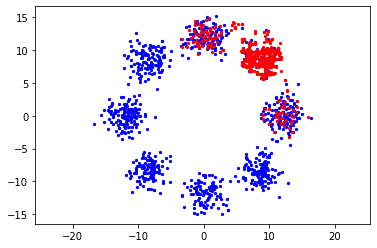

In [13]:
plt.scatter(data[:, 0], data[:, 1], s=5, color='b')
plt.scatter(generated1[:1000, 0], generated1[:1000, 1], s=5, color='r')
plt.axis('equal')
plt.show()

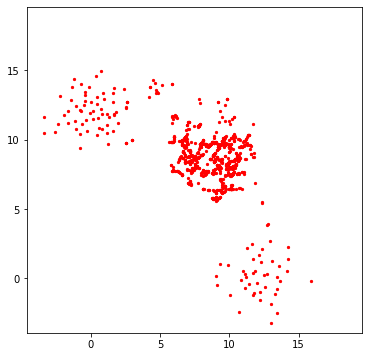

In [14]:
#%%capture
fig = plt.figure(figsize=(6,6))
#plt.scatter(data[:, 0], data[:, 1], s=5, color='b',alpha=0.3)

plt.axis('equal')
ims = [[plt.scatter(f_t[:, 0], f_t[:, 1], s=5, color='r', animated=True)] for i, f_t in enumerate(flow_t)]


ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

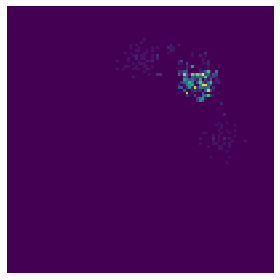

In [15]:
fig = plt.figure(figsize=(4, 4))
_ = plt.hist2d(generated1[:1000, 0].numpy(), generated1[:1000, 1].numpy(), 100, range=((-20, 20), (-20, 20)))
plt.axis('off')
plt.tight_layout()

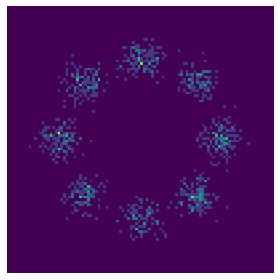

In [16]:
fig = plt.figure(figsize=(4, 4))
_ = plt.hist2d(data[:1000, 0], data[:1000, 1], 100, range=((-20, 20), (-20, 20)))
plt.axis('off')
plt.tight_layout()